<a href="https://colab.research.google.com/github/SuYenTing/esun_2021_ai_competition/blob/main/model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 玉山人工智慧挑戰賽2021夏季賽-中文手寫影像辨識
2021/06/18 蘇彥庭

由於玉山提供的手寫文字照片並不乾淨，且標註有問題，因此先針對照片進行下列的挑選及清洗：
* 移除寬度不足之照片(寬度需介於20-130)
* 移除多字照片，避免模型學習時出錯
* 將空白照片標示為null
* 修改錯誤標註之照片

模型主要以ResNet18為架構，未做pretrained，重頭開始訓練。

將圖片輸入並預測字的分類，即end-to-end方式進行訓練。

模型搭建參考文章：[PyTorch官網-FINETUNING TORCHVISION MODELS](https://pytorch.org/tutorials/beginner/finetuning_torchvision_models_tutorial.html?fbclid=IwAR1KNrLOQvLbr1CbtRVH8eHN5tbvkESBV5cTHeqT6iVHCEW0iOIj17wKGI4)

另外有應用SHAP套件，來觀察模型如何辨別圖片。

# 一、環境前置作業

In [ ]:
# 掛載Google雲端硬碟 讓colab可以讀取資料
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
# 安裝套件
!pip install shap -q

     |████████████████████████████████| 358kB 14.0MB/s 


In [ ]:
# 從Google API上下載字體放到暫存資料夾底下
!wget 'https://noto-website-2.storage.googleapis.com/pkgs/NotoSansCJKtc-hinted.zip'
!mkdir /tmp/fonts
!unzip -o NotoSansCJKtc-hinted.zip -d /tmp/fonts/
!mv /tmp/fonts/NotoSansMonoCJKtc-Regular.otf /usr/share/fonts/truetype/NotoSansMonoCJKtc-Regular.otf -f
!rm -rf /tmp/fonts
!rm NotoSansCJKtc-hinted.zip

--2021-06-18 00:08:59--  https://noto-website-2.storage.googleapis.com/pkgs/NotoSansCJKtc-hinted.zip
Resolving noto-website-2.storage.googleapis.com (noto-website-2.storage.googleapis.com)... 108.177.126.128, 2a00:1450:4013:c01::80
Connecting to noto-website-2.storage.googleapis.com (noto-website-2.storage.googleapis.com)|108.177.126.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 121247366 (116M) [application/zip]
Saving to: ‘NotoSansCJKtc-hinted.zip’

NotoSansCJKtc-hinte 100%[===================>] 115.63M   179MB/s    in 0.6s    

2021-06-18 00:09:00 (179 MB/s) - ‘NotoSansCJKtc-hinted.zip’ saved [121247366/121247366]

Archive:  NotoSansCJKtc-hinted.zip
  inflating: /tmp/fonts/LICENSE_OFL.txt  
  inflating: /tmp/fonts/NotoSansCJKtc-Black.otf  
  inflating: /tmp/fonts/NotoSansCJKtc-Bold.otf  
  inflating: /tmp/fonts/NotoSansCJKtc-DemiLight.otf  
  inflating: /tmp/fonts/NotoSansCJKtc-Light.otf  
  inflating: /tmp/fonts/NotoSansCJKtc-Medium.otf  
  inflating

In [ ]:
# 載入套件
import json
import os
import time
import re
import random
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import copy
from PIL import Image
import shutil
import pickle

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, models, transforms
import torchvision

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

import shap
import matplotlib.font_manager as font_manager

# shap設定
shap.initjs()

# 設定中文字體
font_dirs = ['/usr/share/fonts/truetype/']
font_files = font_manager.findSystemFonts(fontpaths=font_dirs)
for font_file in font_files:
  font_manager.fontManager.addfont(font_file)
plt.rcParams['font.family'] = "Noto Sans Mono CJK TC"

%matplotlib inline

In [ ]:
# 設定工作目錄
filePath = '/content/'
os.chdir(filePath)

In [ ]:
# 設定模型儲存位置
modelSaveFilePath = '/content/drive/MyDrive/玉山人工智慧競賽/'

為能夠增加模型預測效果，我們在模型中額外引入[AI-FREE-Team](https://github.com/AI-FREE-Team/Traditional-Chinese-Handwriting-Dataset)釋出的手寫照片集進行訓練。

另外，由於玉山競賽期間為4天，每天皆會發出約7,000張的照片給API Server，我們將這些照片蒐集下來，並重新標註，放入訓練集再進行訓練，以提升模型成效。

In [ ]:
# 複製資料
!cp -r '/content/drive/MyDrive/玉山人工智慧競賽/模型訓練資料.tar' 'train.tar'  # 玉山提供訓練照片集
!cp -r '/content/drive/MyDrive/玉山人工智慧競賽/multi_character.zip' 'multi_character.zip'  # 多字照片集
!cp -r '/content/drive/MyDrive/玉山人工智慧競賽/empty_character.zip' 'empty_character.zip'  # 空白照片集
!cp -r '/content/drive/MyDrive/玉山人工智慧競賽/AI-FREE-Team_handwriting.zip' 'AI-FREE-Team_handwriting.zip'  # AI-FREE-Team手寫資料辨識集(已過濾為玉山800字)
!cp -r '/content/drive/MyDrive/玉山人工智慧競賽/20210615_玉山重新標註後照片.zip' '20210615_玉山重新標註後照片.zip'  # 20210615_玉山重新標註後照片
!cp -r '/content/drive/MyDrive/玉山人工智慧競賽/20210616_玉山重新標註後照片.zip' '20210616_玉山重新標註後照片.zip'  # 20210616_玉山重新標註後照片
!cp -r '/content/drive/MyDrive/玉山人工智慧競賽/20210617_玉山重新標註後照片.zip' '20210617_玉山重新標註後照片.zip'  # 20210617_玉山重新標註後照片
!cp -r '/content/drive/MyDrive/玉山人工智慧競賽/vocab2idx.pkl' 'vocab2idx.pkl'  # 冠豪定義的字分類編號

In [ ]:
# 解壓縮資料
!tar -xf '/content/train.tar'
!unzip -qq -O big5 multi_character.zip
!unzip -qq -O big5 empty_character.zip
!unzip -qq -O big5 AI-FREE-Team_handwriting.zip
!unzip -qq -O big5 20210615_玉山重新標註後照片.zip
!unzip -qq -O big5 20210616_玉山重新標註後照片.zip
!unzip -qq -O big5 20210617_玉山重新標註後照片.zip

# 二、資料前置作業

In [ ]:
# 設定照片目錄
imagePath = '/content/train/'

In [ ]:
# 建立照片目錄清單
imageNameList = os.listdir(imagePath)
imageNameList.sort()  # 對檔名排序避免待會建立字典時跑掉
print(f'資料集總照片數為:{len(imageNameList)}')

資料集總照片數為:68804


In [ ]:
# 建立玉山800字清單
esun800charList = re.findall(r'_(\w+).\w+', ''.join(imageNameList))
esun800charList = np.unique(esun800charList)
print(f'資料集總字數為:{len(esun800charList)}')

資料集總字數為:800


In [ ]:
# 建立照片對應清單
numberImageDict = {}
for ix in range(len(imageNameList)):
    fileName = imageNameList[ix]
    numberImageDict[int(re.findall("(\d+)_\w+.\w+", fileName)[0])] = fileName

In [ ]:
# 整理每張照片的長寬大小
widthList = list()
heightList = list()
for imageName in imageNameList:
  width, height = Image.open(imagePath + imageName).size
  widthList.append(width)
  heightList.append(height)
imageSizeData = pd.DataFrame({'imgName':imageNameList, 'width': widthList, 'height': heightList})

In [ ]:
# 選取照片寬度在20至130的照片做為模型訓練與預測
selectWidthUb = 130
selectWidthLb = 20
rmImgNameList = imageSizeData[(imageSizeData['width'] > selectWidthUb) | (imageSizeData['width'] < selectWidthLb)]['imgName'].tolist()

In [ ]:
# 刪除寬度不合適之照片
for imgFileName in rmImgNameList:
    if os.path.exists(imagePath + imgFileName):
        os.remove(imagePath + imgFileName)

In [ ]:
# 刪除多字照片
for imgFileName in os.listdir('multi_character'):
    if os.path.exists(imagePath + imgFileName):
        os.remove(imagePath + imgFileName)

修改錯誤標註的照片為本次競賽其中一個重要的環節，此處我們主要採用人工修改的方式處理。

在採用人工修改方式時，主要是針對模型預測錯誤的結果進行修正，藉以提升修改處理的效率。

每次修改完一批後，重新訓練模型並預測，挑選錯誤修正後，再重新訓練模型，透過不斷疊代的方式，找出錯誤的標籤。


In [ ]:
# 要修改的照片名稱(人工修改標籤dict)
reviseCharDict = {277: '茂', 411: 'isnull', 421: '理', 465: '限', 474: '有', 631: '專', 735: 'isnull', 922: '所', 1064: '院', 1163: '委', 1233: 'isnull', 1606: '限', 1788: '公', 1965: '委', 2022: '大', 2249: '潔', 2741: 'isnull', 3289: '行', 3433: '統', 3436: 'isnull', 3598: '司', 3984: '汽', 4408: '股', 4517: '物', 4878: '公', 4944: '廈', 5339: '調', 5425: '家', 5527: '委', 5629: '統', 6576: '司', 6655: '財', 6869: '名', 7123: '建', 7141: 'isnull', 7317: '基', 7397: '司', 8051: '有', 8610: 'isnull', 8957: '理', 9032: '造', 9231: '物', 9658: '料', 9819: '盛', 9853: '山', 9904: '管', 10266: '有', 10527: '司', 10810: '股', 10958: '物', 11386: '統', 11628: '銀', 11761: '建', 12009: '公', 12111: '金', 12296: '保', 12420: '公', 12676: '理', 12903: '有', 13418: '款', 13511: '公', 13601: '國', 13791: '得', 14155: '行', 14320: '會', 14564: '公', 14710: '司', 14794: '企', 14967: '科', 15467: '設', 15811: '行', 16024: '公', 16157: '心', 16674: '洋', 16800: '有', 16991: '行', 17225: '科', 17260: '法', 17346: '司', 17584: '有', 17595: '司', 18074: '工', 18204: '專', 18308: '法', 18335: '會', 18449: '銀', 18735: '禾', 18785: '醫', 18812: '技', 19324: '有', 19560: '建', 19902: '限', 20020: '銀', 20049: '限', 20228: '家', 20472: '行', 20576: '行', 20695: '文', 21398: '技', 21571: '會', 21929: '行', 22276: '公', 22526: '公', 22666: '銀', 22889: '團', 23109: '司', 24465: '醫', 24666: '醫', 24828: '建', 24851: '限', 25028: '公', 25089: '戶', 25155: '材', 25346: '基', 25432: '有', 25848: '行', 26035: '公', 26052: '有', 26568: '分', 27152: '銀', 27218: '有', 27349: '所', 27368: '德', 27446: '限', 27933: '合', 28234: '銀', 28286: '造', 28416: '員', 28532: '企', 28649: '理', 28760: '儀', 28784: '行', 28833: '銀', 29124: '會', 29325: '行', 29352: '生', 29592: '限', 29629: '份', 30369: '造', 30419: '造', 30483: '基', 30537: '委', 30585: '民', 30849: '材', 30865: '汽', 31002: '員', 31182: '股', 31756: '合', 31794: '社', 31992: '專', 32050: '術', 32698: '司', 33051: '限', 33057: '會', 33130: '行', 33308: '權', 33311: '限', 33489: '有', 33571: '建', 33660: '有', 33865: '行', 33997: '台', 34406: '行', 34450: '之', 34530: '樂', 34734: '療', 35251: '有', 35279: '醫', 35336: '強', 35536: '新', 35589: '問', 35915: '雄', 36224: '物', 36449: '廈', 37393: 'isnull', 37771: '合', 37795: '技', 37868: '醫', 38047: '公', 38723: '股', 38811: '問', 39027: '銀', 39165: '行', 39484: '戶', 39558: '銀', 39984: '財', 39988: '有', 40106: '有', 40113: '有', 40630: '銀', 40983: '技', 40993: '理', 41028: '容', 41093: '汽', 41238: '裝', 42077: '專', 43059: '有', 43177: '份', 43389: 'isnull', 43397: '會', 44206: '限', 44555: 'isnull', 44969: '有', 45244: '款', 45514: '基', 45658: '行', 45798: 'isnull', 45879: '院', 46062: '系', 46156: '社', 46356: '行', 46463: '問', 46714: '汽', 46801: '材', 46998: '專', 47246: '限', 47757: '樓', 48148: '款', 48214: '戶', 48537: '行', 48580: '新', 48599: '保', 48860: '會', 48937: '份', 49173: '股', 49701: '院', 49889: '有', 50163: '大', 50193: '客', 50522: '材', 50640: '管', 51063: '禾', 51119: '有', 51125: '股', 51641: '限', 51783: '銷', 51929: '金', 52097: '社', 52127: '品', 52198: '科', 52235: '大', 52679: '科', 52745: '廈', 52780: '合', 53088: '委', 53125: '行', 53445: '行', 53584: '限', 53751: '山', 54109: '小', 54193: '會', 54248: '社', 54335: '有', 54551: '銀', 54777: '大', 55367: '有', 55405: '昇', 55518: '局', 55552: '款', 56055: '金', 56126: '社', 56215: '限', 56437: '大', 56460: '金', 56525: '合', 56533: '管', 56701: '統', 56730: '款', 56856: '員', 57022: '行', 57248: '有', 57529: '銀', 57873: '行', 57936: '大', 58121: '有', 58609: '律', 59029: '理', 59075: '法', 59107: '員', 59152: '商', 59855: '有', 60420: '限', 61198: '有', 61284: '禾', 61418: '限', 61574: '客', 61770: '行', 61813: '儀', 61901: 'isnull', 62250: '法', 62655: '戶', 62844: '款', 62870: '保', 63128: '限', 63513: '公', 63586: '醫', 63763: '合', 64249: '造', 64318: '限', 64344: '股', 65147: '銀', 65212: '金', 65426: '聯', 65578: '公', 65672: '公', 65729: '元', 65820: '計', 65852: '材', 65930: '限', 66346: '司', 66514: '司', 66520: '委', 66582: '物', 66692: '限', 66772: '科', 67406: '基', 67539: '理', 67567: '問', 67694: '科', 68061: '理', 68165: '廈', 68346: '德', 68428: '行', 68441: '系', 68635: '行', 68676: '股', 19968: 'isnull', 45058: 'isnull', 59909: 'isnull', 10758: 'isnull', 16391: 'isnull', 29196: 'isnull', 25102: 'isnull', 57358: 'isnull', 22548: 'isnull', 60953: 'isnull', 32798: 'isnull', 60446: 'isnull', 25120: 'isnull', 50721: 'isnull', 31277: 'isnull', 32815: 'isnull', 23088: 'isnull', 17970: 'isnull', 25650: 'isnull', 41019: 'isnull', 47165: 'isnull', 30799: 'isnull', 22097: 'isnull', 62567: 'isnull', 65646: 'isnull', 4719: 'isnull', 10863: 'isnull', 51833: 'isnull', 11902: 'isnull', 50306: 'isnull', 66691: 'isnull', 3204: 'isnull', 60042: 'isnull', 54411: 'isnull', 5775: 'isnull', 37009: 'isnull', 65169: 'isnull', 31891: 'isnull', 40084: 'isnull', 16543: 'isnull', 5796: 'isnull', 52400: 'isnull', 36532: 'isnull', 21175: 'isnull', 66747: 'isnull', 21186: 'isnull', 14027: 'isnull', 26828: 'isnull', 53963: 'isnull', 62159: 'isnull', 53456: 'isnull', 14545: 'isnull', 6361: 'isnull', 38626: 'isnull', 13539: 'isnull', 65251: 'isnull', 39143: 'isnull', 33516: 'isnull', 9454: 'isnull', 26354: 'isnull', 43255: 'isnull', 4346: 'isnull', 63227: 'isnull', 51967: 'isnull', 47366: 'isnull', 21269: 'isnull', 15146: 'isnull', 14124: 'isnull', 63277: 'isnull', 67375: 'isnull', 31024: 'isnull', 62257: 'isnull', 27459: 'isnull', 14665: 'isnull', 51017: 'isnull', 33104: 'isnull', 38244: 'isnull', 9063: 'isnull', 39271: 'isnull', 65895: 'isnull', 20331: 'isnull', 57198: 'isnull', 50039: 'isnull', 20343: 'isnull', 62328: 'isnull', 34694: 'isnull', 36744: 'isnull', 13708: 'isnull', 14222: 'isnull', 22416: 'isnull', 62972: 'isnull', 10654: 'isnull', 7071: 'isnull', 38821: 'isnull', 7595: 'isnull', 65975: 'isnull', 23993: 'isnull', 67521: 'isnull', 54725: 'isnull', 61389: 'isnull', 28627: 'isnull', 5082: 'isnull', 57320: 'isnull', 43508: 'isnull', 10741: 'isnull', 34296: 'isnull', 19964: 'isnull', 1779: '股', 2447: 'isnull', 3942: '股', 4019: '股', 5046: 'isnull', 5724: '實', 10475: 'isnull', 11033: 'isnull', 12026: '文', 12240: 'isnull', 13490: '學', 14422: '金', 15280: '凱', 16211: '股', 16388: '限', 16679: 'isnull', 17077: '企', 17520: '農', 18747: 'isnull', 21273: 'isnull', 22155: '鴻', 23103: 'isnull', 23664: '益', 28654: 'isnull', 29138: 'isnull', 30766: 'isnull', 30774: '司', 30914: 'isnull', 32378: '金', 32419: 'isnull', 32835: 'isnull', 33577: 'isnull', 35523: 'isnull', 39625: '理', 39685: 'isnull', 41071: 'isnull', 42590: 'isnull', 42753: '公', 43433: 'isnull', 44967: '國', 47547: 'isnull', 47992: '雄', 48606: '金', 49150: 'isnull', 49816: '企', 50439: 'isnull', 50695: 'isnull', 50819: '戶', 56537: '股', 57132: 'isnull', 57214: 'isnull', 59117: 'isnull', 60259: '寧', 61029: 'isnull', 62720: 'isnull', 62758: 'isnull', 62775: 'isnull', 63568: '企', 64739: 'isnull', 65206: 'isnull', 67850: 'isnull', 616: '款', 7137: '股', 7339: '代', 8588: '股', 9484: 'isnull', 9563: '林', 9954: '生', 10168: '谷', 10482: '設', 10610: '天', 10802: '忠', 10972: '事', 13379: '三', 15148: '群', 17013: '國', 18382: '廣', 19024: '生', 19156: '師', 20865: '刷', 21940: '室', 21965: 'isnull', 22912: '會', 23275: '倉', 24304: '分', 24755: '會', 25450: '證', 26507: '女', 26795: '大', 28186: '程', 28377: '公', 29260: '三', 29814: '工', 30819: '志', 31202: '大', 31241: '診', 31602: '新', 33255: 'isnull', 33711: '凱', 34241: '花', 34366: '裝', 34978: '建', 35726: '企', 36406: '振', 38224: '空', 38599: '吉', 39187: '金', 39386: '士', 39399: '館', 39478: '惠', 39618: '會', 39867: '食', 40039: 'isnull', 40176: '家', 40887: '聯', 44623: '銷', 44826: '公', 45034: '股', 45614: '社', 45640: '會', 46014: '兆', 47650: '廠', 47854: '意', 48217: '金', 48369: '通', 48476: '樺', 49412: '所', 49623: '群', 51883: '員', 52275: '倉', 53058: 'isnull', 54674: '戴', 54959: 'isnull', 55195: '理', 56073: '易', 56426: '員', 56803: '台', 58302: '智', 61657: '香', 62132: 'isnull', 64079: '鈞', 64359: '士', 66078: '立', 66806: '仙', 67249: '基', 67336: '化', 68685: '介', 502: '機', 1745: '建', 2357: '御', 4925: '資', 8380: '店', 8907: '裕', 11276: '物', 11940: '設', 13159: '有', 14373: '維', 16240: '限', 16734: '會', 18698: '股', 18709: '務', 19971: '客', 27366: '郁', 29071: 'isnull', 29555: '分', 29976: '業', 30366: '事', 31319: '設', 31601: '有', 32096: '股', 33277: '管', 33685: '產', 33893: '公', 35164: '工', 35221: '業', 35386: '物', 37915: '生', 37960: '易', 39507: '光', 40538: '工', 40541: '投', 40836: 'isnull', 41899: '整', 42141: '股', 42337: '企', 44103: '通', 44698: '業', 45379: '公', 46910: '管', 47157: '和', 47226: '務', 47875: '葉', 48524: '達', 50345: 'isnull', 50377: '委', 50486: '裕', 50705: '昭', 51355: '凍', 51516: '有', 51651: '永', 52243: '股', 53622: '海', 53968: '證', 54237: '鋼', 55437: '券', 55526: '力', 55896: '法', 56368: '計', 56425: '學', 56882: '公', 56954: '航', 57560: '券', 58942: '材', 59368: '銷', 59708: '診', 60479: '月', 61146: '銷', 61279: '董', 61443: '所', 62140: '行', 62929: '股', 63241: '內', 63419: '玻', 63904: '重', 64574: '惠', 64825: '君', 65323: '武', 65611: '教', 65834: '品', 66275: '股', 67710: '行', 67888: '業', 68286: '有', 109: '管', 253: '明', 440: '交', 626: '立', 656: '食', 750: '券', 1427: '顧', 1556: '金', 1594: '法', 1617: '戶', 2736: '銀', 2759: '言', 3028: '克', 3132: '交', 4113: '食', 4114: '怡', 4795: '事', 5752: '力', 5807: '國', 6019: '文', 6474: '資', 6642: '社', 7122: '金', 7180: '錦', 7523: '展', 7753: '歐', 7907: '森', 7978: '長', 8540: '業', 8918: '鐵', 8973: '管', 9104: '修', 9750: '文', 9804: '兒', 9860: '長', 11091: '管', 11490: '亞', 11721: '政', 11723: '國', 11788: '家', 12090: '土', 12752: '業', 13040: '有', 13148: '股', 13995: '社', 14189: '育', 14650: '社', 15091: '建', 15171: '私', 15329: '新', 17092: '業', 17467: '社', 18203: '工', 19550: '社', 19976: '專', 20071: '慧', 20149: '業', 20219: '行', 20557: '國', 21390: '電', 21483: '股', 21859: '業', 22138: '有', 22753: '道', 22833: '證', 22936: '理', 23009: '保', 23114: '戶', 23284: '房', 23334: '管', 23545: 'isnull', 23767: '保', 23769: '企', 24300: '有', 24545: '設', 25280: '女', 25542: '限', 27126: '金', 27324: '商', 47: '鴻', 61: '美', 152: '管', 431: 'isnull', 737: '室', 803: 'isnull', 806: '事', 1042: '券', 1123: '石', 1161: '仲', 1250: '研', 1503: '順', 1540: '北', 1921: '成', 2111: '大', 2254: '國', 2354: '務', 2554: '木', 2706: '登', 2764: '國', 2783: '宏', 2813: '代', 2837: 'isnull', 2911: '韋', 3000: '城', 3059: '食', 3110: '丁', 3386: '產', 3493: '區', 3671: '鋒', 3710: '振', 3760: '扶', 3784: '市', 3836: '嘉', 3847: '侑', 4004: '工', 4148: '輪', 4314: '限', 4366: '工', 4393: '鐘', 4629: '婷', 4632: '運', 4653: '和', 4897: '世', 5039: 'isnull', 5144: '法', 5170: '水', 5195: '數', 5227: '業', 5238: '碧', 5384: '原', 5598: '運', 5682: '有', 6063: '紙', 6157: '信', 6442: '灣', 6476: '國', 6503: '告', 6541: '可', 6799: '里', 6847: '鴻', 6864: '臺', 6934: '科', 7234: '合', 7236: '戶', 7435: '山', 7569: '合', 8347: '盟', 8389: '汽', 8740: '麗', 8806: '投', 8976: '理', 9139: '國', 9206: '金', 9279: '記', 9284: '專', 9600: 'isnull', 9767: '限', 9966: '社', 10183: '業', 10204: '工', 10239: '塑', 10513: '雅', 10651: '法', 10663: '真', 10715: '行', 11219: '國', 11349: '限', 11552: '立', 11588: 'isnull', 11639: '三', 11648: '清', 11997: '理', 12209: '膠', 12248: '用', 13023: '股', 13044: '師', 13193: '地', 13235: '技', 13275: '員', 13297: '塑', 13454: '樹', 13460: 'isnull', 13528: '廖', 13592: 'isnull', 13676: '昱', 13805: '葉', 13818: '問', 14269: 'isnull', 14305: '製', 14547: '資', 14604: '造', 14739: '創', 14885: '股', 14896: '投', 14930: '周', 15309: '祥', 15456: '股', 15549: '戶', 15564: 'isnull', 15639: '方', 15884: 'isnull', 16065: '股', 16162: '吉', 16174: '達', 16197: '有', 16266: '育', 16275: '食', 16336: '景', 16355: '麗', 16366: '醫', 16399: '金', 16915: '扶', 17151: '屋', 17358: '保', 17376: '言', 17523: '設', 17533: '和', 17856: '福', 17896: '誠', 18156: '環', 18366: '林', 18424: '晟', 18475: '張', 18669: '員', 18839: '理', 18918: '醫', 18928: '械', 19241: '水', 19466: '郁', 19982: '汽', 20146: '整', 20265: '有', 20412: '嘉', 20429: '聯', 20444: '實', 20492: '華', 20564: '國', 20575: '意', 20719: '品', 20837: '醫', 20846: '昇', 20986: '元', 21030: '輪', 21131: '苑', 21906: 'isnull', 21219: '券', 21476: 'isnull', 21613: '社', 22056: '志', 22082: 'isnull', 22151: '東', 22306: '木', 22387: '柔', 22551: '證', 22593: '暉', 22709: '順', 22765: '宏', 22943: '菱', 22983: '室', 23003: '時', 23031: '企', 23202: '義', 23643: 'isnull', 23876: '保', 23958: '司', 24144: '瑋', 24234: '采', 24367: 'isnull', 24682: '問', 24954: '龍', 24963: '公', 25654: 'isnull', 25657: '英', 25742: '密', 25749: '金', 26304: '曉', 26590: 'isnull', 26666: '五', 26978: '業', 27305: '漢', 27329: '慶', 27420: 'isnull', 27769: '車', 27770: '創', 27965: '興', 28125: '保', 28260: '國', 28439: '凌', 28558: '同', 28564: '社', 29026: '盛', 29115: 'isnull', 29134: '聯', 29216: '綺', 29329: '市', 29468: '社', 29535: '昭', 29666: '灣', 29695: '社', 29777: '凱', 29791: '科', 30006: '城', 30057: '券', 30113: '委', 30437: '行', 30514: '保', 30727: '儒', 30786: '創', 30877: '造', 31159: '禾', 31391: 'isnull', 31438: '美', 31480: '務', 31563: '書', 31572: '達', 31678: '儀', 31715: '證', 31778: '份', 31800: '張', 31846: 'isnull', 31878: '器', 31922: '政', 31957: '事', 32120: '業', 32404: '仲', 32647: '哲', 32689: '月', 32816: '不', 32853: '軒', 33090: '股', 33233: '企', 33505: 'isnull', 33510: '維', 33637: '木', 33706: '區', 33831: '大', 33838: '張', 34002: '耀', 34230: '金', 34369: '料', 34506: '料', 35007: '委', 35213: '力', 35268: '科', 35499: '喜', 35708: '程', 35749: '所', 35844: '億', 35892: '地', 35961: '松', 36187: '世', 36204: '智', 36218: '時', 36311: '飾', 36329: '浩', 36411: '份', 36499: '社', 36752: 'isnull', 36929: '業', 37059: 'isnull', 37287: '技', 37343: '股', 37460: '工', 37730: '銀', 37953: 'isnull', 38126: '企', 38200: '氣', 38234: '食', 38697: '李', 38953: 'isnull', 39193: '材', 39324: '晟', 39347: '易', 39460: '人', 39652: '中', 39674: '運', 39800: '中', 39892: '股', 40317: '景', 40468: '源', 40585: '台', 40860: '天', 40978: '晴', 41000: '鼎', 41285: '股', 41863: '視', 41947: '業', 41959: '瑩', 41979: '司', 42072: 'isnull', 42088: '得', 42109: '玲', 42131: '正', 42199: '醫', 42211: '空', 42277: '兒', 42322: '特', 42408: '行', 42885: '民', 42981: '交', 43014: '位', 43043: '證', 43373: '社', 43513: '仕', 43519: '業', 43643: '戶', 43761: '戶', 43770: '證', 43876: '動', 43933: '上', 43961: '司', 43986: '汽', 44092: '食', 44301: '設', 44324: '車', 44567: '限', 44569: '勝', 44571: '國', 44720: '企', 44728: '仲', 44909: '事', 45072: '企', 45316: '醫', 45646: '保', 45704: '日', 45730: '社', 45754: '武', 45854: '思', 46074: '中', 46306: '器', 46338: '月', 46401: '易', 46729: '樂', 46738: '陽', 46761: '鑫', 46817: '務', 47174: '公', 47203: '洲', 47327: '台', 47379: '所', 47388: '黎', 47522: '園', 47549: '員', 47604: '邦', 47907: '國', 47908: '告', 48093: '凱', 48159: 'isnull', 48237: '威', 48354: '專', 48373: '法', 48441: '有', 48626: '合', 48654: '工', 48707: '社', 48715: '台', 49051: '信', 49102: '明', 49264: '金', 49335: '永', 49367: '理', 49963: '器', 50026: '祥', 50275: '發', 50443: '朝', 50607: 'isnull', 50809: '設', 51042: '師', 51180: '佩', 51568: '業', 51702: '社', 51717: 'isnull', 51743: '力', 52291: '機', 52600: '器', 52661: '車', 52692: '漢', 53266: 'isnull', 53267: '股', 53282: '企', 53459: '電', 53650: '社', 53859: '社', 53862: '平', 54297: 'isnull', 54311: '技', 54399: '企', 54752: '民', 54838: '家', 54847: '司', 54988: '戶', 55067: '月', 55455: '開', 55657: '斯', 55934: '進', 56120: '青', 56204: '淑', 56346: '用', 56465: '環', 56961: 'isnull', 57296: '分', 57445: '股', 57682: '兒', 57802: '祥', 57842: '企', 57847: '理', 57954: '行', 58004: '貿', 58105: '際', 58337: '護', 58382: '工', 58396: '報', 58952: '機', 58984: '廠', 59037: '股', 59112: '全', 59169: '室', 59489: '券', 59512: '生', 59613: '理', 59940: '業', 59984: '師', 60026: '運', 60056: '醫', 60107: '券', 60467: '東', 60754: '石', 61084: '晨', 61194: '成', 61407: '斯', 61433: 'isnull', 61456: '芬', 61494: '刷', 61556: '投', 61585: '流', 61942: '添', 61990: '台', 62030: '份', 62031: '用', 62713: '顧', 62878: '企', 63174: '竹', 63280: '管', 63329: '北', 63576: '品', 63689: '陳', 63706: '長', 63710: '社', 63768: '精', 63883: '通', 63919: '伯', 64073: '廠', 64227: '機', 64355: '股', 64491: '限', 64942: 'isnull', 64951: '企', 65144: '亞', 65517: '師', 65564: '許', 65759: '公', 66291: '企', 66312: '電', 66609: '車', 66614: '業', 66688: '金', 66751: 'isnull', 66922: '力', 67019: '材', 67024: '會', 67447: 'isnull', 67596: '藝', 67921: '有', 67978: '輪', 68144: '工', 68193: '電', 68271: '資', 68342: '鐵', 68581: '證', 68634: '管', 68724: '租', 68772: '管'}

In [ ]:
reviseCharDict2 = {24559: 'isnull', 58186: 'isnull', 26406: '貿', 46000: '員', 10583: '林', 19224: '林', 65703: '體', 54560: '林', 20305: '有', 62081: '有', 28719: '有', 30367: '有', 15390: '有', 51949: '有', 8166: '有', 40372: '有', 26393: '有', 37959: '有', 40901: 'isnull', 28290: '環', 27949: '有', 45980: '達', 16622: 'isnull', 32372: '企', 11134: '行', 42908: '會', 11048: '行', 46192: '家', 2202: '行', 57404: '會', 34145: '品', 56245: 'isnull', 60132: '能', 9081: 'isnull', 9113: 'isnull', 2402: '管', 62197: '三', 48642: 'isnull', 25374: 'isnull', 41735: 'isnull', 23318: 'isnull', 7749: '幼', 12962: '品', 19296: '品', 30266: 'isnull', 24519: 'isnull', 34229: '育', 12817: 'isnull', 16132: 'isnull', 27119: 'isnull', 37650: '工', 23499: 'isnull', 4703: '杜', 45537: '杜', 47246: '限', 25742: '密', 41238: '裝', 62159: 'isnull', 25542: '限', 34506: '科', 9658: '料', 66669: '廣', 13023: '股', 66424: '聚', 21594: 'isnull', 16915: '扶', 6474: '資', 62492: 'isnull', 41000: '鼎', 61626: '境', 23415: '泰', 21411: '有', 59201: '有', 22234: '有', 51516: '有', 17010: '企', 53104: 'isnull', 37784: 'isnull', 66221: 'isnull', 40945: '智', 20757: 'isnull', 17856: '福', 59806: '謙', 7839: 'isnull', 9271: 'isnull', 39327: 'isnull', 66315: '企', 13193: '地', 61979: 'isnull', 31309: 'isnull', 30786: '創', 25533: 'isnull', 8937: 'isnull', 11349: '限', 23545: 'isnull', 59712: '有', 64769: '公', 16282: '士', 17781: '商', 26539: '上', 31680: 'isnull', 32174: '金', 33637: '木', 45654: '利', 59262: 'isnull', 56947: 'isnull', 13166: '修', 56961: 'isnull', 5084: '嬌', 34988: '芳', 28186: '程', 58302: '智', 32698: '司', 9767: '限', 23088: 'isnull', 3204: 'isnull', 65820: '計', 44324: '車', 23109: '司', 44567: '限', 8806: '投', 28794: 'isnull', 8120: '術', 12248: '用', 53584: '限', 29352: '生', 64318: '限', 30367: '有', 40113: '有', 43389: 'isnull', 24385: 'isnull', 4140: 'isnull', 58013: '行', 52161: '瑪', 63871: 'isnull', 62256: '股', 57904: 'isnull', 12617: 'isnull', 52430: '限', 40557: '文', 60625: 'isnull', 16638: '國', 50505: '國', 27406: 'isnull', 35964: '勝', 10743: '兒', 59692: '喬', 45115: '大', 34692: 'isnull', 44056: '早', 50215: '芝', 9092: 'isnull', 32886: 'isnull', 4747: 'isnull', 14314: '李', 53850: '工', 14615: '呈', 25499: 'isnull', 23446: 'isnull', 26749: '醫', 21669: 'isnull', 554: 'isnull', 50284: 'isnull', 8633: '位', 27517: 'isnull', 58997: 'isnull', 58686: '恩', 27513: 'isnull', 36701: 'isnull', 1246: 'isnull', 31901: '樂', 3466: '蘭', 54582: '動', 43746: '泰', 23534: 'isnull', 45911: '不', 12686: '標', 47974: '不', 28831: '不', 34171: '示', 9727: 'isnull', 62347: '德', 67591: '禧', 22302: '養', 63952: 'isnull', 28242: '站', 60926: '福', 68252: '福', 58380: '翔', 24647: 'isnull', 33995: '實', 47122: 'isnull', 55085: '大', 29075: '力', 720: '備', 23291: 'isnull', 53912: 'isnull', 25401: '禾', 45779: 'isnull', 2700: 'isnull', 27066: '禾', 59013: '禾', 14972: '眾', 8618: '禾', 26074: '店', 40940: '絜', 44775: '務', 68016: 'isnull', 49077: '鴿', 57855: '泰', 64688: '電', 47218: 'isnull', 66016: 'isnull', 1098: 'isnull', 2556: 'isnull', 10176: 'isnull', 21708: 'isnull', 22771: 'isnull', 54511: 'isnull', 65864: 'isnull', 43210: '陽', 49730: 'isnull', 39461: 'isnull', 23133: 'isnull', 33367: 'isnull', 24669: '所', 35248: 'isnull', 63435: '業', 31688: 'isnull', 63877: 'isnull', 12319: '旅', 20675: 'isnull', 24473: '壢', 14690: 'isnull', 51095: '工', 21751: '銘', 31792: '有', 4580: '沃', 44842: '金', 55077: '金', 30743: 'isnull', 30956: '有', 40437: '金', 3763: '戶', 9985: '肖', 20463: '肖', 56636: '有', 27159: '盟', 36423: 'isnull', 53250: '會', 29094: 'isnull', 65426: 'isnull', 15235: '建', 52924: 'isnull', 18730: 'isnull', 31142: '名', 53315: 'isnull', 18858: '慶', 7484: '慶', 35702: '投', 30562: '羿', 11063: 'isnull', 44165: '小', 25655: '發', 46182: '管', 30167: '理', 48113: 'isnull', 41370: '馬', 10247: '鑑', 63718: '旨', 35582: '區', 1942: 'isnull', 21368: 'isnull', 59842: '冷', 51923: 'isnull', 33165: 'isnull', 46516: '膠', 33349: 'isnull', 67503: '體', 6786: 'isnull', 20602: 'isnull', 42497: 'isnull', 56518: 'isnull', 61371: '大', 33964: '金', 43949: '金', 52389: '吳', 9268: '政', 59666: '建', 59731: '兌', 23361: '兌', 18373: '鴿', 45935: '城', 52434: '讀', 17669: 'isnull', 61477: '茶', 37809: '謝', 26664: 'isnull', 45507: '方', 60190: '方', 19352: '方', 210: '法', 11403: '商', 60052: 'isnull', 39885: '道', 30872: '行', 60278: '港', 19129: 'isnull', 15595: 'isnull', 48173: 'isnull', 26695: '暉', 1878: 'isnull', 42435: '華', 38209: '灣', 22643: 'isnull', 48169: '去', 65125: '慶', 19544: '戴', 24742: '和', 19295: '力', 4536: 'isnull', 17800: '友', 51157: '航', 29263: '笙', 8257: '築', 52747: '築', 7568: '頁', 7559: 'isnull', 9699: '建', 30898: '建', 35428: 'isnull', 46793: 'isnull', 17707: '究', 65315: '石', 10645: '究', 52505: '石', 10075: '香', 55134: '數', 38960: '信', 29020: '動', 19478: '元', 50323: '機', 40863: '言', 6384: '幣', 26395: '市', 40032: '賃', 19694: '金', 53143: 'isnull', 45489: '有', 63945: '有', 52469: '有', 5524: '有', 54137: '有', 12346: '有', 34898: '有', 13993: '有', 30620: '有', 18288: '有', 14111: '有', 45158: '有', 66012: 'isnull', 66605: 'isnull', 47674: '事', 4185: 'isnull', 47438: 'isnull', 65204: 'isnull', 24028: '倪', 7165: 'isnull', 24419: '科', 1163: '會', 31348: 'isnull', 19521: '合', 13967: '會', 42693: '會', 64025: '會', 36104: '會', 33619: '會', 27828: 'isnull', 27956: '佩', 20317: '和', 24732: '國', 13228: '企', 15944: '企', 67581: '企', 29020: '企', 66364: '實', 22522: '實', 21588: '展', 16856: '密', 68537: 'isnull', 29970: 'isnull', 15955: 'isnull', 9524: 'isnull', 43589: 'isnull', 9186: 'isnull', 60194: 'isnull', 29737: 'isnull', 10376: 'isnull', 50835: '用', 47650: '廚', 46288: 'isnull', 35540: '周', 21218: '電', 17059: 'isnull', 26395: '市', 50454: 'isnull', 23464: 'isnull', 65790: '士', 33029: '工', 54439: 'isnull', 17047: 'isnull', 66732: 'isnull', 13523: '日', 41632: '有', 9279: '記', 12077: 'isnull', 2238: 'isnull', 39413: '運', 32605: 'isnull', 65784: 'isnull', 38618: 'isnull', 50700: 'isnull', 60819: 'isnull', 40983: 'isnull', 25956: '會', 16666: 'isnull', 12685: 'isnull', 51535: 'isnull', 64453: 'isnull', 27361: 'isnull', 49907: '國', 21578: 'isnull', 12104: '技', 7601: 'isnull', 65540: 'isnull', 21184: 'isnull', 55902: '有', 68532: 'isnull', 1190: '貝', 40709: '言', 42571: '享', 17601: '電', 51556: 'isnull', 282: '霓', 66018: 'isnull', 39578: 'isnull', 44864: 'isnull', 32752: 'isnull', 12636: '友', 19253: 'isnull', 56729: 'isnull', 2246: '有', 57988: '爵', 4513: '白', 47593: '易', 1760: 'isnull', 40927: '霞', 60312: 'isnull', 30751: 'isnull', 34190: 'isnull', 40709: '言', 1197: 'isnull', 60822: '然', 57943: '順', 66835: 'isnull', 3134: '股', 32205: 'isnull', 11728: 'isnull', 13549: '白', 32785: 'isnull', 53612: '屯', 36399: 'isnull', 35054: 'isnull', 7915: '會', 26676: 'isnull', 10647: '股', 13512: '展', 52201: 'isnull', 33311: '有', 25589: 'isnull', 14142: 'isnull', 21558: '展', 18846: '屋', 28099: '言', 62957: '弘', 19444: 'isnull', 40782: '整', 28700: 'isnull', 41978: '業', 4200: 'isnull', 44830: '弓', 34223: '股', 30328: 'isnull', 23419: '心', 1190: '貝', 48008: '榮', 36810: '言', 30144: '羽', 31717: '秀', 14525: '信', 45799: 'isnull', 8316: '餐', 10021: '境', 62054: '郭', 16116: '堯', 15823: 'isnull', 9572: '路', 7879: '全', 13451: 'isnull', 25142: '官', 23921: 'isnull', 41739: '有', 61507: 'isnull', 16778: '脂', 33549: 'isnull', 54308: 'isnull', 37783: 'isnull', 16640: 'isnull', 30209: '戶', 41554: '膠', 6339: 'isnull', 38161: '災', 63310: 'isnull', 68751: '份', 10368: '技', 39457: 'isnull', 8582: 'isnull', 1024: 'isnull', 55900: '大', 17121: 'isnull', 10855: '戶', 16614: 'isnull', 51467: 'isnull', 32832: '限', 42353: 'isnull', 27305: '淨', 33525: 'isnull', 16423: '言', 38951: '修', 31341: '家', 60522: 'isnull', 50009: 'isnull', 31781: '君', 63652: '建', 3070: '丘', 17758: 'isnull', 29986: '累', 11478: '言', 37128: '會', 29554: '享', 61154: 'isnull', 26021: '台', 1728: 'isnull', 36550: 'isnull', 65202: 'isnull', 8660: '棒', 63121: 'isnull', 44383: 'isnull', 34741: '恩', 1427: '顧', 40372: '有', 16477: '有', 37653: '頁', 13040: '有', 14674: 'isnull', 54559: '頁', 34898: '有', 32808: 'isnull', 2702: 'isnull', 12119: '尼', 34285: '全', 3385: '工', 10879: '何', 19103: '縣', 46972: 'isnull', 15250: '念', 37798: '象', 36749: 'isnull', 37493: 'isnull', 5455: 'isnull', 31764: '宇', 24393: '宏', 22393: 'isnull', 16966: '股', 59647: '爾', 49220: 'isnull', 34627: 'isnull', 57464: '事', 18849: '華', 60651: '權', 28102: 'isnull', 51768: 'isnull', 38203: '練', 39696: '戶', 8248: 'isnull', 8253: '團', 40394: '師', 35175: 'isnull', 16185: 'isnull', 52114: '居', 48429: 'isnull', 93: '公', 4351: '行', 52441: '股', 2266: '日', 12627: '慧', 22927: '楊', 7126: '芬', 1825: '樂', 57262: '豐', 3841: '協', 24144: '樺', 42345: '華', 32928: '科', 23112: '設', 35071: '行', 52488: '潔', 16067: '安', 59062: 'isnull', 3967: '股', 31291: '旺', 57135: 'isnull', 49948: '士', 10238: '麗', 60181: '有', 58484: '輪', 16728: 'isnull', 984: '所', 36329: '造', 11675: '欣', 11413: '諭', 12627: '慧', 10351: '生', 30132: '企', 8259: '理', 14048: '運', 48039: '經', 15120: '連', 59693: '科', 48271: '數', 61944: '紀', 62816: '實', 61683: '文', 13675: '私', 66268: '園', 15694: 'isnull', 50835: '電', 4: '份', 28549: '宇', 36562: '世', 63362: '道', 25739: '塑', 15204: '田', 64277: '開', 12721: '化', 62475: '百', 50816: 'isnull', 1613: 'isnull', 66326: '網', 13544: '技', 66168: '普', 25817: '台', 38778: '精', 10984: 'isnull', 7847: '縣', 29971: '旅', 1057: '廣', 45294: '真', 21118: '股', 47316: 'isnull', 10583: '材', 18242: '立', 62910: '金', 18998: '會', 66543: '貝', 64516: 'isnull', 56825: '啟', 22387: '秉', 42434: 'isnull', 18259: '土', 229: '券', 47107: '券', 47656: '有', 62744: '峰', 27969: '意', 44175: '震', 64570: '農', 13412: '旅', 13024: 'isnull', 21435: '技', 758: '裝', 37171: '登', 10876: '所', 66517: 'isnull', 26120: '務', 55590: '醫', 52236: '運', 24735: '獅', 35599: '科', 49994: '公', 51285: '員', 2682: '室', 57906: '紀', 6923: '彤', 32184: '雅', 31466: '園', 13512: '行', 37476: '辦', 66966: '淳', 34216: 'isnull', 18212: '苑', 42606: '貿', 40470: '達', 12364: '群', 66198: '蓮', 270: '業', 47040: '數', 20473: '辰', 59175: '農', 12904: '際', 26363: 'isnull', 714: '林', 58674: '市', 8593: '國', 7045: '廣', 47121: 'isnull', 44043: '杜', 25639: '股', 68697: 'isnull', 5951: '益', 63727: '室', 51726: 'isnull', 61912: 'isnull', 32504: '揚', 62910: '金', 61067: '實', 51285: '員', 7847: '縣', 28809: '石', 48975: 'isnull', 24961: 'isnull', 42363: '府', 64616: '臣', 54518: '電', 59686: '科', 64946: '股', 23830: '貿', 6362: '理', 53103: '資', 56109: '限', 45465: '日', 20869: '昇', 52163: '密', 53785: 'isnull', 50351: '行', 48598: 'isnull', 58000: '專', 39072: 'isnull', 26903: 'isnull', 60840: '體', 54426: 'isnull', 46242: 'isnull', 65359: '益', 44596: 'isnull', 6888: '神', 39922: 'isnull', 40854: 'isnull', 31256: 'isnull', 45267: 'isnull', 32339: 'isnull', 5239: '蕭', 35571: 'isnull', 4234: 'isnull', 18070: 'isnull', 37697: '雲', 32881: '程', 2458: 'isnull', 16059: '乾', 52987: 'isnull', 24590: '會', 63217: '室', 40360: '晟', 27014: '進', 44812: 'isnull', 48625: '艾', 16222: '克', 55059: '利', 50407: '馬', 39900: '黃', 437: 'isnull', 64969: '縣', 66522: 'isnull', 53260: '妮', 45633: '社', 17493: '游', 34449: '飯', 59744: '國', 60709: '股', 56081: '蓁', 31736: '承', 4237: '交', 2341: '禾', 37379: '鑫', 45526: '內', 22927: '聚', 17615: '家', 59876: '陳', 68284: '青', 32467: 'isnull', 55018: '網', 45266: '能', 64547: '份', 51640: '購', 53316: '資', 60190: '方', 33856: '脂', 62085: '協', 37956: '政', 22823: '調', 20309: '有', 39317: '限', 32598: '限', 44257: '廣', 59755: '司', 49892: '科', 54658: '環', 14381: '興', 41236: '浩', 19854: '膠', 48598: '行', 22267: '聯', 40982: '易', 54992: '社', 47170: '護', 35783: '凱', 46000: '林', 32738: '蘭', 51894: 'isnull', 64946: '股', 15429: '蓉', 33088: '旅', 6922: '公', 59686: '科', 39077: 'isnull', 46813: '股', 45911: '古', 33786: '家', 65656: '大', 67422: '茂', 54040: '會', 474: '限', 31641: '棧', 55459: '甫', 4056: '國', 12997: '內', 59155: 'isnull', 4766: '理', 44695: '白', 54485: '真', 26634: '籌', 54527: '源', 60318: '彩', 15328: '羅', 47738: '宸', 2030: '化', 15959: '鋼', 45497: '鋼', 50301: '張', 38972: '刷', 54860: '運', 52515: '廷', 64173: '君', 18328: '紋', 5294: '車', 55023: '今', 40726: '管', 56835: '管', 59104: '有', 50591: '德', 2862: '室', 21285: '企', 56449: '佑', 19059: '伊', 59056: '祥', 60314: '社', 10769: '金', 15294: '輝', 22984: '局', 30676: '企', 34114: 'isnull', 14318: '像', 50818: '保', 18070: 'isnull', 22935: '強', 16161: '密', 50365: '玉', 48613: '翔', 29459: '會', 63978: '工', 50423: '兒', 38179: '臺', 37186: '力', 45026: '國', 48819: '際', 66069: '際', 29353: '位', 66013: '股', 30055: '宗', 56964: '賓', 60007: '股', 16590: '部', 38590: 'isnull', 4041: '宏', 60620: '陳', 38748: '發', 9264: '蒙', 48672: '聯', 36962: '燕', 22906: '國', 58460: '領', 5706: '莊', 7076: '發', 44948: '經', 57742: '股', 57701: '期', 47672: '紀', 49362: '共', 14166: 'isnull', 24460: '雷', 56946: '有', 54546: '圓', 44169: '健', 2697: '鐵', 62860: '期', 40360: '晟', 9823: '防', 2372: '幫', 29606: '機', 56197: '教', 65792: '科', 36451: '馬', 16079: '志', 9566: '場', 20656: 'isnull', 51610: '行', 15116: '客', 11532: '有', 11337: '唐', 12555: '慧', 1903: 'isnull', 67229: '江', 62711: '有', 26922: '華', 43646: '國', 43221: '黃', 43170: '有', 17545: '調', 56251: '金', 18509: '膠', 65264: '化', 29159: '行', 63000: '國', 2908: '股', 55087: '公', 9705: '汽', 33139: '麒', 17298: '會', 37788: '有', 59306: '科', 54234: '讀', 20869: '薛', 63590: '華', 28010: '智', 6030: '有', 3276: '有', 31062: '球', 2246: '綸', 21978: '國', 61868: '小', 24999: '易', 20595: '股', 19575: '修', 20536: '股', 18542: '友', 19969: '峰', 44261: 'isnull', 58493: '股', 1529: '有', 34075: '時', 29893: '彈', 30492: '育', 63660: '室', 44690: '登', 9834: '登', 43405: '絜', 63077: '會', 68168: '資', 19982: '張', 1775: '幼', 33699: 'isnull', 41589: '愛', 20176: '翰', 62012: '蕭', 2485: 'isnull', 48237: '廠', 26906: '械', 24571: 'isnull', 20663: '業', 6445: '躍', 1601: '飛', 15777: '貨', 35794: '科', 39293: '享', 64159: '有', 3106: '彰', 59115: '空', 22274: '問', 7573: '股', 46869: '幸', 49920: '林', 65852: '林', 28385: '有', 32372: '合', 28180: '有', 45214: '報', 57084: '收', 59544: '貸', 27534: '戶', 36940: '麗', 32035: '汽', 50128: '運', 42535: '企', 53711: '朋', 49073: '語', 32652: '張', 9268: '兒', 63388: 'isnull', 31098: '鳥', 18438: '醫', 2478: '醫', 19665: '車', 21588: '能', 22177: 'isnull', 46712: '合', 11736: '租', 17188: '黃', 36013: '名', 49578: '會', 33034: '活', 25903: '游', 42676: '許', 35592: '活', 21753: 'isnull', 40927: '誠', 52005: '木', 63981: '車', 68333: '科', 37192: '有', 60998: '有', 17753: '有', 1626: '董', 15883: '股', 7014: '股', 53359: '觀', 27844: '塑', 33216: '飲', 29287: '股', 45280: '券', 6760: '花', 19423: '育', 4383: '事', 8534: '汽', 13863: '壁', 39346: '灣', 37649: '漁', 42272: '心', 30461: '事', 53465: '冰', 43209: '國', 54625: '水', 29619: '智', 16401: '務', 49698: '焜', 9270: '設', 39145: '電', 63901: '電', 9628: '政', 392: '丘', 43738: '華', 31219: '動', 54903: '管', 53558: '有', 22510: 'isnull', 33125: '科', 6738: '金', 15866: 'isnull', 54787: 'isnull', 41101: '界', 45790: '文', 8380: '辰', 9850: '品', 23777: 'isnull', 43736: '建', 67344: '木', 43103: '辰', 65036: '有', 8042: '寬', 50569: 'isnull', 30640: 'isnull', 58132: '有', 11908: '限', 7866: '賃', 64686: '家', 14171: 'isnull', 48427: '工', 29153: '防', 36522: '善', 24809: '通', 34668: '管', 34226: '言', 3044: '戶', 1931: '寓', 40297: '霞', 17859: 'isnull', 24845: 'isnull', 21978: '室', 60972: '美', 59645: '源', 9950: 'isnull', 58732: '二', 50853: '紙', 8647: '加', 3653: 'isnull', 2751: '家', 40611: 'isnull', 45641: 'isnull', 15447: '聚', 61072: 'isnull', 57172: '欽', 25932: '社', 56029: '宸', 50462: '局', 21798: '國', 29994: '所', 41402: '事', 22536: 'isnull', 56506: 'isnull', 6295: '事', 33254: '心', 17650: '際', 36981: 'isnull', 62780: '易', 15900: '大', 20175: '民', 39333: '設', 46711: '虹', 39273: 'isnull', 28395: 'isnull', 61259: '園', 55788: 'isnull', 23708: 'isnull', 49171: 'isnull', 20931: 'isnull', 44611: '所', 29886: '所', 64171: '正', 57921: 'isnull', 22242: '旭', 43968: '方', 4782: 'isnull', 28913: 'isnull', 2588: '禾', 17776: '有', 26308: '億', 32732: '企', 52468: '君', 29497: '建', 33743: '米', 53608: '南', 55984: '有', 26730: '寓', 63717: '告', 62753: '行', 41914: 'isnull', 22535: 'isnull', 9062: 'isnull', 16525: '官', 49201: 'isnull', 8014: '業', 41959: 'isnull', 13917: 'isnull', 51784: '師', 66915: '鴻', 30025: '食', 45781: '呂', 37927: '水', 68455: '象', 49787: '信', 20907: '資', 67851: '企', 21373: 'isnull', 12396: '立', 2824: 'isnull', 59576: '密', 27773: '密', 45884: 'isnull', 6704: '國', 20442: 'isnull', 8829: '金', 62231: '股', 20201: '位', 65763: 'isnull', 49492: '發', 11115: '有', 68461: '災', 20740: '重', 19788: 'isnull', 54246: '份', 27855: '分', 9278: 'isnull', 65249: '開', 60818: '木', 57517: '股', 669: 'isnull', 3704: 'isnull', 52020: '市', 19425: 'isnull', 52977: '宋', 5628: 'isnull', 37011: '發', 59189: '打', 64940: '份', 3779: '麗', 21856: '斤', 11756: '工', 31602: 'isnull', 53791: 'isnull', 17199: 'isnull', 59803: 'isnull', 66690: '三', 67946: '電', 23221: '葉', 58674: '華', 8778: '森', 576: '虫', 8906: '色', 62104: 'isnull', 35645: '界', 27096: '企'}
reviseCharDict.update(reviseCharDict2)

In [ ]:
# 將空白照片加入人工修改標籤dict 並標註為null分類
for fileName in os.listdir('empty_character'):
    if fileName != 'desktop.ini':
        reviseCharDict[int(re.findall("(\d+)_\w+.\w+", fileName)[0])] = "isnull"

玉山在本次競賽只要求預測800個常用字，如果超出這800字的範圍，需要預測null分類。

我們觀察玉山傳來的照片中，發現有蠻多字是來故意混淆模型的，如何避免模型「看到黑影就開槍」，正確預測出null分類，會是本次競賽的重點。

如果有下一次競賽機會，建議可以讓模型先去學習超出800字範圍以外的字，最後推論時再判斷是否有在800字內，而非直接將不在800字內的字直接做null，這樣的架構應該會比較好，避免null分類被濫用。

In [ ]:
# 檢查是否有字超出玉山800字範圍 若有則將標籤改為isnull
print('以下這些字已超出玉山800字範圍 已改為isnull:')
for key, value in reviseCharDict.items():
    if value not in esun800charList:
        if value != 'isnull':
            print(key, ' ', value)
            reviseCharDict[key] = 'isnull'

以下這些字已超出玉山800字範圍 已改為isnull:
47650   廚
52161   瑪
44056   早
12686   標
34171   示
67591   禧
22302   養
28242   站
40940   絜
49077   鴿
24473   壢
4580   沃
9985   肖
20463   肖
30562   羿
10247   鑑
63718   旨
59731   兌
23361   兌
18373   鴿
52434   讀
60278   港
48169   去
29263   笙
7568   頁
17707   究
10645   究
6384   幣
24028   倪
42571   享
282   霓
57988   爵
60822   然
53612   屯
44830   弓
9572   路
25142   官
16778   脂
38161   災
3070   丘
29986   累
29554   享
8660   棒
37653   頁
54559   頁
12119   尼
37798   象
38203   練
11413   諭
24735   獅
6923   彤
37476   辦
66966   淳
42363   府
64616   臣
16059   乾
34449   飯
51640   購
33856   脂
31641   棧
55459   甫
55023   今
14318   像
9264   蒙
58460   領
49362   共
24460   雷
2372   幫
54234   讀
29893   彈
43405   絜
6445   躍
39293   享
57084   收
59544   貸
53711   朋
31098   鳥
13863   壁
53465   冰
49698   焜
392   丘
41101   界
58732   二
16525   官
68455   象
68461   災
59189   打
21856   斤
576   虫
35645   界


In [ ]:
# 依人工修改標籤dict修改照片名稱
for imgNum in list(reviseCharDict.keys()):
    if os.path.exists(imagePath + numberImageDict[imgNum]):
        os.rename(imagePath + numberImageDict[imgNum], imagePath + str(imgNum) + '_' + reviseCharDict[imgNum] + '.jpg') 

In [ ]:
# 打包修正過後的照片
!tar zcf 'revise_img.tar.gz' '/content/train/'

tar: Removing leading `/' from member names


In [ ]:
# 重新建立照片目錄清單
imageNameList = os.listdir(imagePath)
imageNameList.sort()  # 對檔名排序避免待會建立字典時跑掉
print(f'資料集總照片數為:{len(imageNameList)}')

資料集總照片數為:64838


In [ ]:
# 重新建立照片對應清單
numberImageDict = {}
for ix in range(len(imageNameList)):
    fileName = imageNameList[ix]
    numberImageDict[int(re.findall("(\d+)_\w+.\w+", fileName)[0])] = fileName

In [ ]:
# 每張照片字典
wordsList = []
for fileName in imageNameList:
    wordsList.append(re.findall("\d+_(\w+).\w+", fileName)[0])

In [ ]:
# 建立每個字對應的照片數量
wordsDict = dict()
for word in wordsList:
  if word in wordsDict.keys():
    wordsDict[word] +=1
  else:
    wordsDict[word] = 1
print(wordsDict)

{'戶': 99, '灣': 90, '普': 85, '鳳': 95, '琪': 98, '琇': 51, '芝': 46, '瑜': 98, '石': 95, '杰': 95, '氣': 83, '克': 91, '司': 105, '喬': 97, '興': 91, '馬': 100, '馨': 97, '械': 91, '彩': 92, '文': 100, '馮': 57, '真': 98, '委': 88, '境': 61, '門': 73, '名': 94, '曉': 97, '峰': 97, '客': 85, '禮': 81, '化': 85, '涵': 94, '歐': 94, '勇': 98, '昱': 95, '振': 95, '儀': 97, '張': 101, '揚': 89, '靜': 92, '程': 88, '網': 63, '店': 90, '雯': 100, '丞': 90, '枝': 95, '藥': 91, '士': 99, '城': 92, '竹': 96, '宥': 93, '柯': 98, '券': 88, '顏': 99, '寓': 85, '俊': 96, '慧': 99, '音': 59, '女': 36, '營': 91, '和': 91, '室': 99, '土': 89, '漁': 62, '楊': 93, '賴': 92, '榮': 95, '旅': 95, '奕': 91, '梅': 95, '育': 98, '孫': 92, '遠': 96, '香': 94, '鈦': 36, '薇': 63, '密': 91, '琦': 64, '雨': 54, '智': 97, '區': 84, '橋': 54, '樺': 96, '股': 139, '旭': 95, '晴': 87, '瑋': 89, '晟': 99, '皇': 73, '吉': 95, '陳': 99, '蓁': 97, '易': 95, '訊': 89, '方': 93, '平': 97, '樹': 83, '油': 68, '神': 43, '游': 95, '倫': 91, '琴': 98, '里': 69, '曹': 75, '空': 95, '告': 76, '施': 97, '堯': 55, '鋒': 92, '租': 72, '山'

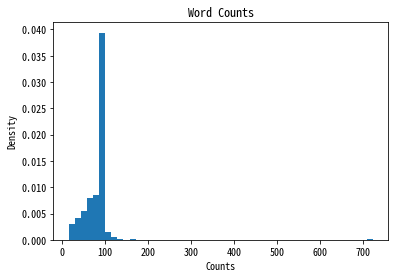


       Word Counts
count   801.000000
mean     80.946317
std      31.266529
min      16.000000
25%      66.000000
50%      90.000000
75%      95.000000
max     723.000000
最少的字是: 圖  照片數量為: 16


In [ ]:
# 觀察每個字照片的數量分布
plt.hist(x=list(wordsDict.values()), bins=50, density=True)
plt.xlabel('Counts')
plt.ylabel('Density')
plt.title('Word Counts')
plt.show()
print()
print(pd.DataFrame({'Word Counts': wordsDict.values()}).describe())
print(f'最少的字是: {min(wordsDict, key=wordsDict.get)}  照片數量為: {min(wordsDict.values())}')

In [ ]:
# 讀取每個字對應的分類編號(配合冠豪)
with open('vocab2idx.pkl', 'rb') as handle:
    vocab2idx = pickle.load(handle)
    wordClassDict = {k: v for k, v in vocab2idx.items()}
print(wordClassDict)
print('總字數: ', len(wordClassDict))

{'丁': 1, '三': 2, '上': 3, '不': 4, '世': 5, '丞': 6, '中': 7, '主': 8, '久': 9, '之': 10, '事': 11, '于': 12, '五': 13, '亞': 14, '交': 15, '亨': 16, '京': 17, '亮': 18, '人': 19, '仁': 20, '介': 21, '仕': 22, '仙': 23, '代': 24, '仲': 25, '任': 26, '份': 27, '企': 28, '伊': 29, '伍': 30, '伯': 31, '伶': 32, '位': 33, '佑': 34, '何': 35, '余': 36, '作': 37, '佩': 38, '佳': 39, '來': 40, '侑': 41, '侯': 42, '俊': 43, '保': 44, '信': 45, '修': 46, '倉': 47, '倫': 48, '偉': 49, '健': 50, '傅': 51, '傑': 52, '備': 53, '傳': 54, '僑': 55, '儀': 56, '億': 57, '儒': 58, '優': 59, '允': 60, '元': 61, '兆': 62, '先': 63, '光': 64, '克': 65, '兒': 66, '內': 67, '全': 68, '公': 69, '其': 70, '具': 71, '典': 72, '冠': 73, '冷': 74, '凌': 75, '凍': 76, '凱': 77, '分': 78, '利': 79, '刷': 80, '券': 81, '創': 82, '劉': 83, '力': 84, '加': 85, '助': 86, '勁': 87, '勇': 88, '動': 89, '務': 90, '勝': 91, '勤': 92, '勳': 93, '包': 94, '化': 95, '北': 96, '匠': 97, '匯': 98, '區': 99, '千': 100, '升': 101, '卉': 102, '卓': 103, '協': 104, '南': 105, '博': 106, '印': 107, '卿': 108, '厚': 109, '原': 110, '友': 11

In [ ]:
# 儲存每個字對應的分類編號
with open(modelSaveFilePath + 'wordClassDict.json', 'w') as f:
    json.dump(wordClassDict, f)

In [ ]:
# 切割train及valid資料集
trainImageNameList = []
validImageNameList = []

# train樣本比率
trainSize = 0.8

# 為求每個字都能分到各資料集 此處迴圈取字依比率分派到各資料集
for word in list(wordsDict.keys()):
  matchImageNames = [imageNameList[idx] for idx, elem in enumerate(wordsList) if elem == word]
  trainImageNames, validImageNames = train_test_split(matchImageNames, random_state=66666, train_size=trainSize)
  trainImageNameList.extend(trainImageNames)
  validImageNameList.extend(validImageNames)

print('訓練集資料筆數: ', len(trainImageNameList))
print('驗證集資料筆數: ', len(validImageNameList))

訓練集資料筆數:  51547
驗證集資料筆數:  13291


In [ ]:
# 新增AI-FREE-Team_handwriting資料做為訓練集資料
aiFreeTeamHandwritingImgList = os.listdir('AI-FREE-Team_handwriting')
for fileName in aiFreeTeamHandwritingImgList:
    shutil.move('/content/AI-FREE-Team_handwriting/' + fileName, '/content/train/' + fileName)
trainImageNameList = trainImageNameList + aiFreeTeamHandwritingImgList
print('新增訓練集資料後筆數: ', len(trainImageNameList))

新增訓練集資料後筆數:  93226


In [ ]:
# 新增20210615_玉山重新標註後照片資料做為訓練集資料
esun20210615ImgList = os.listdir('20210615_玉山重新標註後照片')
for fileName in esun20210615ImgList:
    shutil.move('/content/20210615_玉山重新標註後照片/' + fileName, '/content/train/' + fileName)
trainImageNameList = trainImageNameList + esun20210615ImgList
print('新增訓練集資料後筆數: ', len(trainImageNameList))

新增訓練集資料後筆數:  100342


In [ ]:
# 新增20210616_玉山重新標註後照片資料做為訓練集資料
esun20210616ImgList = os.listdir('20210616_玉山重新標註後照片')
for fileName in esun20210616ImgList:
    shutil.move('/content/20210616_玉山重新標註後照片/' + fileName, '/content/train/' + fileName)
trainImageNameList = trainImageNameList + esun20210616ImgList
print('新增訓練集資料後筆數: ', len(trainImageNameList))

新增訓練集資料後筆數:  107386


In [ ]:
# 新增20210617_玉山重新標註後照片資料做為訓練集資料
esun20210617ImgList = os.listdir('20210617_玉山重新標註後照片')
for fileName in esun20210617ImgList:
    shutil.move('/content/20210617_玉山重新標註後照片/' + fileName, '/content/train/' + fileName)
trainImageNameList = trainImageNameList + esun20210617ImgList
print('新增訓練集資料後筆數: ', len(trainImageNameList))

新增訓練集資料後筆數:  114482


由於加入null分類，此處共要預測801個分類

In [ ]:
# 檢查新增訓練集資料的類別數是否有問題
checkChar = {}
for fileName in trainImageNameList:
    char = re.findall("\d+_(\w+).\w+", fileName)[0]
    if char not in checkChar:
        checkChar[char] = 0
print(f'字元總類別數: {len(checkChar)}')

字元總類別數: 801


In [ ]:
# 驗證是否有訓練集/驗證集交集 若有交集代表分割資料有問題
if set.intersection(set(trainImageNameList), set(validImageNameList)):
    print('資料分割訓練集/驗證集有問題 請檢查!')

# 三、模型訓練

In [ ]:
# Models to choose from [resnet, alexnet, vgg, squeezenet, densenet, inception]
model_name = 'resnet'

# Number of classes in the dataset
# 預測分類數即為字要辨識的總數
num_classes = len(list(wordsDict.keys()))

# Batch size for training (change depending on how much memory you have)
batch_size = 256

# Number of epochs to train for
num_epochs = 2000

# Flag for feature extracting. When False, we finetune the whole model,
#   when True we only update the reshaped layer params
feature_extract = False

# early stopping - validation loss連續幾回合未下降即終止
patience = 20

In [ ]:
# 模型訓練過程要儲存的資訊
train_acc_history = []
train_loss_history = []
val_acc_history = []
val_loss_history = []
bestEpoch = []

In [ ]:
def train_model(model, dataloaders, criterion, optimizer, patience, num_epochs=25, is_inception=False):
    since = time.time()

    # val_acc_history = []

    # Early Stopping參數
    earlyStoppingFlag = False  # 目前是否已觸發earlyStopping
    bestLoss = float("inf")  # loss起始值
    noBetterTimes = 0  # 紀錄連續幾回合loss沒下降

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):

        print('-' * 10)
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    # Special case for inception because in training it has an auxiliary output. In train
                    #   mode we calculate the loss by summing the final output and the auxiliary output
                    #   but in testing we only consider the final output.
                    if is_inception and phase == 'train':
                        # From https://discuss.pytorch.org/t/how-to-optimize-inception-model-with-auxiliary-classifiers/7958
                        outputs, aux_outputs = model(inputs)
                        loss1 = criterion(outputs, labels)
                        loss2 = criterion(aux_outputs, labels)
                        loss = loss1 + 0.4*loss2
                    else:
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                    _, preds = torch.max(outputs, 1)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                # best_model_wts = copy.deepcopy(model.state_dict())

            # 紀錄acc和loss資訊
            if phase == 'train':
                train_acc_history.append(epoch_acc)
                train_loss_history.append(epoch_loss)

            elif phase == 'val':
                val_acc_history.append(epoch_acc)
                val_loss_history.append(epoch_loss)

            # Early Stopping
            if phase == 'val':
                
                if epoch_loss >= bestLoss:
                    noBetterTimes += 1
                    print('Loss已連續: ', noBetterTimes, ' 回合沒有下降')

                    if noBetterTimes == patience:
                        earlyStoppingFlag = True
                        print('觸發Early Stopping條件')

                elif epoch_loss < bestLoss:
                    bestLoss = epoch_loss
                    noBetterTimes = 0
                    best_model_wts = copy.deepcopy(model.state_dict())  # 儲存最佳模型權重資訊

        # 已觸發Early Stopping 終止訓練
        if earlyStoppingFlag:
            bestEpoch.append(epoch-patience+1)
            break

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    # return model, val_acc_history
    return model

In [ ]:
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

In [ ]:
def initialize_model(model_name, num_classes, feature_extract, use_pretrained=True):
    # Initialize these variables which will be set in this if statement. Each of these
    #   variables is model specific.
    model_ft = None
    input_size = 0

    if model_name == "resnet":
        """ Resnet18
        """
        model_ft = models.resnet18(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)
        input_size = 224

    elif model_name == "alexnet":
        """ Alexnet
        """
        model_ft = models.alexnet(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)
        input_size = 224

    elif model_name == "vgg":
        """ VGG11_bn
        """
        model_ft = models.vgg11_bn(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)
        input_size = 224

    elif model_name == "squeezenet":
        """ Squeezenet
        """
        model_ft = models.squeezenet1_0(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        model_ft.classifier[1] = nn.Conv2d(512, num_classes, kernel_size=(1,1), stride=(1,1))
        model_ft.num_classes = num_classes
        input_size = 224

    elif model_name == "densenet":
        """ Densenet
        """
        model_ft = models.densenet121(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier.in_features
        model_ft.classifier = nn.Linear(num_ftrs, num_classes)
        input_size = 224

    elif model_name == "inception":
        """ Inception v3
        Be careful, expects (299,299) sized images and has auxiliary output
        """
        model_ft = models.inception_v3(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        # Handle the auxilary net
        num_ftrs = model_ft.AuxLogits.fc.in_features
        model_ft.AuxLogits.fc = nn.Linear(num_ftrs, num_classes)
        # Handle the primary net
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)
        input_size = 299

    else:
        print("Invalid model name, exiting...")
        exit()

    return model_ft, input_size

# Initialize the model for this run
# model_ft, input_size = initialize_model(model_name, num_classes, feature_extract, use_pretrained=True)
model_ft, input_size = initialize_model(model_name, num_classes, feature_extract, use_pretrained=False)

# # Print the model we just instantiated
# print(model_ft)

In [ ]:
# 建立照片資料讀取物件類別
class MyData(torch.utils.data.Dataset):

  # 初始化值
  def __init__(self, imageList, mode='train', transform=None):
      
      self.mode = mode  # train, valid, test
      self.data_list = [imagePath + elem for elem in imageList]  # 圖片位置
      self.labels = [wordClassDict[re.findall("\d+_(\w+).\w+", elem)[0]] for elem in imageList]  # 分類編號
      self.transform = transform  # pytorch transform設定

  # 開啟照片檔案
  def __getitem__(self, index):

      # 讀取照片檔案
      data = Image.open(self.data_list[index])

      # 若有設定pytorch transform 則執行transform
      if self.transform is not None:
          data = self.transform(data)

      # 將照片對應的label轉為tensor (test資料集不用處理) 
      if self.mode == 'test':
          return data
      else:
        label = torch.tensor(int(self.labels[index]))
        return data, label

  def __len__(self):
      return len(self.data_list)

In [ ]:
# 定義照片的transforms
# train照片集的transforms
transforms_train = transforms.Compose([
#   transforms.Resize(input_size),
#   transforms.CenterCrop(input_size),
  transforms.RandomResizedCrop(input_size, scale=(0.3, 1)),
  transforms.RandomRotation(degrees=(-15, 15)),  # 隨機轉角度旋轉
  transforms.RandomGrayscale(p=0.1),  # 隨機轉灰
  transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.5),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# valid及test照片集的transforms
transforms_test = transforms.Compose([
  transforms.Resize(input_size),
  transforms.CenterCrop(input_size),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
# 建立train, valid和test資料讀取物件類別
dataset_train = MyData(trainImageNameList, mode='train', transform=transforms_train)
dataset_val = MyData(validImageNameList, mode='val', transform=transforms_test)

# 確認照片資料讀取物件類別是否有正常運作
print("The first image's shape in dataset_train :", dataset_train.__getitem__(0)[0].size())
print("There are", dataset_train.__len__(), "images in dataset_train.")
print("The lables in train data:", set(dataset_train.labels))

The first image's shape in dataset_train : torch.Size([3, 224, 224])
There are 114482 images in dataset_train.
The lables in train data: {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 19

In [ ]:
# # 檢查訓練集transformer的成果
# plt.imshow(dataset_train.__getitem__(666)[0].permute(1, 2, 0))

In [ ]:
# 確認訓練集及測試集資料是否有交集
set(trainImageNameList).intersection(set(validImageNameList))

set()

In [ ]:
# DataLoader
train_loader = DataLoader(dataset_train, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(dataset_val, batch_size=batch_size, shuffle=False, num_workers=2)
dataloaders_dict = {'train': train_loader, 'val': val_loader}

In [ ]:
# Detect if we have a GPU available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
# Send the model to GPU
model_ft = model_ft.to(device)

# Gather the parameters to be optimized/updated in this run. If we are
#  finetuning we will be updating all parameters. However, if we are
#  doing feature extract method, we will only update the parameters
#  that we have just initialized, i.e. the parameters with requires_grad
#  is True.
params_to_update = model_ft.parameters()
print("Params to learn:")
if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
# optimizer_ft = optim.SGD(params_to_update, lr=0.1, momentum=0.9)
optimizer_ft = optim.Adam(params_to_update, lr=0.01)

Params to learn:
	 conv1.weight
	 bn1.weight
	 bn1.bias
	 layer1.0.conv1.weight
	 layer1.0.bn1.weight
	 layer1.0.bn1.bias
	 layer1.0.conv2.weight
	 layer1.0.bn2.weight
	 layer1.0.bn2.bias
	 layer1.1.conv1.weight
	 layer1.1.bn1.weight
	 layer1.1.bn1.bias
	 layer1.1.conv2.weight
	 layer1.1.bn2.weight
	 layer1.1.bn2.bias
	 layer2.0.conv1.weight
	 layer2.0.bn1.weight
	 layer2.0.bn1.bias
	 layer2.0.conv2.weight
	 layer2.0.bn2.weight
	 layer2.0.bn2.bias
	 layer2.0.downsample.0.weight
	 layer2.0.downsample.1.weight
	 layer2.0.downsample.1.bias
	 layer2.1.conv1.weight
	 layer2.1.bn1.weight
	 layer2.1.bn1.bias
	 layer2.1.conv2.weight
	 layer2.1.bn2.weight
	 layer2.1.bn2.bias
	 layer3.0.conv1.weight
	 layer3.0.bn1.weight
	 layer3.0.bn1.bias
	 layer3.0.conv2.weight
	 layer3.0.bn2.weight
	 layer3.0.bn2.bias
	 layer3.0.downsample.0.weight
	 layer3.0.downsample.1.weight
	 layer3.0.downsample.1.bias
	 layer3.1.conv1.weight
	 layer3.1.bn1.weight
	 layer3.1.bn1.bias
	 layer3.1.conv2.weight
	 layer3.1.b

In [ ]:
# Setup the loss fxn
criterion = nn.CrossEntropyLoss()

In [ ]:
# Train and evaluate
# model_ft, hist = train_model(model_ft, dataloaders_dict, criterion, optimizer_ft, num_epochs=num_epochs, is_inception=(model_name=="inception"))
model_ft = train_model(model_ft, dataloaders_dict, criterion, optimizer_ft, 
                       num_epochs=num_epochs, is_inception=(model_name=="inception"), patience=patience)

----------
Epoch 0/1999
train Loss: 6.7009 Acc: 0.0159
val Loss: 6.6331 Acc: 0.0109
----------
Epoch 1/1999
train Loss: 6.2543 Acc: 0.0192
val Loss: 5.9026 Acc: 0.0200
----------
Epoch 2/1999
train Loss: 3.9095 Acc: 0.2227
val Loss: 2.1427 Acc: 0.5076
----------
Epoch 3/1999
train Loss: 1.8708 Acc: 0.5896
val Loss: 1.1118 Acc: 0.7387
----------
Epoch 4/1999
train Loss: 1.3527 Acc: 0.6954
val Loss: 0.8403 Acc: 0.7987
----------
Epoch 5/1999
train Loss: 1.1354 Acc: 0.7400
val Loss: 0.7761 Acc: 0.8145
----------
Epoch 6/1999
train Loss: 1.0073 Acc: 0.7662
val Loss: 0.6399 Acc: 0.8463
----------
Epoch 7/1999
train Loss: 0.9261 Acc: 0.7823
val Loss: 0.6107 Acc: 0.8542
----------
Epoch 8/1999
train Loss: 0.8589 Acc: 0.7971
val Loss: 0.5599 Acc: 0.8642
----------
Epoch 9/1999
train Loss: 0.8135 Acc: 0.8063
val Loss: 0.5562 Acc: 0.8642
----------
Epoch 10/1999
train Loss: 0.7766 Acc: 0.8146
val Loss: 0.5289 Acc: 0.8764
----------
Epoch 11/1999
train Loss: 0.7369 Acc: 0.8223
val Loss: 0.5331 Ac

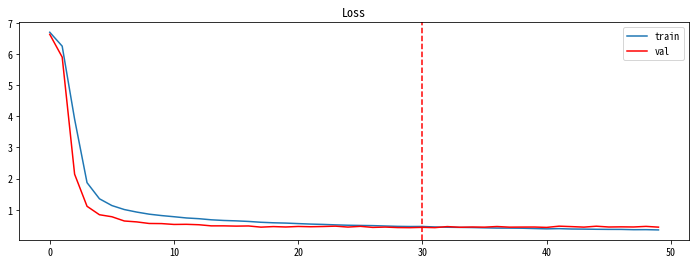

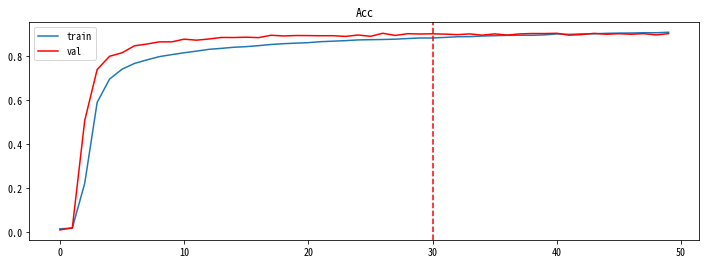

In [ ]:
# 繪製模型學習過程圖
plt.figure(figsize=(12, 4))
plt.plot(range(len(train_loss_history)), train_loss_history)
plt.plot(range(len(val_loss_history)), val_loss_history, c='r')
plt.legend(['train', 'val'])
plt.title('Loss')
plt.axvline(bestEpoch, linestyle='--', color='r',label='Early Stopping Checkpoint')
plt.show()

plt.figure(figsize=(12, 4))
plt.plot(range(len(train_acc_history)), train_acc_history)
plt.plot(range(len(val_acc_history)), val_acc_history, c='r')
plt.legend(['train', 'val'])
plt.title('Acc')
plt.axvline(bestEpoch, linestyle='--', color='r',label='Early Stopping Checkpoint')
plt.show()

In [ ]:
# 設定儲存模型名稱
saveFileName = modelSaveFilePath + '20210618_' + model_name  + '_batch_size_' + \
    str(batch_size) + '_num_epochs_' + str(num_epochs) + '_patience_' + str(patience)
saveFileName

'/content/drive/MyDrive/玉山人工智慧競賽/20210618_resnet_batch_size_256_num_epochs_2000_patience_20'

In [ ]:
# 儲存模型學習最佳結果
torch.save(model_ft.state_dict(), saveFileName)

# 四、模型預測

In [ ]:
# 讀取訓練好的模型
model_ft.load_state_dict(torch.load(saveFileName))

<All keys matched successfully>

In [ ]:
# 為預測機率 加上LogSoftmax
model_ft.fc = nn.Sequential(model_ft.fc, nn.LogSoftmax(dim=1))

In [ ]:
# 進入模型評估
model_ft.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
# 模型預測函數
def predict(dataloader, model):

    correct = 0  # 紀錄預測正確數量
    total = 0  # 紀錄預測總樣本數
    predictTarget = []  # 預測目標
    predictResult = []  # 預測結果
    predProbResult = []  # 預測機率

    with torch.no_grad():

        # 以dataloader方式分批預測
        for data in dataloader:
            images, labels = data
            outputs = model(images.to(device))
            prob, predicted = torch.max(outputs.data, 1)
            predicted = predicted.to('cpu')

            # 紀錄資訊
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            predictTarget.extend(labels.numpy().tolist())
            predictResult.extend(predicted.to('cpu').numpy().tolist())
            predProbResult.extend(np.exp(prob.to('cpu').numpy().tolist()))

    return predictTarget, predictResult, predProbResult, correct, total

In [ ]:
# 模型預測驗證集資料
predictTarget, predictResult, predProbResult, correct, total = predict(dataloader=dataloaders_dict['val'] , model=model_ft)

In [ ]:
# 印出預測結果
print('預測樣本總數:', total)
print('預測準確度: %.2f %%' % (100 * correct / total))

預測樣本總數: 13291
預測準確度: 89.99 %


In [ ]:
# 將預測結果轉為文字
key_list = list(wordClassDict.keys())
val_list = list(wordClassDict.values())
predictText = [key_list[val_list.index(elem)] for elem in predictResult]

模型預測字為: 碧
預測機率為: 0.3
照片名稱為: 58145_麗.jpg


--------------------
模型預測字為: 羅
預測機率為: 0.83
照片名稱為: 58466_眾.jpg


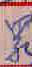

--------------------
模型預測字為: 行
預測機率為: 0.49
照片名稱為: 9606_竹.jpg


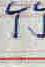

--------------------
模型預測字為: 正
預測機率為: 1.0
照片名稱為: 47116_正.jpg


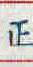

--------------------
模型預測字為: 業
預測機率為: 1.0
照片名稱為: 4804_業.jpg


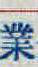

--------------------
模型預測字為: 研
預測機率為: 0.99
照片名稱為: 39209_研.jpg


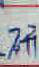

--------------------
模型預測字為: 謙
預測機率為: 1.0
照片名稱為: 472_謙.jpg


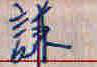

--------------------
模型預測字為: 兒
預測機率為: 1.0
照片名稱為: 10429_兒.jpg


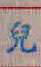

--------------------
模型預測字為: 瀚
預測機率為: 1.0
照片名稱為: 4378_瀚.jpg


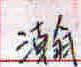

--------------------
模型預測字為: 豪
預測機率為: 1.0
照片名稱為: 51920_豪.jpg


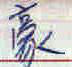

--------------------
模型預測字為: isnull
預測機率為: 0.39
照片名稱為: 787_百.jpg


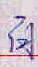

--------------------
模型預測字為: 白
預測機率為: 0.37
照片名稱為: 55667_白.jpg


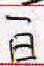

--------------------
模型預測字為: 徐
預測機率為: 1.0
照片名稱為: 822_徐.jpg


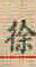

--------------------
模型預測字為: 聚
預測機率為: 0.99
照片名稱為: 31164_聚.jpg


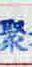

--------------------
模型預測字為: 漢
預測機率為: 0.94
照片名稱為: 16109_漢.jpg


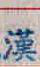

--------------------
模型預測字為: 博
預測機率為: 1.0
照片名稱為: 34333_博.jpg


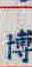

--------------------
模型預測字為: 律
預測機率為: 1.0
照片名稱為: 53619_律.jpg


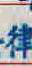

--------------------
模型預測字為: 敬
預測機率為: 1.0
照片名稱為: 36948_敬.jpg


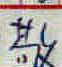

--------------------
模型預測字為: 仙
預測機率為: 0.98
照片名稱為: 30928_仙.jpg


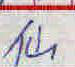

--------------------
模型預測字為: 傑
預測機率為: 1.0
照片名稱為: 18136_傑.jpg


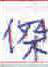

--------------------
模型預測字為: 寶
預測機率為: 0.85
照片名稱為: 21245_寶.jpg


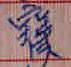

--------------------
模型預測字為: 麒
預測機率為: 1.0
照片名稱為: 44458_麒.jpg


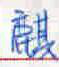

--------------------
模型預測字為: 卓
預測機率為: 0.99
照片名稱為: 42083_卓.jpg


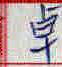

--------------------
模型預測字為: 昕
預測機率為: 1.0
照片名稱為: 49202_昕.jpg


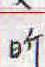

--------------------
模型預測字為: 友
預測機率為: 0.96
照片名稱為: 62248_友.jpg


--------------------
模型預測字為: 業
預測機率為: 1.0
照片名稱為: 46167_業.jpg


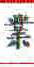

--------------------
模型預測字為: 馬
預測機率為: 1.0
照片名稱為: 55959_馬.jpg


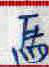

--------------------
模型預測字為: 星
預測機率為: 0.81
照片名稱為: 20743_星.jpg


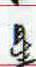

--------------------
模型預測字為: 徐
預測機率為: 0.44
照片名稱為: 19900_堡.jpg


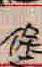

--------------------
模型預測字為: 煌
預測機率為: 1.0
照片名稱為: 25772_煌.jpg


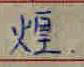

--------------------
模型預測字為: 雯
預測機率為: 1.0
照片名稱為: 6104_雯.jpg


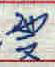

--------------------
模型預測字為: 利
預測機率為: 0.99
照片名稱為: 62320_利.jpg


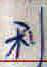

--------------------
模型預測字為: 晶
預測機率為: 1.0
照片名稱為: 23000_晶.jpg


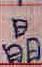

--------------------
模型預測字為: 專
預測機率為: 0.99
照片名稱為: 2399_專.jpg


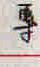

--------------------
模型預測字為: 典
預測機率為: 1.0
照片名稱為: 49637_典.jpg


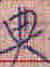

--------------------
模型預測字為: 婉
預測機率為: 1.0
照片名稱為: 13714_婉.jpg


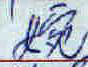

--------------------
模型預測字為: 輪
預測機率為: 1.0
照片名稱為: 66746_輪.jpg


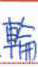

--------------------
模型預測字為: 局
預測機率為: 0.99
照片名稱為: 60242_局.jpg


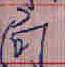

--------------------
模型預測字為: 冷
預測機率為: 0.71
照片名稱為: 61591_汽.jpg


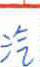

--------------------
模型預測字為: 來
預測機率為: 1.0
照片名稱為: 66345_來.jpg


--------------------
模型預測字為: 分
預測機率為: 0.99
照片名稱為: 9513_分.jpg


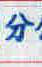

--------------------
模型預測字為: 呂
預測機率為: 1.0
照片名稱為: 21337_呂.jpg


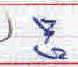

--------------------
模型預測字為: 所
預測機率為: 0.94
照片名稱為: 14020_所.jpg


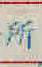

--------------------
模型預測字為: 簡
預測機率為: 0.69
照片名稱為: 53682_問.jpg


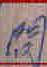

--------------------
模型預測字為: 塑
預測機率為: 1.0
照片名稱為: 53958_塑.jpg


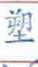

--------------------
模型預測字為: 有
預測機率為: 0.71
照片名稱為: 24352_祐.jpg


--------------------
模型預測字為: 杜
預測機率為: 0.99
照片名稱為: 67525_杜.jpg


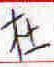

--------------------
模型預測字為: 雄
預測機率為: 1.0
照片名稱為: 59051_雄.jpg


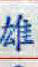

--------------------
模型預測字為: 凌
預測機率為: 1.0
照片名稱為: 7051_凌.jpg


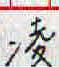

--------------------
模型預測字為: 其
預測機率為: 1.0
照片名稱為: 32188_其.jpg


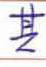

--------------------
模型預測字為: 亨
預測機率為: 0.99
照片名稱為: 66771_亨.jpg


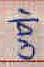

--------------------
模型預測字為: 呂
預測機率為: 0.96
照片名稱為: 62285_呂.jpg


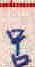

--------------------
模型預測字為: 森
預測機率為: 1.0
照片名稱為: 20072_森.jpg


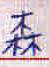

--------------------
模型預測字為: 程
預測機率為: 1.0
照片名稱為: 47239_程.jpg


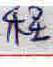

--------------------
模型預測字為: 鈞
預測機率為: 1.0
照片名稱為: 37302_鈞.jpg


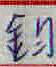

--------------------
模型預測字為: 蘇
預測機率為: 1.0
照片名稱為: 23124_蘇.jpg


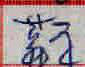

--------------------
模型預測字為: 隆
預測機率為: 0.98
照片名稱為: 38176_隆.jpg


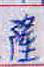

--------------------
模型預測字為: 行
預測機率為: 0.99
照片名稱為: 61369_行.jpg


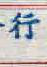

--------------------
模型預測字為: 春
預測機率為: 1.0
照片名稱為: 37289_春.jpg


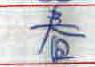

--------------------
模型預測字為: 蓮
預測機率為: 1.0
照片名稱為: 22819_蓮.jpg


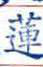

--------------------
模型預測字為: 遠
預測機率為: 1.0
照片名稱為: 14407_遠.jpg


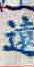

--------------------
模型預測字為: 觀
預測機率為: 0.18
照片名稱為: 33995_實.jpg


--------------------
模型預測字為: 仲
預測機率為: 1.0
照片名稱為: 41737_仲.jpg


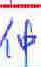

--------------------
模型預測字為: 鎮
預測機率為: 1.0
照片名稱為: 332_鎮.jpg


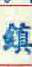

--------------------
模型預測字為: 霞
預測機率為: 1.0
照片名稱為: 30674_霞.jpg


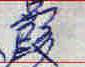

--------------------
模型預測字為: 聰
預測機率為: 1.0
照片名稱為: 59099_聰.jpg


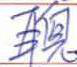

--------------------
模型預測字為: 錦
預測機率為: 1.0
照片名稱為: 35263_錦.jpg


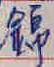

--------------------
模型預測字為: 隆
預測機率為: 1.0
照片名稱為: 67186_隆.jpg


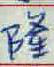

--------------------
模型預測字為: 淑
預測機率為: 0.86
照片名稱為: 49254_淑.jpg


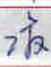

--------------------
模型預測字為: 羽
預測機率為: 0.22
照片名稱為: 23721_團.jpg


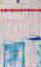

--------------------


In [ ]:
# 隨機抽取驗證集樣本觀察真實圖片與預測文字差異
for ix in np.random.randint(0, len(validImageNameList), size=70):
    print('模型預測字為:', predictText[ix])
    print('預測機率為:', round(predProbResult[ix], 2))
    print('照片名稱為:', validImageNameList[ix])
    display(Image.open(imagePath + validImageNameList[ix]))
    print('--------------------')

In [ ]:
# 計算confusionMatrix
confusionMatrix = confusion_matrix(y_true=predictTarget, y_pred=predictResult, labels=list(wordClassDict.values()))

In [ ]:
# 計算 1-各字precision = 1-預測該字正確樣本數/預測該字樣本數
charErrorRateTable = pd.DataFrame(data={'char': list(wordClassDict.keys()),
                                        'errRate': 1-(np.diag(confusionMatrix)/np.sum(confusionMatrix, axis=0)),
                                        'predictSamples': np.sum(confusionMatrix, axis=0)})
charErrorRateTable['errorSamples'] = charErrorRateTable['errRate'] * charErrorRateTable['predictSamples']
# 排序常被預測錯誤的字
charErrorRateTable = charErrorRateTable.sort_values(by='errorSamples', ascending=False)
charErrorRateTable.head(30)

,char,errRate,predictSamples,errorSamples
800,isnull,0.615942,138,85.0
50,傅,0.423077,26,11.0
761,青,0.384615,26,10.0
416,海,0.346154,26,9.0
350,木,0.346154,26,9.0
67,全,0.321429,28,9.0
346,有,0.243243,37,9.0
27,企,0.258065,31,8.0
36,作,0.296296,27,8.0
211,寬,0.363636,22,8.0


模型預測字為: 秀
預測機率為: 0.93
照片名稱為: 20033_香.jpg


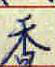

--------------------
模型預測字為: 秀
預測機率為: 0.31
照片名稱為: 800_茶.jpg


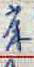

--------------------
模型預測字為: 秀
預測機率為: 1.0
照片名稱為: 2348_秀.jpg


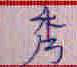

--------------------
模型預測字為: 秀
預測機率為: 0.97
照片名稱為: 64925_秀.jpg


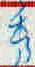

--------------------
模型預測字為: 秀
預測機率為: 0.98
照片名稱為: 58040_秀.jpg


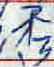

--------------------
模型預測字為: 秀
預測機率為: 1.0
照片名稱為: 24043_秀.jpg


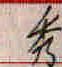

--------------------
模型預測字為: 秀
預測機率為: 0.99
照片名稱為: 6565_秀.jpg


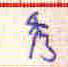

--------------------
模型預測字為: 秀
預測機率為: 0.87
照片名稱為: 64715_秀.jpg


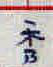

--------------------
模型預測字為: 秀
預測機率為: 0.99
照片名稱為: 28410_秀.jpg


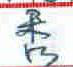

--------------------
模型預測字為: 秀
預測機率為: 0.99
照片名稱為: 65437_秀.jpg


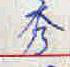

--------------------
模型預測字為: 秀
預測機率為: 0.99
照片名稱為: 11044_秀.jpg


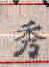

--------------------
模型預測字為: 秀
預測機率為: 0.99
照片名稱為: 48120_秀.jpg


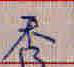

--------------------
模型預測字為: 秀
預測機率為: 0.56
照片名稱為: 8431_秀.jpg


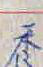

--------------------
模型預測字為: 秀
預測機率為: 1.0
照片名稱為: 27623_秀.jpg


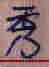

--------------------
模型預測字為: 秀
預測機率為: 0.78
照片名稱為: 52260_秀.jpg


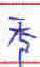

--------------------
模型預測字為: 秀
預測機率為: 0.61
照片名稱為: 24270_秀.jpg


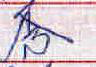

--------------------
模型預測字為: 秀
預測機率為: 1.0
照片名稱為: 43100_秀.jpg


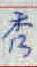

--------------------
模型預測字為: 秀
預測機率為: 1.0
照片名稱為: 36627_秀.jpg


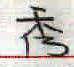

--------------------
模型預測字為: 秀
預測機率為: 0.92
照片名稱為: 40973_秀.jpg


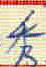

--------------------
模型預測字為: 秀
預測機率為: 0.97
照片名稱為: 38553_秀.jpg


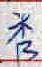

--------------------


In [ ]:
# 將預測該字的照片全數找出來
targetChar = '秀'
targetSite = [idx for idx, elem in enumerate(predictResult) if elem == wordClassDict[targetChar]]

# 印出該字預測結果"
for ix in targetSite:
    print('模型預測字為:', predictText[ix])
    print('預測機率為:', round(predProbResult[ix], 2))
    print('照片名稱為:', validImageNameList[ix])
    display(Image.open(imagePath + validImageNameList[ix]))
    print('--------------------')

In [ ]:
# 觀察預測機率大於0.8且預測錯誤之照片
# targetSite = [idx for idx, elem in enumerate(predProbResult) if elem >= 0.8]
# for ix in targetSite:
#     if predictText[ix] != re.findall("\d+_(\w+).\w+", validImageNameList[ix])[0]:
#         print('模型預測字為:', predictText[ix])
#         print('預測機率為:', round(predProbResult[ix], 2))
#         print('照片名稱為:', validImageNameList[ix])
#         display(Image.open(imagePath + validImageNameList[ix]))
#         print('--------------------')

第 0 張圖片
模型預測字為: 作
預測機率為: 0.45
照片名稱為: 1617_戶.jpg


--------------------
第 1 張圖片
模型預測字為: 作
預測機率為: 0.36
照片名稱為: 0_戶.jpg


--------------------
第 2 張圖片
模型預測字為: 巨
預測機率為: 0.75
照片名稱為: 47324_戶.jpg


--------------------
第 3 張圖片
模型預測字為: 巨
預測機率為: 0.8
照片名稱為: 54988_戶.jpg


--------------------
第 4 張圖片
模型預測字為: 巨
預測機率為: 0.98
照片名稱為: 16268_戶.jpg


--------------------
第 5 張圖片
模型預測字為: 沙
預測機率為: 0.19
照片名稱為: 20624_灣.jpg


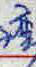

--------------------
第 6 張圖片
模型預測字為: 酒
預測機率為: 0.92
照片名稱為: 46628_灣.jpg


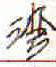

--------------------
第 7 張圖片
模型預測字為: 黃
預測機率為: 0.92
照片名稱為: 2338_普.jpg


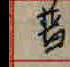

--------------------
第 8 張圖片
模型預測字為: 貴
預測機率為: 0.48
照片名稱為: 68066_普.jpg


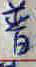

--------------------
第 9 張圖片
模型預測字為: 傅
預測機率為: 0.57
照片名稱為: 44409_鳳.jpg


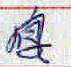

--------------------
第 10 張圖片
模型預測字為: 網
預測機率為: 0.35
照片名稱為: 24711_鳳.jpg


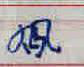

--------------------
第 11 張圖片
模型預測字為: 鴻
預測機率為: 0.32
照片名稱為: 18096_琪.jpg


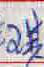

--------------------
第 12 張圖片
模型預測字為: 備
預測機率為: 0.6
照片名稱為: 52934_琪.jpg


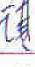

--------------------
第 13 張圖片
模型預測字為: 消
預測機率為: 0.48
照片名稱為: 32245_琪.jpg


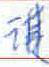

--------------------
第 14 張圖片
模型預測字為: 珍
預測機率為: 0.97
照片名稱為: 60627_琇.jpg


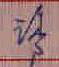

--------------------
第 15 張圖片
模型預測字為: isnull
預測機率為: 0.81
照片名稱為: 30423_琇.jpg


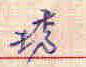

--------------------
第 16 張圖片
模型預測字為: 浩
預測機率為: 0.86
照片名稱為: 1564_琇.jpg


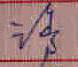

--------------------
第 17 張圖片
模型預測字為: 村
預測機率為: 0.64
照片名稱為: 37702_芝.jpg


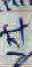

--------------------
第 18 張圖片
模型預測字為: 主
預測機率為: 0.14
照片名稱為: 34361_芝.jpg


--------------------
第 19 張圖片
模型預測字為: 萱
預測機率為: 0.39
照片名稱為: 68675_芝.jpg


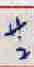

--------------------
第 20 張圖片
模型預測字為: 芸
預測機率為: 0.36
照片名稱為: 43475_芝.jpg


--------------------
第 21 張圖片
模型預測字為: 涵
預測機率為: 0.82
照片名稱為: 58756_瑜.jpg


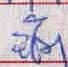

--------------------
第 22 張圖片
模型預測字為: 不
預測機率為: 0.78
照片名稱為: 18836_石.jpg


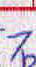

--------------------
第 23 張圖片
模型預測字為: 磊
預測機率為: 0.5
照片名稱為: 33535_石.jpg


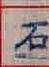

--------------------
第 24 張圖片
模型預測字為: 木
預測機率為: 0.43
照片名稱為: 19226_杰.jpg


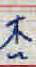

--------------------
第 25 張圖片
模型預測字為: 森
預測機率為: 0.38
照片名稱為: 26636_杰.jpg


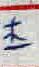

--------------------
第 26 張圖片
模型預測字為: 木
預測機率為: 0.81
照片名稱為: 67023_杰.jpg


--------------------
第 27 張圖片
模型預測字為: 場
預測機率為: 0.65
照片名稱為: 2276_氣.jpg


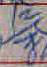

--------------------
第 28 張圖片
模型預測字為: 志
預測機率為: 0.27
照片名稱為: 22782_克.jpg


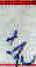

--------------------
第 29 張圖片
模型預測字為: isnull
預測機率為: 0.55
照片名稱為: 1000_克.jpg


--------------------
第 30 張圖片
模型預測字為: 包
預測機率為: 0.45
照片名稱為: 25604_司.jpg


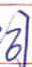

--------------------
第 31 張圖片
模型預測字為: 阿
預測機率為: 0.86
照片名稱為: 16307_司.jpg


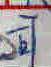

--------------------
第 32 張圖片
模型預測字為: 區
預測機率為: 0.32
照片名稱為: 43471_司.jpg


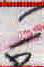

--------------------
第 33 張圖片
模型預測字為: 守
預測機率為: 0.26
照片名稱為: 40333_司.jpg


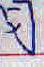

--------------------
第 34 張圖片
模型預測字為: isnull
預測機率為: 0.79
照片名稱為: 17346_司.jpg


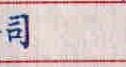

--------------------
第 35 張圖片
模型預測字為: 高
預測機率為: 0.36
照片名稱為: 25821_喬.jpg


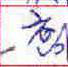

--------------------
第 36 張圖片
模型預測字為: 塑
預測機率為: 0.56
照片名稱為: 54270_興.jpg


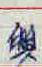

--------------------
第 37 張圖片
模型預測字為: 塑
預測機率為: 0.49
照片名稱為: 10012_興.jpg


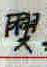

--------------------
第 38 張圖片
模型預測字為: isnull
預測機率為: 0.76
照片名稱為: 29521_興.jpg


--------------------
第 39 張圖片
模型預測字為: 投
預測機率為: 1.0
照片名稱為: 24_興.jpg


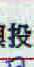

--------------------
第 40 張圖片
模型預測字為: 築
預測機率為: 0.73
照片名稱為: 59533_興.jpg


--------------------
第 41 張圖片
模型預測字為: isnull
預測機率為: 0.62
照片名稱為: 53880_馬.jpg


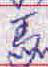

--------------------
第 42 張圖片
模型預測字為: 堡
預測機率為: 0.47
照片名稱為: 43260_馨.jpg


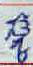

--------------------
第 43 張圖片
模型預測字為: 蔡
預測機率為: 0.9
照片名稱為: 39334_馨.jpg


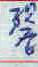

--------------------
第 44 張圖片
模型預測字為: 誠
預測機率為: 0.89
照片名稱為: 26906_械.jpg


--------------------
第 45 張圖片
模型預測字為: 承
預測機率為: 0.43
照片名稱為: 52887_彩.jpg


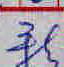

--------------------
第 46 張圖片
模型預測字為: 修
預測機率為: 0.12
照片名稱為: 14702_彩.jpg


--------------------
第 47 張圖片
模型預測字為: 謝
預測機率為: 0.41
照片名稱為: 9168_彩.jpg


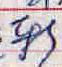

--------------------
第 48 張圖片
模型預測字為: 交
預測機率為: 0.81
照片名稱為: 10017_文.jpg


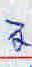

--------------------
第 49 張圖片
模型預測字為: 有
預測機率為: 0.97
照片名稱為: 51455_文.jpg


--------------------
第 50 張圖片
模型預測字為: 旻
預測機率為: 0.6
照片名稱為: 14137_文.jpg


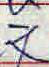

--------------------
第 51 張圖片
模型預測字為: 芸
預測機率為: 0.36
照片名稱為: 6123_真.jpg


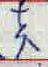

--------------------
第 52 張圖片
模型預測字為: 貞
預測機率為: 0.32
照片名稱為: 53032_真.jpg


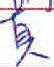

--------------------
第 53 張圖片
模型預測字為: 生
預測機率為: 0.18
照片名稱為: 60404_真.jpg


--------------------
第 54 張圖片
模型預測字為: 喜
預測機率為: 0.89
照片名稱為: 60152_真.jpg


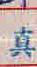

--------------------
第 55 張圖片
模型預測字為: 若
預測機率為: 0.82
照片名稱為: 43139_真.jpg


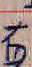

--------------------
第 56 張圖片
模型預測字為: 魏
預測機率為: 0.61
照片名稱為: 62245_委.jpg


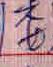

--------------------
第 57 張圖片
模型預測字為: 森
預測機率為: 0.4
照片名稱為: 50520_委.jpg


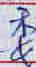

--------------------
第 58 張圖片
模型預測字為: 所
預測機率為: 0.18
照片名稱為: 42419_門.jpg


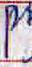

--------------------
第 59 張圖片
模型預測字為: 研
預測機率為: 0.44
照片名稱為: 31816_門.jpg


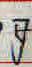

--------------------
第 60 張圖片
模型預測字為: 悅
預測機率為: 0.79
照片名稱為: 41825_曉.jpg


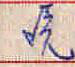

--------------------
第 61 張圖片
模型預測字為: 全
預測機率為: 0.35
照片名稱為: 147_峰.jpg


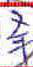

--------------------
第 62 張圖片
模型預測字為: 吟
預測機率為: 0.89
照片名稱為: 38154_峰.jpg


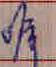

--------------------
第 63 張圖片
模型預測字為: 燿
預測機率為: 0.25
照片名稱為: 20937_峰.jpg


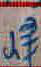

--------------------
第 64 張圖片
模型預測字為: 愛
預測機率為: 0.66
照片名稱為: 64588_客.jpg


--------------------
第 65 張圖片
模型預測字為: 睿
預測機率為: 0.31
照片名稱為: 28983_客.jpg


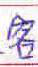

--------------------
第 66 張圖片
模型預測字為: 芬
預測機率為: 0.23
照片名稱為: 21535_客.jpg


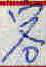

--------------------
第 67 張圖片
模型預測字為: 社
預測機率為: 0.54
照片名稱為: 13065_禮.jpg


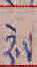

--------------------
第 68 張圖片
模型預測字為: 企
預測機率為: 0.51
照片名稱為: 59253_化.jpg


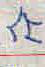

--------------------
第 69 張圖片
模型預測字為: 花
預測機率為: 0.6
照片名稱為: 1620_化.jpg


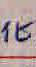

--------------------
第 70 張圖片
模型預測字為: 紀
預測機率為: 0.67
照片名稱為: 32845_化.jpg


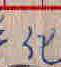

--------------------
第 71 張圖片
模型預測字為: 醫
預測機率為: 0.81
照片名稱為: 18752_歐.jpg


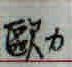

--------------------
第 72 張圖片
模型預測字為: 寓
預測機率為: 0.51
照片名稱為: 18582_勇.jpg


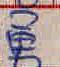

--------------------
第 73 張圖片
模型預測字為: 景
預測機率為: 0.94
照片名稱為: 15487_昱.jpg


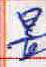

--------------------
第 74 張圖片
模型預測字為: 晨
預測機率為: 0.65
照片名稱為: 32053_昱.jpg


--------------------
第 75 張圖片
模型預測字為: 景
預測機率為: 0.95
照片名稱為: 24618_昱.jpg


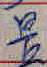

--------------------
第 76 張圖片
模型預測字為: 械
預測機率為: 0.4
照片名稱為: 63512_振.jpg


--------------------
第 77 張圖片
模型預測字為: 嘉
預測機率為: 0.49
照片名稱為: 27104_張.jpg


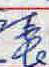

--------------------
第 78 張圖片
模型預測字為: 旅
預測機率為: 0.96
照片名稱為: 33386_張.jpg


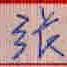

--------------------
第 79 張圖片
模型預測字為: 楊
預測機率為: 0.72
照片名稱為: 38575_揚.jpg


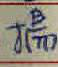

--------------------
第 80 張圖片
模型預測字為: 群
預測機率為: 0.62
照片名稱為: 9476_靜.jpg


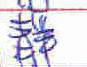

--------------------
第 81 張圖片
模型預測字為: 聲
預測機率為: 0.35
照片名稱為: 37799_靜.jpg


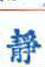

--------------------
第 82 張圖片
模型預測字為: 龍
預測機率為: 0.38
照片名稱為: 6099_靜.jpg


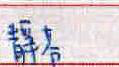

--------------------
第 83 張圖片
模型預測字為: isnull
預測機率為: 0.39
照片名稱為: 41549_網.jpg


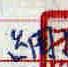

--------------------
第 84 張圖片
模型預測字為: 貨
預測機率為: 0.66
照片名稱為: 23586_店.jpg


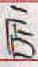

--------------------
第 85 張圖片
模型預測字為: 貨
預測機率為: 0.52
照片名稱為: 7860_店.jpg


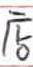

--------------------
第 86 張圖片
模型預測字為: 市
預測機率為: 0.64
照片名稱為: 24547_店.jpg


--------------------
第 87 張圖片
模型預測字為: 雪
預測機率為: 0.7
照片名稱為: 59920_雯.jpg


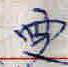

--------------------
第 88 張圖片
模型預測字為: 酒
預測機率為: 0.57
照片名稱為: 46210_雯.jpg


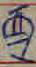

--------------------
第 89 張圖片
模型預測字為: 霞
預測機率為: 0.99
照片名稱為: 47211_雯.jpg


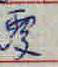

--------------------
第 90 張圖片
模型預測字為: isnull
預測機率為: 0.74
照片名稱為: 12578_雯.jpg


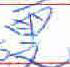

--------------------
第 91 張圖片
模型預測字為: isnull
預測機率為: 0.67
照片名稱為: 48635_雯.jpg


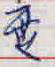

--------------------
第 92 張圖片
模型預測字為: 涵
預測機率為: 0.75
照片名稱為: 19182_丞.jpg


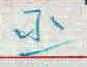

--------------------
第 93 張圖片
模型預測字為: 鄭
預測機率為: 0.83
照片名稱為: 21985_藥.jpg


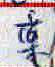

--------------------
第 94 張圖片
模型預測字為: 薇
預測機率為: 0.71
照片名稱為: 5331_藥.jpg


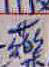

--------------------
第 95 張圖片
模型預測字為: 築
預測機率為: 0.64
照片名稱為: 26096_藥.jpg


--------------------
第 96 張圖片
模型預測字為: 茂
預測機率為: 0.42
照片名稱為: 65239_藥.jpg


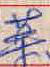

--------------------
第 97 張圖片
模型預測字為: 土
預測機率為: 0.3
照片名稱為: 10049_士.jpg


--------------------
第 98 張圖片
模型預測字為: 社
預測機率為: 0.91
照片名稱為: 17058_士.jpg


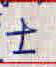

--------------------
第 99 張圖片
模型預測字為: 仕
預測機率為: 0.6
照片名稱為: 48337_士.jpg


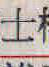

--------------------
第 100 張圖片
模型預測字為: 土
預測機率為: 0.73
照片名稱為: 19684_士.jpg


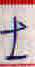

--------------------
第 101 張圖片
模型預測字為: 包
預測機率為: 0.19
照片名稱為: 23377_城.jpg


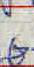

--------------------
第 102 張圖片
模型預測字為: 行
預測機率為: 0.49
照片名稱為: 9606_竹.jpg


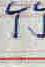

--------------------
第 103 張圖片
模型預測字為: 睿
預測機率為: 0.62
照片名稱為: 44143_宥.jpg


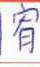

--------------------
第 104 張圖片
模型預測字為: 有
預測機率為: 0.64
照片名稱為: 34423_宥.jpg


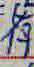

--------------------
第 105 張圖片
模型預測字為: 有
預測機率為: 0.47
照片名稱為: 31608_宥.jpg


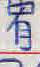

--------------------
第 106 張圖片
模型預測字為: 家
預測機率為: 0.61
照片名稱為: 54600_宥.jpg


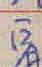

--------------------
第 107 張圖片
模型預測字為: 泰
預測機率為: 0.61
照片名稱為: 49286_券.jpg


--------------------
第 108 張圖片
模型預測字為: 榮
預測機率為: 0.95
照片名稱為: 39046_俊.jpg


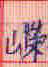

--------------------
第 109 張圖片
模型預測字為: 雯
預測機率為: 0.19
照片名稱為: 17153_慧.jpg


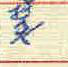

--------------------
第 110 張圖片
模型預測字為: 展
預測機率為: 0.08
照片名稱為: 10059_慧.jpg


--------------------
第 111 張圖片
模型預測字為: 普
預測機率為: 0.88
照片名稱為: 25254_音.jpg


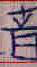

--------------------
第 112 張圖片
模型預測字為: 潘
預測機率為: 0.45
照片名稱為: 1005_音.jpg


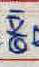

--------------------
第 113 張圖片
模型預測字為: isnull
預測機率為: 0.37
照片名稱為: 9137_營.jpg


--------------------
第 114 張圖片
模型預測字為: 灣
預測機率為: 0.83
照片名稱為: 65913_營.jpg


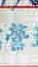

--------------------
第 115 張圖片
模型預測字為: 萱
預測機率為: 0.69
照片名稱為: 32153_營.jpg


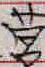

--------------------
第 116 張圖片
模型預測字為: 利
預測機率為: 0.23
照片名稱為: 55811_和.jpg


--------------------
第 117 張圖片
模型預測字為: 租
預測機率為: 0.6
照片名稱為: 9541_和.jpg


--------------------
第 118 張圖片
模型預測字為: 利
預測機率為: 0.64
照片名稱為: 48319_和.jpg


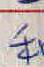

--------------------
第 119 張圖片
模型預測字為: 茹
預測機率為: 0.3
照片名稱為: 20317_和.jpg


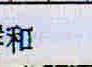

--------------------
第 120 張圖片
模型預測字為: 如
預測機率為: 0.98
照片名稱為: 7540_和.jpg


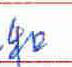

--------------------
第 121 張圖片
模型預測字為: 士
預測機率為: 0.79
照片名稱為: 65048_土.jpg


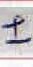

--------------------
第 122 張圖片
模型預測字為: 仕
預測機率為: 0.38
照片名稱為: 3467_土.jpg


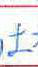

--------------------
第 123 張圖片
模型預測字為: 有
預測機率為: 0.11
照片名稱為: 10065_土.jpg


--------------------
第 124 張圖片
模型預測字為: 吉
預測機率為: 0.76
照片名稱為: 54465_土.jpg


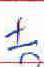

--------------------
第 125 張圖片
模型預測字為: 法
預測機率為: 0.84
照片名稱為: 47132_土.jpg


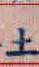

--------------------
第 126 張圖片
模型預測字為: 木
預測機率為: 0.81
照片名稱為: 41964_土.jpg


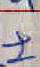

--------------------
第 127 張圖片
模型預測字為: 仕
預測機率為: 0.74
照片名稱為: 44465_土.jpg


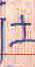

--------------------
第 128 張圖片
模型預測字為: isnull
預測機率為: 0.68
照片名稱為: 1866_楊.jpg


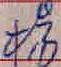

--------------------
第 129 張圖片
模型預測字為: 鍾
預測機率為: 0.51
照片名稱為: 18963_賴.jpg


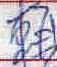

--------------------
第 130 張圖片
模型預測字為: 超
預測機率為: 0.99
照片名稱為: 19725_賴.jpg


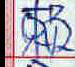

--------------------
第 131 張圖片
模型預測字為: 崇
預測機率為: 0.46
照片名稱為: 1632_榮.jpg


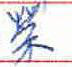

--------------------
第 132 張圖片
模型預測字為: 宋
預測機率為: 0.87
照片名稱為: 62438_榮.jpg


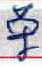

--------------------
第 133 張圖片
模型預測字為: 茶
預測機率為: 0.85
照片名稱為: 67040_榮.jpg


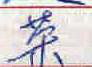

--------------------
第 134 張圖片
模型預測字為: 築
預測機率為: 0.61
照片名稱為: 33268_榮.jpg


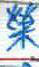

--------------------
第 135 張圖片
模型預測字為: 瑩
預測機率為: 0.56
照片名稱為: 22799_榮.jpg


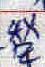

--------------------
第 136 張圖片
模型預測字為: 欣
預測機率為: 0.82
照片名稱為: 48639_旅.jpg


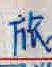

--------------------
第 137 張圖片
模型預測字為: 漁
預測機率為: 0.79
照片名稱為: 49887_旅.jpg


--------------------
第 138 張圖片
模型預測字為: 交
預測機率為: 0.23
照片名稱為: 752_奕.jpg


--------------------
第 139 張圖片
模型預測字為: isnull
預測機率為: 0.64
照片名稱為: 16484_梅.jpg


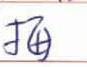

--------------------
第 140 張圖片
模型預測字為: isnull
預測機率為: 0.82
照片名稱為: 36871_育.jpg


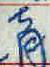

--------------------
第 141 張圖片
模型預測字為: 京
預測機率為: 0.11
照片名稱為: 5061_育.jpg


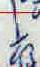

--------------------
第 142 張圖片
模型預測字為: 嘉
預測機率為: 0.32
照片名稱為: 51957_遠.jpg


--------------------
第 143 張圖片
模型預測字為: 達
預測機率為: 0.65
照片名稱為: 48887_遠.jpg


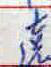

--------------------
第 144 張圖片
模型預測字為: 曉
預測機率為: 0.43
照片名稱為: 63418_遠.jpg


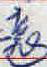

--------------------
第 145 張圖片
模型預測字為: 鄭
預測機率為: 0.18
照片名稱為: 18217_遠.jpg


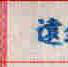

--------------------
第 146 張圖片
模型預測字為: 秀
預測機率為: 0.93
照片名稱為: 20033_香.jpg


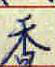

--------------------
第 147 張圖片
模型預測字為: 銷
預測機率為: 0.78
照片名稱為: 18658_鈦.jpg


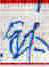

--------------------
第 148 張圖片
模型預測字為: 蘇
預測機率為: 0.54
照片名稱為: 60036_薇.jpg


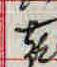

--------------------
第 149 張圖片
模型預測字為: 安
預測機率為: 0.32
照片名稱為: 49451_密.jpg


--------------------
第 150 張圖片
模型預測字為: 劉
預測機率為: 0.73
照片名稱為: 8538_密.jpg


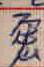

--------------------
第 151 張圖片
模型預測字為: 趙
預測機率為: 0.98
照片名稱為: 31032_雨.jpg


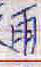

--------------------
第 152 張圖片
模型預測字為: 曾
預測機率為: 0.91
照片名稱為: 48909_智.jpg


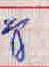

--------------------
第 153 張圖片
模型預測字為: 馬
預測機率為: 0.55
照片名稱為: 23537_區.jpg


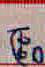

--------------------
第 154 張圖片
模型預測字為: 服
預測機率為: 0.81
照片名稱為: 10087_股.jpg


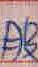

--------------------
第 155 張圖片
模型預測字為: 服
預測機率為: 0.61
照片名稱為: 61095_股.jpg


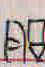

--------------------
第 156 張圖片
模型預測字為: 銀
預測機率為: 0.21
照片名稱為: 50417_旭.jpg


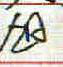

--------------------
第 157 張圖片
模型預測字為: 清
預測機率為: 0.52
照片名稱為: 22814_晴.jpg


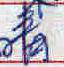

--------------------
第 158 張圖片
模型預測字為: 璟
預測機率為: 0.94
照片名稱為: 16753_瑋.jpg


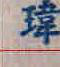

--------------------
第 159 張圖片
模型預測字為: 璟
預測機率為: 0.56
照片名稱為: 61212_瑋.jpg


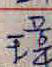

--------------------
第 160 張圖片
模型預測字為: 偉
預測機率為: 0.99
照片名稱為: 28036_瑋.jpg


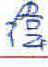

--------------------
第 161 張圖片
模型預測字為: 琦
預測機率為: 0.61
照片名稱為: 48774_瑋.jpg


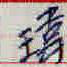

--------------------
第 162 張圖片
模型預測字為: 光
預測機率為: 0.3
照片名稱為: 16385_晟.jpg


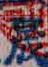

--------------------
第 163 張圖片
模型預測字為: 羅
預測機率為: 0.97
照片名稱為: 56669_晟.jpg


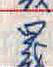

--------------------
第 164 張圖片
模型預測字為: 基
預測機率為: 0.48
照片名稱為: 29603_皇.jpg


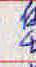

--------------------
第 165 張圖片
模型預測字為: 定
預測機率為: 0.38
照片名稱為: 17692_皇.jpg


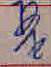

--------------------
第 166 張圖片
模型預測字為: 昱
預測機率為: 0.44
照片名稱為: 47651_皇.jpg


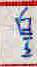

--------------------
第 167 張圖片
模型預測字為: 昱
預測機率為: 0.25
照片名稱為: 50123_皇.jpg


--------------------
第 168 張圖片
模型預測字為: 得
預測機率為: 0.23
照片名稱為: 18864_皇.jpg


--------------------
第 169 張圖片
模型預測字為: 青
預測機率為: 0.79
照片名稱為: 25576_吉.jpg


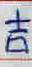

--------------------
第 170 張圖片
模型預測字為: 志
預測機率為: 0.44
照片名稱為: 58403_吉.jpg


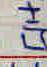

--------------------
第 171 張圖片
模型預測字為: 克
預測機率為: 0.36
照片名稱為: 16162_吉.jpg


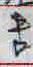

--------------------
第 172 張圖片
模型預測字為: 青
預測機率為: 0.95
照片名稱為: 30626_吉.jpg


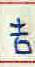

--------------------
第 173 張圖片
模型預測字為: 峰
預測機率為: 0.97
照片名稱為: 6185_陳.jpg


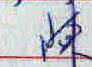

--------------------
第 174 張圖片
模型預測字為: isnull
預測機率為: 0.62
照片名稱為: 54537_陳.jpg


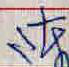

--------------------
第 175 張圖片
模型預測字為: 臻
預測機率為: 0.93
照片名稱為: 21908_蓁.jpg


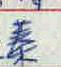

--------------------
第 176 張圖片
模型預測字為: 蕭
預測機率為: 0.41
照片名稱為: 23762_蓁.jpg


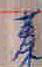

--------------------
第 177 張圖片
模型預測字為: 茹
預測機率為: 0.28
照片名稱為: 31109_易.jpg


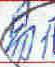

--------------------
第 178 張圖片
模型預測字為: 呂
預測機率為: 0.57
照片名稱為: 20421_易.jpg


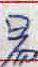

--------------------
第 179 張圖片
模型預測字為: 昌
預測機率為: 0.73
照片名稱為: 67589_易.jpg


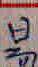

--------------------
第 180 張圖片
模型預測字為: 寓
預測機率為: 0.1
照片名稱為: 59126_訊.jpg


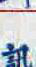

--------------------
第 181 張圖片
模型預測字為: 社
預測機率為: 0.18
照片名稱為: 18541_方.jpg


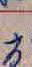

--------------------
第 182 張圖片
模型預測字為: 石
預測機率為: 0.93
照片名稱為: 36737_方.jpg


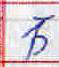

--------------------
第 183 張圖片
模型預測字為: 坊
預測機率為: 0.83
照片名稱為: 60190_方.jpg


--------------------
第 184 張圖片
模型預測字為: 自
預測機率為: 0.21
照片名稱為: 40078_平.jpg


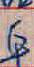

--------------------
第 185 張圖片
模型預測字為: 石
預測機率為: 0.14
照片名稱為: 39668_平.jpg


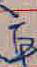

--------------------
第 186 張圖片
模型預測字為: 內
預測機率為: 0.6
照片名稱為: 4934_油.jpg


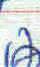

--------------------
第 187 張圖片
模型預測字為: 洲
預測機率為: 0.81
照片名稱為: 51988_油.jpg


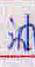

--------------------
第 188 張圖片
模型預測字為: 連
預測機率為: 0.23
照片名稱為: 40897_油.jpg


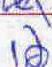

--------------------
第 189 張圖片
模型預測字為: isnull
預測機率為: 0.34
照片名稱為: 65302_琴.jpg


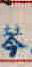

--------------------
第 190 張圖片
模型預測字為: 電
預測機率為: 0.26
照片名稱為: 47545_里.jpg


--------------------
第 191 張圖片
模型預測字為: 重
預測機率為: 0.52
照片名稱為: 43706_曹.jpg


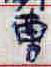

--------------------
第 192 張圖片
模型預測字為: 宏
預測機率為: 0.94
照片名稱為: 50383_空.jpg


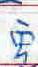

--------------------
第 193 張圖片
模型預測字為: 容
預測機率為: 0.98
照片名稱為: 63243_空.jpg


--------------------
第 194 張圖片
模型預測字為: 培
預測機率為: 0.36
照片名稱為: 63717_告.jpg


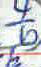

--------------------
第 195 張圖片
模型預測字為: 聯
預測機率為: 0.2
照片名稱為: 34352_告.jpg


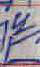

--------------------
第 196 張圖片
模型預測字為: 先
預測機率為: 0.84
照片名稱為: 47367_告.jpg


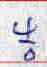

--------------------
第 197 張圖片
模型預測字為: 海
預測機率為: 0.59
照片名稱為: 60327_施.jpg


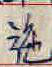

--------------------
第 198 張圖片
模型預測字為: 新
預測機率為: 0.37
照片名稱為: 26802_租.jpg


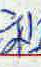

--------------------
第 199 張圖片
模型預測字為: 和
預測機率為: 0.81
照片名稱為: 20288_租.jpg


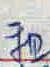

--------------------
第 200 張圖片
模型預測字為: 小
預測機率為: 0.27
照片名稱為: 36236_山.jpg


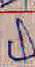

--------------------
第 201 張圖片
模型預測字為: isnull
預測機率為: 0.32
照片名稱為: 14837_山.jpg


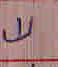

--------------------
第 202 張圖片
模型預測字為: 小
預測機率為: 0.43
照片名稱為: 4700_山.jpg


--------------------
第 203 張圖片
模型預測字為: 峰
預測機率為: 0.88
照片名稱為: 15154_山.jpg


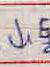

--------------------
第 204 張圖片
模型預測字為: 德
預測機率為: 0.66
照片名稱為: 57344_儒.jpg


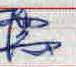

--------------------
第 205 張圖片
模型預測字為: 董
預測機率為: 0.7
照片名稱為: 33496_亨.jpg


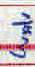

--------------------
第 206 張圖片
模型預測字為: 言
預測機率為: 0.38
照片名稱為: 58225_亨.jpg


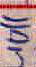

--------------------
第 207 張圖片
模型預測字為: 妹
預測機率為: 0.08
照片名稱為: 39545_好.jpg


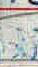

--------------------
第 208 張圖片
模型預測字為: isnull
預測機率為: 0.69
照片名稱為: 26210_好.jpg


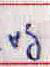

--------------------
第 209 張圖片
模型預測字為: 有
預測機率為: 0.71
照片名稱為: 24352_祐.jpg


--------------------
第 210 張圖片
模型預測字為: 坤
預測機率為: 0.48
照片名稱為: 29626_迪.jpg


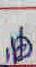

--------------------
第 211 張圖片
模型預測字為: 酒
預測機率為: 0.6
照片名稱為: 33857_迪.jpg


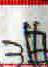

--------------------
第 212 張圖片
模型預測字為: 北
預測機率為: 0.04
照片名稱為: 17260_法.jpg


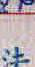

--------------------
第 213 張圖片
模型預測字為: 浩
預測機率為: 0.83
照片名稱為: 44185_法.jpg


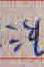

--------------------
第 214 張圖片
模型預測字為: 凌
預測機率為: 0.73
照片名稱為: 22994_法.jpg


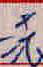

--------------------
第 215 張圖片
模型預測字為: 詹
預測機率為: 0.65
照片名稱為: 63959_屋.jpg


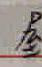

--------------------
第 216 張圖片
模型預測字為: 良
預測機率為: 0.96
照片名稱為: 60167_屋.jpg


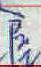

--------------------
第 217 張圖片
模型預測字為: 公
預測機率為: 0.62
照片名稱為: 58005_三.jpg


--------------------
第 218 張圖片
模型預測字為: 之
預測機率為: 0.32
照片名稱為: 68559_三.jpg


--------------------
第 219 張圖片
模型預測字為: 添
預測機率為: 0.64
照片名稱為: 49925_三.jpg


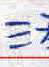

--------------------
第 220 張圖片
模型預測字為: 賓
預測機率為: 0.41
照片名稱為: 37994_盈.jpg


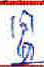

--------------------
第 221 張圖片
模型預測字為: 盧
預測機率為: 0.31
照片名稱為: 52525_盈.jpg


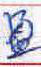

--------------------
第 222 張圖片
模型預測字為: 江
預測機率為: 0.39
照片名稱為: 48247_盈.jpg


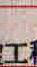

--------------------
第 223 張圖片
模型預測字為: 館
預測機率為: 0.32
照片名稱為: 44116_鉅.jpg


--------------------
第 224 張圖片
模型預測字為: 惠
預測機率為: 0.94
照片名稱為: 31547_蕙.jpg


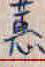

--------------------
第 225 張圖片
模型預測字為: 銷
預測機率為: 0.67
照片名稱為: 1623_鈞.jpg


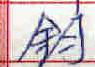

--------------------
第 226 張圖片
模型預測字為: 鉅
預測機率為: 0.37
照片名稱為: 10135_鈞.jpg


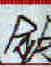

--------------------
第 227 張圖片
模型預測字為: isnull
預測機率為: 0.43
照片名稱為: 16328_章.jpg


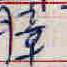

--------------------
第 228 張圖片
模型預測字為: 彰
預測機率為: 0.65
照片名稱為: 28880_章.jpg


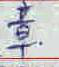

--------------------
第 229 張圖片
模型預測字為: 幸
預測機率為: 0.18
照片名稱為: 9916_章.jpg


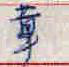

--------------------
第 230 張圖片
模型預測字為: 恆
預測機率為: 0.84
照片名稱為: 54679_自.jpg


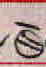

--------------------
第 231 張圖片
模型預測字為: 白
預測機率為: 0.49
照片名稱為: 13401_自.jpg


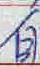

--------------------
第 232 張圖片
模型預測字為: 製
預測機率為: 0.61
照片名稱為: 2134_園.jpg


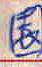

--------------------
第 233 張圖片
模型預測字為: 圓
預測機率為: 0.49
照片名稱為: 20259_園.jpg


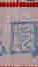

--------------------
第 234 張圖片
模型預測字為: 國
預測機率為: 0.5
照片名稱為: 61696_園.jpg


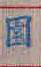

--------------------
第 235 張圖片
模型預測字為: 團
預測機率為: 0.71
照片名稱為: 61885_園.jpg


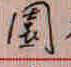

--------------------
第 236 張圖片
模型預測字為: 團
預測機率為: 0.65
照片名稱為: 37332_園.jpg


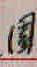

--------------------
第 237 張圖片
模型預測字為: 資
預測機率為: 0.39
照片名稱為: 50004_消.jpg


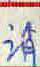

--------------------
第 238 張圖片
模型預測字為: 防
預測機率為: 0.35
照片名稱為: 39762_消.jpg


--------------------
第 239 張圖片
模型預測字為: 股
預測機率為: 0.64
照片名稱為: 4032_賃.jpg


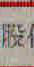

--------------------
第 240 張圖片
模型預測字為: 租
預測機率為: 0.67
照片名稱為: 7866_賃.jpg


--------------------
第 241 張圖片
模型預測字為: 寶
預測機率為: 0.34
照片名稱為: 31180_賃.jpg


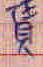

--------------------
第 242 張圖片
模型預測字為: 堂
預測機率為: 0.44
照片名稱為: 42042_姜.jpg


--------------------
第 243 張圖片
模型預測字為: 義
預測機率為: 0.29
照片名稱為: 63135_姜.jpg


--------------------
第 244 張圖片
模型預測字為: 善
預測機率為: 0.51
照片名稱為: 30354_姜.jpg


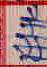

--------------------
第 245 張圖片
模型預測字為: 電
預測機率為: 0.81
照片名稱為: 2863_雪.jpg


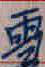

--------------------
第 246 張圖片
模型預測字為: 事
預測機率為: 0.39
照片名稱為: 22619_運.jpg


--------------------
第 247 張圖片
模型預測字為: 蓉
預測機率為: 0.4
照片名稱為: 64882_萱.jpg


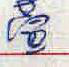

--------------------
第 248 張圖片
模型預測字為: 臺
預測機率為: 0.27
照片名稱為: 909_萱.jpg


--------------------
第 249 張圖片
模型預測字為: 揚
預測機率為: 0.86
照片名稱為: 44343_場.jpg


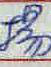

--------------------
第 250 張圖片
模型預測字為: 場
預測機率為: 0.81
照片名稱為: 37535_陽.jpg


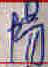

--------------------
第 251 張圖片
模型預測字為: 禎
預測機率為: 0.24
照片名稱為: 56167_陽.jpg


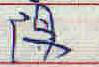

--------------------
第 252 張圖片
模型預測字為: 強
預測機率為: 0.61
照片名稱為: 9581_陽.jpg


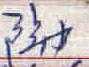

--------------------
第 253 張圖片
模型預測字為: 包
預測機率為: 0.37
照片名稱為: 62652_陽.jpg


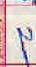

--------------------
第 254 張圖片
模型預測字為: 儒
預測機率為: 0.94
照片名稱為: 57390_陽.jpg


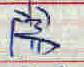

--------------------
第 255 張圖片
模型預測字為: 藝
預測機率為: 0.8
照片名稱為: 47712_蔡.jpg


--------------------
第 256 張圖片
模型預測字為: 格
預測機率為: 0.25
照片名稱為: 8457_輪.jpg


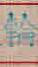

--------------------
第 257 張圖片
模型預測字為: isnull
預測機率為: 0.46
照片名稱為: 58094_護.jpg


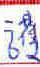

--------------------
第 258 張圖片
模型預測字為: 姿
預測機率為: 0.54
照片名稱為: 62483_護.jpg


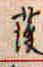

--------------------
第 259 張圖片
模型預測字為: 琳
預測機率為: 0.47
照片名稱為: 433_林.jpg


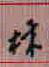

--------------------
第 260 張圖片
模型預測字為: 枝
預測機率為: 0.39
照片名稱為: 52219_林.jpg


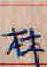

--------------------
第 261 張圖片
模型預測字為: 唐
預測機率為: 0.79
照片名稱為: 49568_康.jpg


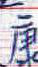

--------------------
第 262 張圖片
模型預測字為: 慶
預測機率為: 0.41
照片名稱為: 43661_康.jpg


--------------------
第 263 張圖片
模型預測字為: 基
預測機率為: 0.12
照片名稱為: 16236_澤.jpg


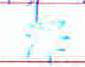

--------------------
第 264 張圖片
模型預測字為: 淨
預測機率為: 0.58
照片名稱為: 60790_澤.jpg


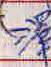

--------------------
第 265 張圖片
模型預測字為: 漁
預測機率為: 0.4
照片名稱為: 50584_臺.jpg


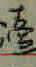

--------------------
第 266 張圖片
模型預測字為: 斯
預測機率為: 0.41
照片名稱為: 63691_基.jpg


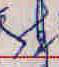

--------------------
第 267 張圖片
模型預測字為: 其
預測機率為: 0.54
照片名稱為: 37008_基.jpg


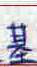

--------------------
第 268 張圖片
模型預測字為: 具
預測機率為: 0.57
照片名稱為: 45109_基.jpg


--------------------
第 269 張圖片
模型預測字為: 其
預測機率為: 0.34
照片名稱為: 54185_基.jpg


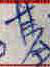

--------------------
第 270 張圖片
模型預測字為: 賓
預測機率為: 0.35
照片名稱為: 63202_員.jpg


--------------------
第 271 張圖片
模型預測字為: 通
預測機率為: 0.28
照片名稱為: 17587_員.jpg


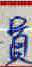

--------------------
第 272 張圖片
模型預測字為: 會
預測機率為: 1.0
照片名稱為: 37781_員.jpg


--------------------
第 273 張圖片
模型預測字為: 昌
預測機率為: 0.5
照片名稱為: 65340_員.jpg


--------------------
第 274 張圖片
模型預測字為: 實
預測機率為: 0.29
照片名稱為: 45264_員.jpg


--------------------
第 275 張圖片
模型預測字為: 廈
預測機率為: 0.4
照片名稱為: 1970_員.jpg


--------------------
第 276 張圖片
模型預測字為: 貞
預測機率為: 1.0
照片名稱為: 58533_員.jpg


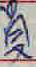

--------------------
第 277 張圖片
模型預測字為: 裕
預測機率為: 0.7
照片名稱為: 34138_谷.jpg


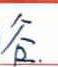

--------------------
第 278 張圖片
模型預測字為: 裕
預測機率為: 0.57
照片名稱為: 8408_谷.jpg


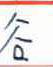

--------------------
第 279 張圖片
模型預測字為: 雨
預測機率為: 1.0
照片名稱為: 9858_爾.jpg


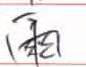

--------------------
第 280 張圖片
模型預測字為: 帝
預測機率為: 0.18
照片名稱為: 29202_敬.jpg


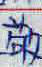

--------------------
第 281 張圖片
模型預測字為: 姜
預測機率為: 0.23
照片名稱為: 19191_美.jpg


--------------------
第 282 張圖片
模型預測字為: 晨
預測機率為: 0.39
照片名稱為: 10170_美.jpg


--------------------
第 283 張圖片
模型預測字為: 姜
預測機率為: 0.95
照片名稱為: 28281_美.jpg


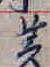

--------------------
第 284 張圖片
模型預測字為: 姜
預測機率為: 0.56
照片名稱為: 67869_美.jpg


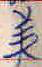

--------------------
第 285 張圖片
模型預測字為: 家
預測機率為: 0.66
照片名稱為: 58442_宗.jpg


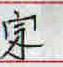

--------------------
第 286 張圖片
模型預測字為: 宋
預測機率為: 0.48
照片名稱為: 64006_宗.jpg


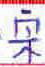

--------------------
第 287 張圖片
模型預測字為: 余
預測機率為: 0.69
照片名稱為: 39303_宗.jpg


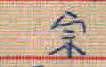

--------------------
第 288 張圖片
模型預測字為: 宇
預測機率為: 0.88
照片名稱為: 30957_宗.jpg


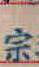

--------------------
第 289 張圖片
模型預測字為: 皇
預測機率為: 0.54
照片名稱為: 46957_宗.jpg


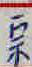

--------------------
第 290 張圖片
模型預測字為: 余
預測機率為: 0.3
照片名稱為: 59680_宗.jpg


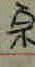

--------------------
第 291 張圖片
模型預測字為: 晶
預測機率為: 0.42
照片名稱為: 36772_佩.jpg


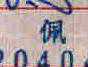

--------------------
第 292 張圖片
模型預測字為: 刷
預測機率為: 0.26
照片名稱為: 50009_isnull.jpg


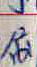

--------------------
第 293 張圖片
模型預測字為: 敦
預測機率為: 0.74
照片名稱為: 16185_isnull.jpg


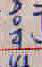

--------------------
第 294 張圖片
模型預測字為: 珍
預測機率為: 0.81
照片名稱為: 60312_isnull.jpg


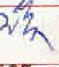

--------------------
第 295 張圖片
模型預測字為: 劉
預測機率為: 0.88
照片名稱為: 49730_isnull.jpg


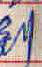

--------------------
第 296 張圖片
模型預測字為: 悅
預測機率為: 0.05
照片名稱為: 34105_isnull.jpg


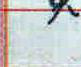

--------------------
第 297 張圖片
模型預測字為: 份
預測機率為: 0.11
照片名稱為: 23708_isnull.jpg


--------------------
第 298 張圖片
模型預測字為: 加
預測機率為: 0.08
照片名稱為: 65925_isnull.jpg


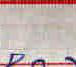

--------------------
第 299 張圖片
模型預測字為: 飾
預測機率為: 0.17
照片名稱為: 33104_isnull.jpg


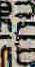

--------------------
第 300 張圖片
模型預測字為: 源
預測機率為: 0.77
照片名稱為: 64616_isnull.jpg


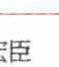

--------------------
第 301 張圖片
模型預測字為: 孟
預測機率為: 0.13
照片名稱為: 27517_isnull.jpg


--------------------
第 302 張圖片
模型預測字為: 物
預測機率為: 0.11
照片名稱為: 37783_isnull.jpg


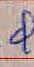

--------------------
第 303 張圖片
模型預測字為: 斯
預測機率為: 0.47
照片名稱為: 669_isnull.jpg


--------------------
第 304 張圖片
模型預測字為: 潤
預測機率為: 0.43
照片名稱為: 15955_isnull.jpg


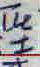

--------------------
第 305 張圖片
模型預測字為: 明
預測機率為: 0.44
照片名稱為: 23464_isnull.jpg


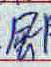

--------------------
第 306 張圖片
模型預測字為: 鍾
預測機率為: 0.51
照片名稱為: 23534_isnull.jpg


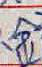

--------------------
第 307 張圖片
模型預測字為: 承
預測機率為: 0.59
照片名稱為: 6339_isnull.jpg


--------------------
第 308 張圖片
模型預測字為: 禾
預測機率為: 0.05
照片名稱為: 2554_isnull.jpg


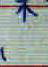

--------------------
第 309 張圖片
模型預測字為: 彰
預測機率為: 0.25
照片名稱為: 16059_isnull.jpg


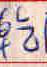

--------------------
第 310 張圖片
模型預測字為: 門
預測機率為: 0.36
照片名稱為: 42363_isnull.jpg


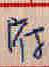

--------------------
第 311 張圖片
模型預測字為: 有
預測機率為: 0.25
照片名稱為: 37740_isnull.jpg


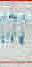

--------------------
第 312 張圖片
模型預測字為: 雪
預測機率為: 0.61
照片名稱為: 12817_isnull.jpg


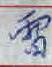

--------------------
第 313 張圖片
模型預測字為: 方
預測機率為: 0.69
照片名稱為: 60052_isnull.jpg


--------------------
第 314 張圖片
模型預測字為: 彭
預測機率為: 0.97
照片名稱為: 1197_isnull.jpg


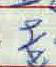

--------------------
第 315 張圖片
模型預測字為: 啟
預測機率為: 0.48
照片名稱為: 68537_isnull.jpg


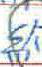

--------------------
第 316 張圖片
模型預測字為: 青
預測機率為: 0.87
照片名稱為: 65763_isnull.jpg


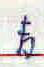

--------------------
第 317 張圖片
模型預測字為: 冠
預測機率為: 1.0
照片名稱為: 59062_isnull.jpg


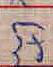

--------------------
第 318 張圖片
模型預測字為: 傅
預測機率為: 0.03
照片名稱為: 5046_isnull.jpg


--------------------
第 319 張圖片
模型預測字為: 生
預測機率為: 0.97
照片名稱為: 34216_isnull.jpg


--------------------
第 320 張圖片
模型預測字為: 備
預測機率為: 0.67
照片名稱為: 55459_isnull.jpg


--------------------
第 321 張圖片
模型預測字為: 君
預測機率為: 0.76
照片名稱為: 28102_isnull.jpg


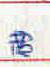

--------------------
第 322 張圖片
模型預測字為: 易
預測機率為: 0.94
照片名稱為: 68016_isnull.jpg


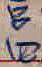

--------------------
第 323 張圖片
模型預測字為: 香
預測機率為: 0.28
照片名稱為: 22771_isnull.jpg


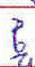

--------------------
第 324 張圖片
模型預測字為: 商
預測機率為: 0.27
照片名稱為: 28627_isnull.jpg


--------------------
第 325 張圖片
模型預測字為: 治
預測機率為: 0.52
照片名稱為: 44261_isnull.jpg


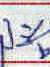

--------------------
第 326 張圖片
模型預測字為: 宗
預測機率為: 0.49
照片名稱為: 65202_isnull.jpg


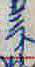

--------------------
第 327 張圖片
模型預測字為: 寧
預測機率為: 0.42
照片名稱為: 5455_isnull.jpg


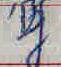

--------------------
第 328 張圖片
模型預測字為: 吉
預測機率為: 0.43
照片名稱為: 21669_isnull.jpg


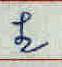

--------------------
第 329 張圖片
模型預測字為: 坊
預測機率為: 0.98
照片名稱為: 2238_isnull.jpg


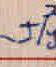

--------------------
第 330 張圖片
模型預測字為: 綸
預測機率為: 0.54
照片名稱為: 11413_isnull.jpg


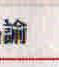

--------------------
第 331 張圖片
模型預測字為: 易
預測機率為: 0.88
照片名稱為: 31098_isnull.jpg


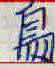

--------------------
第 332 張圖片
模型預測字為: 飾
預測機率為: 0.31
照片名稱為: 35571_isnull.jpg


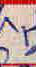

--------------------
第 333 張圖片
模型預測字為: 國
預測機率為: 1.0
照片名稱為: 18730_isnull.jpg


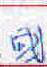

--------------------
第 334 張圖片
模型預測字為: 交
預測機率為: 0.55
照片名稱為: 4185_isnull.jpg


--------------------
第 335 張圖片
模型預測字為: 月
預測機率為: 0.23
照片名稱為: 33505_isnull.jpg


--------------------
第 336 張圖片
模型預測字為: 貨
預測機率為: 0.4
照片名稱為: 63718_isnull.jpg


--------------------
第 337 張圖片
模型預測字為: 公
預測機率為: 0.06
照片名稱為: 41071_isnull.jpg


--------------------
第 338 張圖片
模型預測字為: 添
預測機率為: 0.53
照片名稱為: 4580_isnull.jpg


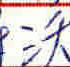

--------------------
第 339 張圖片
模型預測字為: 巫
預測機率為: 0.96
照片名稱為: 5628_isnull.jpg


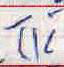

--------------------
第 340 張圖片
模型預測字為: 軒
預測機率為: 0.41
照片名稱為: 57904_isnull.jpg


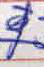

--------------------
第 341 張圖片
模型預測字為: 鋒
預測機率為: 0.22
照片名稱為: 18373_isnull.jpg


--------------------
第 342 張圖片
模型預測字為: 薛
預測機率為: 0.43
照片名稱為: 26363_isnull.jpg


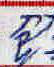

--------------------
第 343 張圖片
模型預測字為: 旺
預測機率為: 0.44
照片名稱為: 17199_isnull.jpg


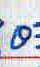

--------------------
第 344 張圖片
模型預測字為: 格
預測機率為: 0.62
照片名稱為: 8660_isnull.jpg


--------------------
第 345 張圖片
模型預測字為: 珍
預測機率為: 0.28
照片名稱為: 61979_isnull.jpg


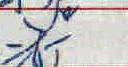

--------------------
第 346 張圖片
模型預測字為: 坊
預測機率為: 0.36
照片名稱為: 12077_isnull.jpg


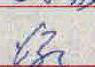

--------------------
第 347 張圖片
模型預測字為: 捷
預測機率為: 0.33
照片名稱為: 24473_isnull.jpg


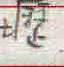

--------------------
第 348 張圖片
模型預測字為: 備
預測機率為: 0.45
照片名稱為: 19253_isnull.jpg


--------------------
第 349 張圖片
模型預測字為: 李
預測機率為: 0.8
照片名稱為: 16132_isnull.jpg


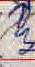

--------------------
第 350 張圖片
模型預測字為: 應
預測機率為: 0.51
照片名稱為: 24519_isnull.jpg


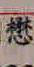

--------------------
第 351 張圖片
模型預測字為: 宇
預測機率為: 0.58
照片名稱為: 39327_isnull.jpg


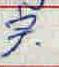

--------------------
第 352 張圖片
模型預測字為: 備
預測機率為: 0.77
照片名稱為: 66517_isnull.jpg


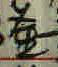

--------------------
第 353 張圖片
模型預測字為: 黃
預測機率為: 0.86
照片名稱為: 49362_isnull.jpg


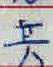

--------------------
第 354 張圖片
模型預測字為: 鵬
預測機率為: 0.59
照片名稱為: 43508_isnull.jpg


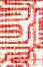

--------------------
第 355 張圖片
模型預測字為: 巨
預測機率為: 0.46
照片名稱為: 23839_isnull.jpg


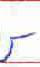

--------------------
第 356 張圖片
模型預測字為: 龍
預測機率為: 0.89
照片名稱為: 40836_isnull.jpg


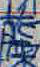

--------------------
第 357 張圖片
模型預測字為: 魏
預測機率為: 0.45
照片名稱為: 45884_isnull.jpg


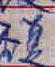

--------------------
第 358 張圖片
模型預測字為: 雅
預測機率為: 0.42
照片名稱為: 45779_isnull.jpg


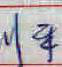

--------------------
第 359 張圖片
模型預測字為: 問
預測機率為: 0.99
照片名稱為: 9484_isnull.jpg


--------------------
第 360 張圖片
模型預測字為: 川
預測機率為: 0.25
照片名稱為: 59838_isnull.jpg


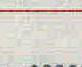

--------------------
第 361 張圖片
模型預測字為: 朱
預測機率為: 0.34
照片名稱為: 4747_isnull.jpg


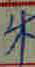

--------------------
第 362 張圖片
模型預測字為: 門
預測機率為: 0.17
照片名稱為: 65784_isnull.jpg


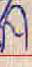

--------------------
第 363 張圖片
模型預測字為: 湯
預測機率為: 0.3
照片名稱為: 66966_isnull.jpg


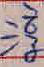

--------------------
第 364 張圖片
模型預測字為: 鍾
預測機率為: 0.92
照片名稱為: 35175_isnull.jpg


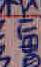

--------------------
第 365 張圖片
模型預測字為: 捷
預測機率為: 0.95
照片名稱為: 67521_isnull.jpg


--------------------
第 366 張圖片
模型預測字為: 峰
預測機率為: 0.16
照片名稱為: 9278_isnull.jpg


--------------------
第 367 張圖片
模型預測字為: 仁
預測機率為: 0.86
照片名稱為: 58732_isnull.jpg


--------------------
第 368 張圖片
模型預測字為: 連
預測機率為: 0.51
照片名稱為: 33699_isnull.jpg


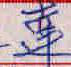

--------------------
第 369 張圖片
模型預測字為: 奇
預測機率為: 0.81
照片名稱為: 45641_isnull.jpg


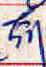

--------------------
第 370 張圖片
模型預測字為: 動
預測機率為: 0.26
照片名稱為: 40611_isnull.jpg


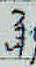

--------------------
第 371 張圖片
模型預測字為: 潘
預測機率為: 0.29
照片名稱為: 66605_isnull.jpg


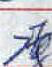

--------------------
第 372 張圖片
模型預測字為: 牙
預測機率為: 0.44
照片名稱為: 25650_isnull.jpg


--------------------
第 373 張圖片
模型預測字為: 修
預測機率為: 0.23
照片名稱為: 2485_isnull.jpg


--------------------
第 374 張圖片
模型預測字為: 聯
預測機率為: 0.67
照片名稱為: 51556_isnull.jpg


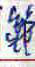

--------------------
第 375 張圖片
模型預測字為: 築
預測機率為: 0.2
照片名稱為: 63227_isnull.jpg


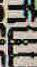

--------------------
第 376 張圖片
模型預測字為: 呂
預測機率為: 0.39
照片名稱為: 15866_isnull.jpg


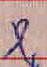

--------------------
第 377 張圖片
模型預測字為: 汽
預測機率為: 0.5
照片名稱為: 60346_isnull.jpg


--------------------
第 378 張圖片
模型預測字為: 董
預測機率為: 0.8
照片名稱為: 10376_isnull.jpg


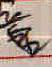

--------------------
第 379 張圖片
模型預測字為: 旭
預測機率為: 0.82
照片名稱為: 9600_isnull.jpg


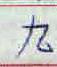

--------------------
第 380 張圖片
模型預測字為: 雅
預測機率為: 0.88
照片名稱為: 431_isnull.jpg


--------------------
第 381 張圖片
模型預測字為: 伍
預測機率為: 0.39
照片名稱為: 392_isnull.jpg


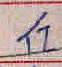

--------------------
第 382 張圖片
模型預測字為: 艾
預測機率為: 0.37
照片名稱為: 21578_isnull.jpg


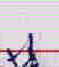

--------------------
第 383 張圖片
模型預測字為: 壽
預測機率為: 0.24
照片名稱為: 51894_isnull.jpg


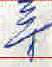

--------------------
第 384 張圖片
模型預測字為: 有
預測機率為: 0.98
照片名稱為: 68292_酒.jpg


--------------------
第 385 張圖片
模型預測字為: 鄧
預測機率為: 0.29
照片名稱為: 45208_李.jpg


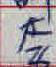

--------------------
第 386 張圖片
模型預測字為: 卓
預測機率為: 0.71
照片名稱為: 58361_百.jpg


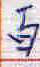

--------------------
第 387 張圖片
模型預測字為: isnull
預測機率為: 0.39
照片名稱為: 787_百.jpg


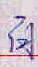

--------------------
第 388 張圖片
模型預測字為: 白
預測機率為: 0.9
照片名稱為: 19346_百.jpg


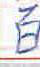

--------------------
第 389 張圖片
模型預測字為: 晶
預測機率為: 0.27
照片名稱為: 54989_百.jpg


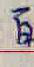

--------------------
第 390 張圖片
模型預測字為: 白
預測機率為: 0.49
照片名稱為: 37912_百.jpg


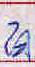

--------------------
第 391 張圖片
模型預測字為: 白
預測機率為: 0.31
照片名稱為: 9614_百.jpg


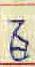

--------------------
第 392 張圖片
模型預測字為: 白
預測機率為: 0.76
照片名稱為: 50187_百.jpg


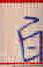

--------------------
第 393 張圖片
模型預測字為: 黃
預測機率為: 0.36
照片名稱為: 40513_先.jpg


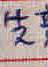

--------------------
第 394 張圖片
模型預測字為: isnull
預測機率為: 0.37
照片名稱為: 32720_先.jpg


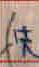

--------------------
第 395 張圖片
模型預測字為: isnull
預測機率為: 0.85
照片名稱為: 61291_媛.jpg


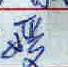

--------------------
第 396 張圖片
模型預測字為: 慶
預測機率為: 0.46
照片名稱為: 43660_媛.jpg


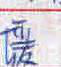

--------------------
第 397 張圖片
模型預測字為: 籌
預測機率為: 0.45
照片名稱為: 20120_業.jpg


--------------------
第 398 張圖片
模型預測字為: 梁
預測機率為: 0.63
照片名稱為: 67206_業.jpg


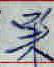

--------------------
第 399 張圖片
模型預測字為: 蕭
預測機率為: 0.76
照片名稱為: 10183_業.jpg


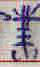

--------------------
第 400 張圖片
模型預測字為: 華
預測機率為: 0.72
照片名稱為: 63435_業.jpg


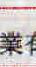

--------------------
第 401 張圖片
模型預測字為: 造
預測機率為: 0.55
照片名稱為: 3490_業.jpg


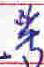

--------------------
第 402 張圖片
模型預測字為: 鵬
預測機率為: 0.96
照片名稱為: 19281_騰.jpg


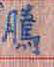

--------------------
第 403 張圖片
模型預測字為: 琦
預測機率為: 0.34
照片名稱為: 20388_騰.jpg


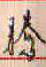

--------------------
第 404 張圖片
模型預測字為: isnull
預測機率為: 0.33
照片名稱為: 49344_菁.jpg


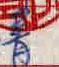

--------------------
第 405 張圖片
模型預測字為: 青
預測機率為: 0.95
照片名稱為: 1717_菁.jpg


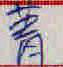

--------------------
第 406 張圖片
模型預測字為: 青
預測機率為: 0.37
照片名稱為: 30196_菁.jpg


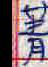

--------------------
第 407 張圖片
模型預測字為: 洲
預測機率為: 0.75
照片名稱為: 27883_北.jpg


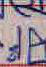

--------------------
第 408 張圖片
模型預測字為: 桃
預測機率為: 0.3
照片名稱為: 63232_北.jpg


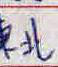

--------------------
第 409 張圖片
模型預測字為: 聰
預測機率為: 0.45
照片名稱為: 25425_整.jpg


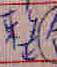

--------------------
第 410 張圖片
模型預測字為: 聚
預測機率為: 0.55
照片名稱為: 39607_整.jpg


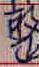

--------------------
第 411 張圖片
模型預測字為: 龍
預測機率為: 0.55
照片名稱為: 19723_能.jpg


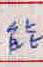

--------------------
第 412 張圖片
模型預測字為: isnull
預測機率為: 0.52
照片名稱為: 10196_能.jpg


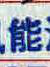

--------------------
第 413 張圖片
模型預測字為: 網
預測機率為: 0.88
照片名稱為: 26637_能.jpg


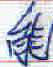

--------------------
第 414 張圖片
模型預測字為: 屬
預測機率為: 0.15
照片名稱為: 65996_能.jpg


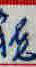

--------------------
第 415 張圖片
模型預測字為: 宇
預測機率為: 0.41
照片名稱為: 3691_星.jpg


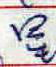

--------------------
第 416 張圖片
模型預測字為: 昇
預測機率為: 0.33
照片名稱為: 58747_星.jpg


--------------------
第 417 張圖片
模型預測字為: 聚
預測機率為: 0.23
照片名稱為: 9868_星.jpg


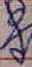

--------------------
第 418 張圖片
模型預測字為: 音
預測機率為: 0.23
照片名稱為: 45216_星.jpg


--------------------
第 419 張圖片
模型預測字為: 昆
預測機率為: 0.58
照片名稱為: 652_星.jpg


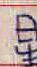

--------------------
第 420 張圖片
模型預測字為: 里
預測機率為: 0.12
照片名稱為: 61098_星.jpg


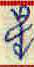

--------------------
第 421 張圖片
模型預測字為: 實
預測機率為: 0.63
照片名稱為: 47881_電.jpg


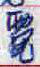

--------------------
第 422 張圖片
模型預測字為: 天
預測機率為: 0.21
照片名稱為: 62006_工.jpg


--------------------
第 423 張圖片
模型預測字為: isnull
預測機率為: 0.16
照片名稱為: 24277_工.jpg


--------------------
第 424 張圖片
模型預測字為: 仕
預測機率為: 0.18
照片名稱為: 62730_工.jpg


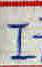

--------------------
第 425 張圖片
模型預測字為: 王
預測機率為: 0.41
照片名稱為: 43559_工.jpg


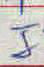

--------------------
第 426 張圖片
模型預測字為: 士
預測機率為: 0.64
照片名稱為: 48654_工.jpg


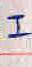

--------------------
第 427 張圖片
模型預測字為: 何
預測機率為: 0.23
照片名稱為: 34641_心.jpg


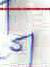

--------------------
第 428 張圖片
模型預測字為: 之
預測機率為: 0.45
照片名稱為: 33254_心.jpg


--------------------
第 429 張圖片
模型預測字為: 庭
預測機率為: 0.92
照片名稱為: 37894_廷.jpg


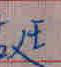

--------------------
第 430 張圖片
模型預測字為: 鋐
預測機率為: 0.8
照片名稱為: 5206_魏.jpg


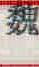

--------------------
第 431 張圖片
模型預測字為: 恆
預測機率為: 0.89
照片名稱為: 1805_悅.jpg


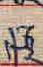

--------------------
第 432 張圖片
模型預測字為: 室
預測機率為: 0.99
照片名稱為: 57749_悅.jpg


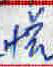

--------------------
第 433 張圖片
模型預測字為: isnull
預測機率為: 0.48
照片名稱為: 33896_翊.jpg


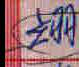

--------------------
第 434 張圖片
模型預測字為: 麟
預測機率為: 0.6
照片名稱為: 65392_臻.jpg


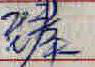

--------------------
第 435 張圖片
模型預測字為: 達
預測機率為: 0.76
照片名稱為: 22731_臻.jpg


--------------------
第 436 張圖片
模型預測字為: 龍
預測機率為: 0.59
照片名稱為: 22926_臻.jpg


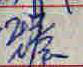

--------------------
第 437 張圖片
模型預測字為: 天
預測機率為: 0.92
照片名稱為: 22963_大.jpg


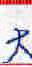

--------------------
第 438 張圖片
模型預測字為: 土
預測機率為: 0.21
照片名稱為: 61371_大.jpg


--------------------
第 439 張圖片
模型預測字為: 實
預測機率為: 0.4
照片名稱為: 897_大.jpg


--------------------
第 440 張圖片
模型預測字為: 扶
預測機率為: 0.49
照片名稱為: 47427_大.jpg


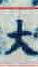

--------------------
第 441 張圖片
模型預測字為: 太
預測機率為: 0.63
照片名稱為: 3477_大.jpg


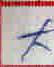

--------------------
第 442 張圖片
模型預測字為: 秋
預測機率為: 0.98
照片名稱為: 32498_利.jpg


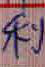

--------------------
第 443 張圖片
模型預測字為: 秋
預測機率為: 0.88
照片名稱為: 31094_利.jpg


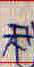

--------------------
第 444 張圖片
模型預測字為: 秋
預測機率為: 0.85
照片名稱為: 47175_利.jpg


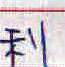

--------------------
第 445 張圖片
模型預測字為: 秋
預測機率為: 0.55
照片名稱為: 38809_利.jpg


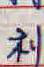

--------------------
第 446 張圖片
模型預測字為: 榕
預測機率為: 0.64
照片名稱為: 48080_賓.jpg


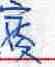

--------------------
第 447 張圖片
模型預測字為: 宥
預測機率為: 0.81
照片名稱為: 65236_賓.jpg


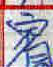

--------------------
第 448 張圖片
模型預測字為: 賓
預測機率為: 0.15
照片名稱為: 17022_慶.jpg


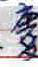

--------------------
第 449 張圖片
模型預測字為: 廣
預測機率為: 0.68
照片名稱為: 52387_慶.jpg


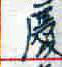

--------------------
第 450 張圖片
模型預測字為: 盧
預測機率為: 1.0
照片名稱為: 43659_慶.jpg


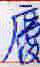

--------------------
第 451 張圖片
模型預測字為: 處
預測機率為: 0.42
照片名稱為: 3832_慶.jpg


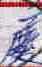

--------------------
第 452 張圖片
模型預測字為: 麗
預測機率為: 0.43
照片名稱為: 1021_慶.jpg


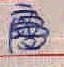

--------------------
第 453 張圖片
模型預測字為: 廖
預測機率為: 0.99
照片名稱為: 51534_慶.jpg


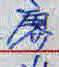

--------------------
第 454 張圖片
模型預測字為: 升
預測機率為: 0.18
照片名稱為: 21590_昇.jpg


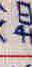

--------------------
第 455 張圖片
模型預測字為: isnull
預測機率為: 0.54
照片名稱為: 56116_昇.jpg


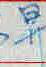

--------------------
第 456 張圖片
模型預測字為: 村
預測機率為: 0.25
照片名稱為: 47108_不.jpg


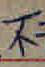

--------------------
第 457 張圖片
模型預測字為: 木
預測機率為: 0.31
照片名稱為: 57698_不.jpg


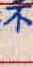

--------------------
第 458 張圖片
模型預測字為: 木
預測機率為: 0.39
照片名稱為: 13576_不.jpg


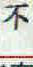

--------------------
第 459 張圖片
模型預測字為: 石
預測機率為: 0.73
照片名稱為: 2019_不.jpg


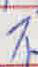

--------------------
第 460 張圖片
模型預測字為: 苗
預測機率為: 0.91
照片名稱為: 53398_呂.jpg


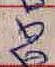

--------------------
第 461 張圖片
模型預測字為: 名
預測機率為: 0.91
照片名稱為: 40192_呂.jpg


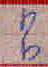

--------------------
第 462 張圖片
模型預測字為: 作
預測機率為: 0.67
照片名稱為: 29266_定.jpg


--------------------
第 463 張圖片
模型預測字為: 眾
預測機率為: 0.36
照片名稱為: 37041_定.jpg


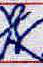

--------------------
第 464 張圖片
模型預測字為: 堂
預測機率為: 0.66
照片名稱為: 334_定.jpg


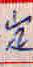

--------------------
第 465 張圖片
模型預測字為: 企
預測機率為: 0.34
照片名稱為: 27358_定.jpg


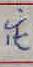

--------------------
第 466 張圖片
模型預測字為: 京
預測機率為: 0.44
照片名稱為: 52142_定.jpg


--------------------
第 467 張圖片
模型預測字為: 商
預測機率為: 0.31
照片名稱為: 3081_益.jpg


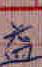

--------------------
第 468 張圖片
模型預測字為: 冠
預測機率為: 0.89
照片名稱為: 23180_益.jpg


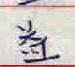

--------------------
第 469 張圖片
模型預測字為: 羅
預測機率為: 0.17
照片名稱為: 47101_益.jpg


--------------------
第 470 張圖片
模型預測字為: 孟
預測機率為: 0.93
照片名稱為: 61038_益.jpg


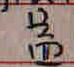

--------------------
第 471 張圖片
模型預測字為: 盧
預測機率為: 0.67
照片名稱為: 34433_益.jpg


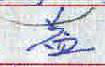

--------------------
第 472 張圖片
模型預測字為: 普
預測機率為: 0.08
照片名稱為: 5951_益.jpg


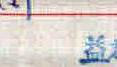

--------------------
第 473 張圖片
模型預測字為: 光
預測機率為: 0.39
照片名稱為: 34271_具.jpg


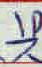

--------------------
第 474 張圖片
模型預測字為: 兒
預測機率為: 0.52
照片名稱為: 65842_具.jpg


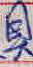

--------------------
第 475 張圖片
模型預測字為: 其
預測機率為: 0.46
照片名稱為: 10229_具.jpg


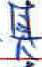

--------------------
第 476 張圖片
模型預測字為: 斯
預測機率為: 0.74
照片名稱為: 51579_具.jpg


--------------------
第 477 張圖片
模型預測字為: 其
預測機率為: 0.54
照片名稱為: 9350_具.jpg


--------------------
第 478 張圖片
模型預測字為: isnull
預測機率為: 0.3
照片名稱為: 8129_具.jpg


--------------------
第 479 張圖片
模型預測字為: 寬
預測機率為: 0.88
照片名稱為: 955_實.jpg


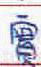

--------------------
第 480 張圖片
模型預測字為: 里
預測機率為: 0.7
照片名稱為: 5744_實.jpg


--------------------
第 481 張圖片
模型預測字為: 觀
預測機率為: 0.18
照片名稱為: 33995_實.jpg


--------------------
第 482 張圖片
模型預測字為: 全
預測機率為: 0.27
照片名稱為: 57172_欽.jpg


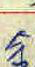

--------------------
第 483 張圖片
模型預測字為: 西
預測機率為: 0.25
照片名稱為: 44216_院.jpg


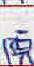

--------------------
第 484 張圖片
模型預測字為: 津
預測機率為: 0.49
照片名稱為: 18895_洋.jpg


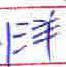

--------------------
第 485 張圖片
模型預測字為: 淨
預測機率為: 0.77
照片名稱為: 50815_洋.jpg


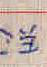

--------------------
第 486 張圖片
模型預測字為: 群
預測機率為: 0.83
照片名稱為: 6377_洋.jpg


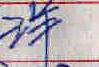

--------------------
第 487 張圖片
模型預測字為: 儒
預測機率為: 0.99
照片名稱為: 31354_麗.jpg


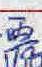

--------------------
第 488 張圖片
模型預測字為: 震
預測機率為: 0.88
照片名稱為: 15764_麗.jpg


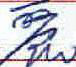

--------------------
第 489 張圖片
模型預測字為: 碧
預測機率為: 0.3
照片名稱為: 58145_麗.jpg


--------------------
第 490 張圖片
模型預測字為: 郭
預測機率為: 0.69
照片名稱為: 8826_影.jpg


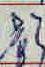

--------------------
第 491 張圖片
模型預測字為: 景
預測機率為: 0.53
照片名稱為: 20250_影.jpg


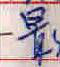

--------------------
第 492 張圖片
模型預測字為: 游
預測機率為: 0.39
照片名稱為: 45326_影.jpg


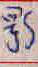

--------------------
第 493 張圖片
模型預測字為: 任
預測機率為: 0.45
照片名稱為: 40033_代.jpg


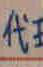

--------------------
第 494 張圖片
模型預測字為: 娥
預測機率為: 0.61
照片名稱為: 64074_代.jpg


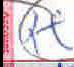

--------------------
第 495 張圖片
模型預測字為: 成
預測機率為: 0.25
照片名稱為: 31329_代.jpg


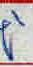

--------------------
第 496 張圖片
模型預測字為: 鈦
預測機率為: 0.99
照片名稱為: 5929_鈺.jpg


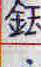

--------------------
第 497 張圖片
模型預測字為: 治
預測機率為: 0.3
照片名稱為: 1694_崇.jpg


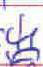

--------------------
第 498 張圖片
模型預測字為: 芳
預測機率為: 0.18
照片名稱為: 56832_崇.jpg


--------------------
第 499 張圖片
模型預測字為: 宗
預測機率為: 0.96
照片名稱為: 53741_崇.jpg


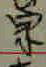

--------------------
第 500 張圖片
模型預測字為: 壽
預測機率為: 0.32
照片名稱為: 8481_崇.jpg


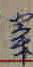

--------------------
第 501 張圖片
模型預測字為: 佑
預測機率為: 0.97
照片名稱為: 34822_侑.jpg


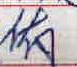

--------------------
第 502 張圖片
模型預測字為: 佑
預測機率為: 0.93
照片名稱為: 57184_侑.jpg


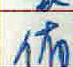

--------------------
第 503 張圖片
模型預測字為: 倫
預測機率為: 0.38
照片名稱為: 58754_侑.jpg


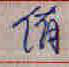

--------------------
第 504 張圖片
模型預測字為: 大
預測機率為: 0.76
照片名稱為: 47054_天.jpg


--------------------
第 505 張圖片
模型預測字為: 璟
預測機率為: 0.89
照片名稱為: 64961_媒.jpg


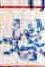

--------------------
第 506 張圖片
模型預測字為: isnull
預測機率為: 0.15
照片名稱為: 45142_媒.jpg


--------------------
第 507 張圖片
模型預測字為: 孫
預測機率為: 0.78
照片名稱為: 45592_致.jpg


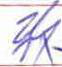

--------------------
第 508 張圖片
模型預測字為: 張
預測機率為: 0.44
照片名稱為: 42420_致.jpg


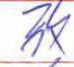

--------------------
第 509 張圖片
模型預測字為: 里
預測機率為: 0.48
照片名稱為: 38577_果.jpg


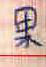

--------------------
第 510 張圖片
模型預測字為: 里
預測機率為: 0.76
照片名稱為: 57504_果.jpg


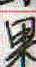

--------------------
第 511 張圖片
模型預測字為: 好
預測機率為: 0.43
照片名稱為: 38720_恆.jpg


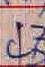

--------------------
第 512 張圖片
模型預測字為: 貴
預測機率為: 0.99
照片名稱為: 1025_買.jpg


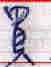

--------------------
第 513 張圖片
模型預測字為: 昇
預測機率為: 0.16
照片名稱為: 38860_買.jpg


--------------------
第 514 張圖片
模型預測字為: 閔
預測機率為: 1.0
照片名稱為: 64893_關.jpg


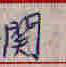

--------------------
第 515 張圖片
模型預測字為: 閔
預測機率為: 0.95
照片名稱為: 26595_關.jpg


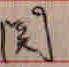

--------------------
第 516 張圖片
模型預測字為: 閔
預測機率為: 0.35
照片名稱為: 48970_關.jpg


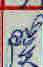

--------------------
第 517 張圖片
模型預測字為: 開
預測機率為: 0.98
照片名稱為: 5014_關.jpg


--------------------
第 518 張圖片
模型預測字為: 宥
預測機率為: 0.51
照片名稱為: 3146_有.jpg


--------------------
第 519 張圖片
模型預測字為: 保
預測機率為: 0.42
照片名稱為: 21411_有.jpg


--------------------
第 520 張圖片
模型預測字為: 青
預測機率為: 0.98
照片名稱為: 24186_有.jpg


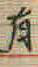

--------------------
第 521 張圖片
模型預測字為: 海
預測機率為: 0.85
照片名稱為: 3845_有.jpg


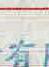

--------------------
第 522 張圖片
模型預測字為: 娥
預測機率為: 0.67
照片名稱為: 61812_璟.jpg


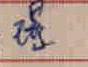

--------------------
第 523 張圖片
模型預測字為: 燕
預測機率為: 0.53
照片名稱為: 37362_鄭.jpg


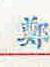

--------------------
第 524 張圖片
模型預測字為: 卿
預測機率為: 0.73
照片名稱為: 47695_鄭.jpg


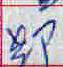

--------------------
第 525 張圖片
模型預測字為: 娟
預測機率為: 0.6
照片名稱為: 65213_胡.jpg


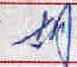

--------------------
第 526 張圖片
模型預測字為: 朝
預測機率為: 0.99
照片名稱為: 22072_胡.jpg


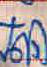

--------------------
第 527 張圖片
模型預測字為: 枝
預測機率為: 0.77
照片名稱為: 18232_桂.jpg


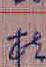

--------------------
第 528 張圖片
模型預測字為: 宋
預測機率為: 0.96
照片名稱為: 62807_京.jpg


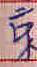

--------------------
第 529 張圖片
模型預測字為: 新
預測機率為: 0.83
照片名稱為: 42245_京.jpg


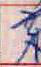

--------------------
第 530 張圖片
模型預測字為: 言
預測機率為: 0.29
照片名稱為: 50063_京.jpg


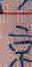

--------------------
第 531 張圖片
模型預測字為: 全
預測機率為: 0.19
照片名稱為: 47446_京.jpg


--------------------
第 532 張圖片
模型預測字為: 余
預測機率為: 0.32
照片名稱為: 60377_京.jpg


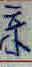

--------------------
第 533 張圖片
模型預測字為: 體
預測機率為: 0.14
照片名稱為: 53569_京.jpg


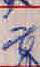

--------------------
第 534 張圖片
模型預測字為: 份
預測機率為: 0.48
照片名稱為: 62731_保.jpg


--------------------
第 535 張圖片
模型預測字為: 交
預測機率為: 0.41
照片名稱為: 62872_五.jpg


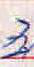

--------------------
第 536 張圖片
模型預測字為: 海
預測機率為: 0.21
照片名稱為: 36425_五.jpg


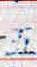

--------------------
第 537 張圖片
模型預測字為: 伍
預測機率為: 0.98
照片名稱為: 19892_五.jpg


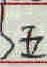

--------------------
第 538 張圖片
模型預測字為: 伍
預測機率為: 0.44
照片名稱為: 9848_五.jpg


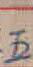

--------------------
第 539 張圖片
模型預測字為: 男
預測機率為: 0.71
照片名稱為: 55222_五.jpg


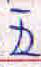

--------------------
第 540 張圖片
模型預測字為: 伍
預測機率為: 0.9
照片名稱為: 47631_五.jpg


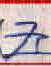

--------------------
第 541 張圖片
模型預測字為: 許
預測機率為: 0.43
照片名稱為: 42898_斯.jpg


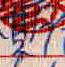

--------------------
第 542 張圖片
模型預測字為: 米
預測機率為: 0.22
照片名稱為: 17534_宋.jpg


--------------------
第 543 張圖片
模型預測字為: 岳
預測機率為: 0.41
照片名稱為: 14375_宋.jpg


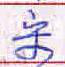

--------------------
第 544 張圖片
模型預測字為: 朱
預測機率為: 0.85
照片名稱為: 16472_宋.jpg


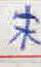

--------------------
第 545 張圖片
模型預測字為: 委
預測機率為: 0.32
照片名稱為: 67943_宋.jpg


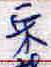

--------------------
第 546 張圖片
模型預測字為: isnull
預測機率為: 0.24
照片名稱為: 156_祥.jpg


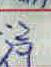

--------------------
第 547 張圖片
模型預測字為: 局
預測機率為: 0.91
照片名稱為: 20785_民.jpg


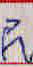

--------------------
第 548 張圖片
模型預測字為: isnull
預測機率為: 0.28
照片名稱為: 52002_民.jpg


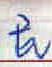

--------------------
第 549 張圖片
模型預測字為: 志
預測機率為: 0.38
照片名稱為: 60572_青.jpg


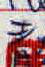

--------------------
第 550 張圖片
模型預測字為: 清
預測機率為: 0.38
照片名稱為: 5312_青.jpg


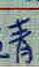

--------------------
第 551 張圖片
模型預測字為: 靜
預測機率為: 0.56
照片名稱為: 40988_青.jpg


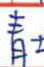

--------------------
第 552 張圖片
模型預測字為: 勝
預測機率為: 0.79
照片名稱為: 1879_務.jpg


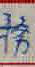

--------------------
第 553 張圖片
模型預測字為: 重
預測機率為: 0.58
照片名稱為: 17657_唐.jpg


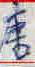

--------------------
第 554 張圖片
模型預測字為: 傅
預測機率為: 0.5
照片名稱為: 6470_唐.jpg


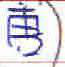

--------------------
第 555 張圖片
模型預測字為: 重
預測機率為: 0.53
照片名稱為: 3926_唐.jpg


--------------------
第 556 張圖片
模型預測字為: 造
預測機率為: 0.95
照片名稱為: 42980_浩.jpg


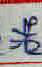

--------------------
第 557 張圖片
模型預測字為: 寬
預測機率為: 0.97
照片名稱為: 30028_貿.jpg


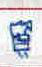

--------------------
第 558 張圖片
模型預測字為: 實
預測機率為: 0.27
照片名稱為: 68320_貿.jpg


--------------------
第 559 張圖片
模型預測字為: 智
預測機率為: 0.88
照片名稱為: 37622_貿.jpg


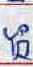

--------------------
第 560 張圖片
模型預測字為: 賀
預測機率為: 0.79
照片名稱為: 42656_貿.jpg


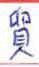

--------------------
第 561 張圖片
模型預測字為: 倉
預測機率為: 0.57
照片名稱為: 59741_食.jpg


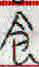

--------------------
第 562 張圖片
模型預測字為: 包
預測機率為: 0.56
照片名稱為: 30025_食.jpg


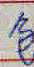

--------------------
第 563 張圖片
模型預測字為: 詹
預測機率為: 0.61
照片名稱為: 59185_盧.jpg


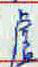

--------------------
第 564 張圖片
模型預測字為: 魏
預測機率為: 0.88
照片名稱為: 19943_禎.jpg


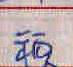

--------------------
第 565 張圖片
模型預測字為: isnull
預測機率為: 0.72
照片名稱為: 29692_裝.jpg


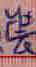

--------------------
第 566 張圖片
模型預測字為: 簡
預測機率為: 0.74
照片名稱為: 67532_裝.jpg


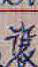

--------------------
第 567 張圖片
模型預測字為: 群
預測機率為: 0.33
照片名稱為: 53917_裝.jpg


--------------------
第 568 張圖片
模型預測字為: 瑛
預測機率為: 0.75
照片名稱為: 3824_漢.jpg


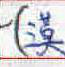

--------------------
第 569 張圖片
模型預測字為: 池
預測機率為: 0.65
照片名稱為: 55700_沈.jpg


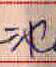

--------------------
第 570 張圖片
模型預測字為: 石
預測機率為: 0.26
照片名稱為: 56984_古.jpg


--------------------
第 571 張圖片
模型預測字為: 嘉
預測機率為: 0.17
照片名稱為: 55136_古.jpg


--------------------
第 572 張圖片
模型預測字為: 克
預測機率為: 0.66
照片名稱為: 30250_古.jpg


--------------------
第 573 張圖片
模型預測字為: 香
預測機率為: 0.55
照片名稱為: 52230_柔.jpg


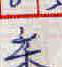

--------------------
第 574 張圖片
模型預測字為: 茶
預測機率為: 0.85
照片名稱為: 38319_柔.jpg


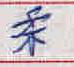

--------------------
第 575 張圖片
模型預測字為: 榮
預測機率為: 0.48
照片名稱為: 19212_柔.jpg


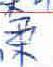

--------------------
第 576 張圖片
模型預測字為: 謝
預測機率為: 0.22
照片名稱為: 65965_聖.jpg


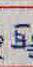

--------------------
第 577 張圖片
模型預測字為: 潤
預測機率為: 0.88
照片名稱為: 61486_聖.jpg


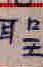

--------------------
第 578 張圖片
模型預測字為: 企
預測機率為: 0.43
照片名稱為: 32984_公.jpg


--------------------
第 579 張圖片
模型預測字為: 方
預測機率為: 0.73
照片名稱為: 1562_公.jpg


--------------------
第 580 張圖片
模型預測字為: 苗
預測機率為: 0.57
照片名稱為: 63252_蘭.jpg


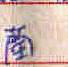

--------------------
第 581 張圖片
模型預測字為: 觀
預測機率為: 0.76
照片名稱為: 32738_蘭.jpg


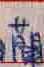

--------------------
第 582 張圖片
模型預測字為: 潤
預測機率為: 0.71
照片名稱為: 17060_蘭.jpg


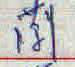

--------------------
第 583 張圖片
模型預測字為: 鍾
預測機率為: 0.73
照片名稱為: 10312_鐘.jpg


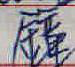

--------------------
第 584 張圖片
模型預測字為: 鍾
預測機率為: 0.7
照片名稱為: 53073_鐘.jpg


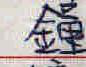

--------------------
第 585 張圖片
模型預測字為: 幸
預測機率為: 0.28
照片名稱為: 14224_素.jpg


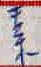

--------------------
第 586 張圖片
模型預測字為: 李
預測機率為: 0.36
照片名稱為: 15281_素.jpg


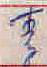

--------------------
第 587 張圖片
模型預測字為: 幸
預測機率為: 0.5
照片名稱為: 59010_素.jpg


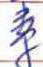

--------------------
第 588 張圖片
模型預測字為: 旻
預測機率為: 0.26
照片名稱為: 1561_素.jpg


--------------------
第 589 張圖片
模型預測字為: 青
預測機率為: 0.83
照片名稱為: 44102_素.jpg


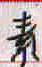

--------------------
第 590 張圖片
模型預測字為: 壽
預測機率為: 0.91
照片名稱為: 56272_素.jpg


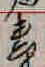

--------------------
第 591 張圖片
模型預測字為: 青
預測機率為: 0.86
照片名稱為: 5774_素.jpg


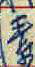

--------------------
第 592 張圖片
模型預測字為: 屋
預測機率為: 0.69
照片名稱為: 53868_居.jpg


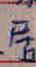

--------------------
第 593 張圖片
模型預測字為: 蓉
預測機率為: 0.49
照片名稱為: 14265_豪.jpg


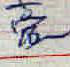

--------------------
第 594 張圖片
模型預測字為: isnull
預測機率為: 0.56
照片名稱為: 10325_豪.jpg


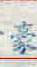

--------------------
第 595 張圖片
模型預測字為: 翰
預測機率為: 0.52
照片名稱為: 44845_豪.jpg


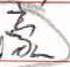

--------------------
第 596 張圖片
模型預測字為: 蘭
預測機率為: 0.9
照片名稱為: 18226_泉.jpg


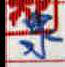

--------------------
第 597 張圖片
模型預測字為: 暘
預測機率為: 0.95
照片名稱為: 8011_泉.jpg


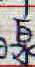

--------------------
第 598 張圖片
模型預測字為: 昱
預測機率為: 0.25
照片名稱為: 60495_泉.jpg


--------------------
第 599 張圖片
模型預測字為: 業
預測機率為: 0.51
照片名稱為: 10328_泉.jpg


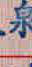

--------------------
第 600 張圖片
模型預測字為: 水
預測機率為: 0.52
照片名稱為: 9576_泉.jpg


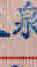

--------------------
第 601 張圖片
模型預測字為: 團
預測機率為: 0.32
照片名稱為: 22593_暉.jpg


--------------------
第 602 張圖片
模型預測字為: 凌
預測機率為: 0.94
照片名稱為: 43379_泰.jpg


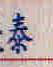

--------------------
第 603 張圖片
模型預測字為: 春
預測機率為: 0.93
照片名稱為: 60871_泰.jpg


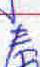

--------------------
第 604 張圖片
模型預測字為: 券
預測機率為: 0.47
照片名稱為: 43746_泰.jpg


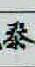

--------------------
第 605 張圖片
模型預測字為: 三
預測機率為: 0.34
照片名稱為: 65287_之.jpg


--------------------
第 606 張圖片
模型預測字為: 曹
預測機率為: 0.27
照片名稱為: 30521_曾.jpg


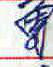

--------------------
第 607 張圖片
模型預測字為: isnull
預測機率為: 0.53
照片名稱為: 49522_曾.jpg


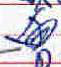

--------------------
第 608 張圖片
模型預測字為: 綸
預測機率為: 0.5
照片名稱為: 27322_綠.jpg


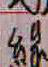

--------------------
第 609 張圖片
模型預測字為: 怡
預測機率為: 0.48
照片名稱為: 4578_治.jpg


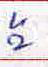

--------------------
第 610 張圖片
模型預測字為: 政
預測機率為: 0.69
照片名稱為: 14865_正.jpg


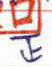

--------------------
第 611 張圖片
模型預測字為: 定
預測機率為: 0.61
照片名稱為: 15498_正.jpg


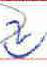

--------------------
第 612 張圖片
模型預測字為: 企
預測機率為: 0.91
照片名稱為: 52424_正.jpg


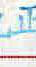

--------------------
第 613 張圖片
模型預測字為: 五
預測機率為: 0.23
照片名稱為: 23956_正.jpg


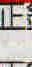

--------------------
第 614 張圖片
模型預測字為: 專
預測機率為: 0.67
照片名稱為: 65191_事.jpg


--------------------
第 615 張圖片
模型預測字為: 如
預測機率為: 0.67
照片名稱為: 32043_地.jpg


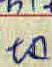

--------------------
第 616 張圖片
模型預測字為: 門
預測機率為: 0.9
照片名稱為: 53295_地.jpg


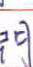

--------------------
第 617 張圖片
模型預測字為: 苑
預測機率為: 0.6
照片名稱為: 45994_地.jpg


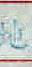

--------------------
第 618 張圖片
模型預測字為: 娥
預測機率為: 0.61
照片名稱為: 59225_地.jpg


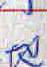

--------------------
第 619 張圖片
模型預測字為: 于
預測機率為: 0.56
照片名稱為: 30702_千.jpg


--------------------
第 620 張圖片
模型預測字為: 于
預測機率為: 0.73
照片名稱為: 41785_千.jpg


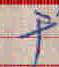

--------------------
第 621 張圖片
模型預測字為: 平
預測機率為: 0.45
照片名稱為: 5260_千.jpg


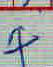

--------------------
第 622 張圖片
模型預測字為: 于
預測機率為: 0.32
照片名稱為: 50129_千.jpg


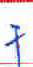

--------------------
第 623 張圖片
模型預測字為: 皓
預測機率為: 0.95
照片名稱為: 9882_巨.jpg


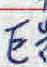

--------------------
第 624 張圖片
模型預測字為: 作
預測機率為: 0.3
照片名稱為: 5232_巨.jpg


--------------------
第 625 張圖片
模型預測字為: 大
預測機率為: 0.4
照片名稱為: 25378_生.jpg


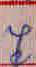

--------------------
第 626 張圖片
模型預測字為: 珠
預測機率為: 0.22
照片名稱為: 9954_生.jpg


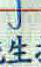

--------------------
第 627 張圖片
模型預測字為: 仕
預測機率為: 0.61
照片名稱為: 9017_生.jpg


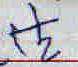

--------------------
第 628 張圖片
模型預測字為: 莊
預測機率為: 0.19
照片名稱為: 840_生.jpg


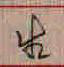

--------------------
第 629 張圖片
模型預測字為: 先
預測機率為: 0.97
照片名稱為: 53410_生.jpg


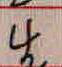

--------------------
第 630 張圖片
模型預測字為: 盧
預測機率為: 0.92
照片名稱為: 21455_寶.jpg


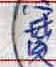

--------------------
第 631 張圖片
模型預測字為: 寧
預測機率為: 0.34
照片名稱為: 17502_寶.jpg


--------------------
第 632 張圖片
模型預測字為: 容
預測機率為: 0.25
照片名稱為: 52025_寶.jpg


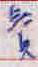

--------------------
第 633 張圖片
模型預測字為: 佑
預測機率為: 0.84
照片名稱為: 10357_拓.jpg


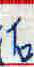

--------------------
第 634 張圖片
模型預測字為: 包
預測機率為: 0.3
照片名稱為: 17715_同.jpg


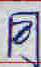

--------------------
第 635 張圖片
模型預測字為: 鳳
預測機率為: 0.51
照片名稱為: 18362_同.jpg


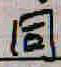

--------------------
第 636 張圖片
模型預測字為: 鳳
預測機率為: 0.36
照片名稱為: 9336_同.jpg


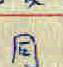

--------------------
第 637 張圖片
模型預測字為: isnull
預測機率為: 0.96
照片名稱為: 48026_同.jpg


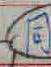

--------------------
第 638 張圖片
模型預測字為: 活
預測機率為: 0.39
照片名稱為: 10361_造.jpg


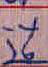

--------------------
第 639 張圖片
模型預測字為: 投
預測機率為: 0.26
照片名稱為: 67270_造.jpg


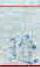

--------------------
第 640 張圖片
模型預測字為: isnull
預測機率為: 0.25
照片名稱為: 34454_飛.jpg


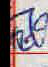

--------------------
第 641 張圖片
模型預測字為: 魏
預測機率為: 0.5
照片名稱為: 58937_飛.jpg


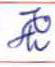

--------------------
第 642 張圖片
模型預測字為: 應
預測機率為: 0.57
照片名稱為: 44281_億.jpg


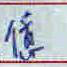

--------------------
第 643 張圖片
模型預測字為: 憶
預測機率為: 0.94
照片名稱為: 21155_億.jpg


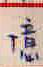

--------------------
第 644 張圖片
模型預測字為: 倫
預測機率為: 0.76
照片名稱為: 97_億.jpg


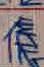

--------------------
第 645 張圖片
模型預測字為: 備
預測機率為: 1.0
照片名稱為: 6438_億.jpg


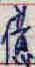

--------------------
第 646 張圖片
模型預測字為: 傅
預測機率為: 0.39
照片名稱為: 41401_億.jpg


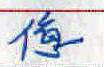

--------------------
第 647 張圖片
模型預測字為: 意
預測機率為: 0.95
照片名稱為: 54524_億.jpg


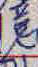

--------------------
第 648 張圖片
模型預測字為: 店
預測機率為: 0.95
照片名稱為: 62380_元.jpg


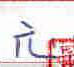

--------------------
第 649 張圖片
模型預測字為: 枝
預測機率為: 0.52
照片名稱為: 22648_技.jpg


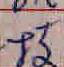

--------------------
第 650 張圖片
模型預測字為: 投
預測機率為: 0.93
照片名稱為: 20112_技.jpg


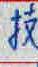

--------------------
第 651 張圖片
模型預測字為: 油
預測機率為: 0.45
照片名稱為: 53725_技.jpg


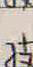

--------------------
第 652 張圖片
模型預測字為: 拉
預測機率為: 0.63
照片名稱為: 6281_技.jpg


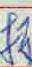

--------------------
第 653 張圖片
模型預測字為: 財
預測機率為: 0.85
照片名稱為: 22599_防.jpg


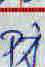

--------------------
第 654 張圖片
模型預測字為: 姜
預測機率為: 0.05
照片名稱為: 41063_多.jpg


--------------------
第 655 張圖片
模型預測字為: 梅
預測機率為: 0.27
照片名稱為: 25359_盛.jpg


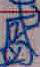

--------------------
第 656 張圖片
模型預測字為: isnull
預測機率為: 0.48
照片名稱為: 7629_麟.jpg


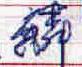

--------------------
第 657 張圖片
模型預測字為: isnull
預測機率為: 0.64
照片名稱為: 58749_麟.jpg


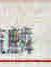

--------------------
第 658 張圖片
模型預測字為: 余
預測機率為: 0.67
照片名稱為: 42412_金.jpg


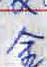

--------------------
第 659 張圖片
模型預測字為: 余
預測機率為: 0.4
照片名稱為: 66624_金.jpg


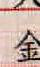

--------------------
第 660 張圖片
模型預測字為: 全
預測機率為: 0.7
照片名稱為: 35784_金.jpg


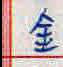

--------------------
第 661 張圖片
模型預測字為: 全
預測機率為: 0.96
照片名稱為: 58281_金.jpg


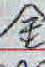

--------------------
第 662 張圖片
模型預測字為: 全
預測機率為: 0.89
照片名稱為: 65212_金.jpg


--------------------
第 663 張圖片
模型預測字為: 全
預測機率為: 0.63
照片名稱為: 63817_金.jpg


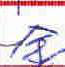

--------------------
第 664 張圖片
模型預測字為: 全
預測機率為: 0.2
照片名稱為: 51929_金.jpg


--------------------
第 665 張圖片
模型預測字為: 介
預測機率為: 0.23
照片名稱為: 42370_金.jpg


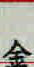

--------------------
第 666 張圖片
模型預測字為: isnull
預測機率為: 0.36
照片名稱為: 49626_霖.jpg


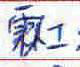

--------------------
第 667 張圖片
模型預測字為: isnull
預測機率為: 0.25
照片名稱為: 64627_玲.jpg


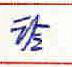

--------------------
第 668 張圖片
模型預測字為: 冷
預測機率為: 0.85
照片名稱為: 10382_玲.jpg


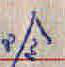

--------------------
第 669 張圖片
模型預測字為: 冷
預測機率為: 0.85
照片名稱為: 60721_玲.jpg


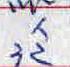

--------------------
第 670 張圖片
模型預測字為: 易
預測機率為: 0.53
照片名稱為: 4757_月.jpg


--------------------
第 671 張圖片
模型預測字為: 貝
預測機率為: 0.55
照片名稱為: 60479_月.jpg


--------------------
第 672 張圖片
模型預測字為: 苗
預測機率為: 0.35
照片名稱為: 49642_南.jpg


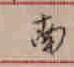

--------------------
第 673 張圖片
模型預測字為: 通
預測機率為: 0.29
照片名稱為: 65045_南.jpg


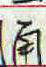

--------------------
第 674 張圖片
模型預測字為: 先
預測機率為: 0.91
照片名稱為: 10385_安.jpg


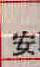

--------------------
第 675 張圖片
模型預測字為: 海
預測機率為: 1.0
照片名稱為: 30303_安.jpg


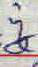

--------------------
第 676 張圖片
模型預測字為: 岳
預測機率為: 0.27
照片名稱為: 50208_安.jpg


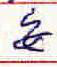

--------------------
第 677 張圖片
模型預測字為: 企
預測機率為: 0.96
照片名稱為: 8583_安.jpg


--------------------
第 678 張圖片
模型預測字為: 委
預測機率為: 0.75
照片名稱為: 14524_安.jpg


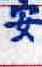

--------------------
第 679 張圖片
模型預測字為: 寬
預測機率為: 0.57
照片名稱為: 16931_安.jpg


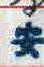

--------------------
第 680 張圖片
模型預測字為: 偉
預測機率為: 0.97
照片名稱為: 45772_集.jpg


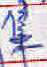

--------------------
第 681 張圖片
模型預測字為: 漢
預測機率為: 0.38
照片名稱為: 14769_集.jpg


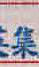

--------------------
第 682 張圖片
模型預測字為: 豪
預測機率為: 0.55
照片名稱為: 36314_亮.jpg


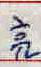

--------------------
第 683 張圖片
模型預測字為: isnull
預測機率為: 0.76
照片名稱為: 1953_亮.jpg


--------------------
第 684 張圖片
模型預測字為: 鍾
預測機率為: 0.4
照片名稱為: 2002_合.jpg


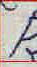

--------------------
第 685 張圖片
模型預測字為: 食
預測機率為: 0.16
照片名稱為: 63486_合.jpg


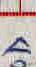

--------------------
第 686 張圖片
模型預測字為: 喬
預測機率為: 0.3
照片名稱為: 44135_合.jpg


--------------------
第 687 張圖片
模型預測字為: 份
預測機率為: 0.34
照片名稱為: 44479_合.jpg


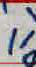

--------------------
第 688 張圖片
模型預測字為: 居
預測機率為: 0.68
照片名稱為: 20619_合.jpg


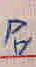

--------------------
第 689 張圖片
模型預測字為: 創
預測機率為: 0.62
照片名稱為: 59392_合.jpg


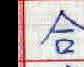

--------------------
第 690 張圖片
模型預測字為: 皓
預測機率為: 0.48
照片名稱為: 44238_合.jpg


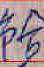

--------------------
第 691 張圖片
模型預測字為: 門
預測機率為: 0.47
照片名稱為: 40110_備.jpg


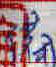

--------------------
第 692 張圖片
模型預測字為: 治
預測機率為: 0.41
照片名稱為: 67337_資.jpg


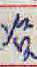

--------------------
第 693 張圖片
模型預測字為: 實
預測機率為: 0.81
照片名稱為: 53103_資.jpg


--------------------
第 694 張圖片
模型預測字為: 萱
預測機率為: 0.4
照片名稱為: 55302_資.jpg


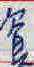

--------------------
第 695 張圖片
模型預測字為: 海
預測機率為: 0.5
照片名稱為: 14977_資.jpg


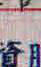

--------------------
第 696 張圖片
模型預測字為: 實
預測機率為: 0.16
照片名稱為: 18439_資.jpg


--------------------
第 697 張圖片
模型預測字為: 翔
預測機率為: 0.51
照片名稱為: 46782_凱.jpg


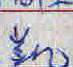

--------------------
第 698 張圖片
模型預測字為: 昭
預測機率為: 0.99
照片名稱為: 62341_服.jpg


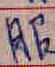

--------------------
第 699 張圖片
模型預測字為: 昭
預測機率為: 0.71
照片名稱為: 43181_服.jpg


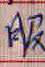

--------------------
第 700 張圖片
模型預測字為: 體
預測機率為: 0.19
照片名稱為: 63654_龍.jpg


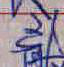

--------------------
第 701 張圖片
模型預測字為: 韻
預測機率為: 0.72
照片名稱為: 41448_龍.jpg


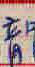

--------------------
第 702 張圖片
模型預測字為: 奇
預測機率為: 0.9
照片名稱為: 67489_黃.jpg


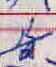

--------------------
第 703 張圖片
模型預測字為: 嬌
預測機率為: 0.42
照片名稱為: 18088_商.jpg


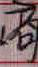

--------------------
第 704 張圖片
模型預測字為: 廠
預測機率為: 0.31
照片名稱為: 37530_商.jpg


--------------------
第 705 張圖片
模型預測字為: 內
預測機率為: 0.26
照片名稱為: 57561_商.jpg


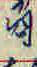

--------------------
第 706 張圖片
模型預測字為: 輝
預測機率為: 0.85
照片名稱為: 41696_睿.jpg


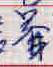

--------------------
第 707 張圖片
模型預測字為: 輝
預測機率為: 0.54
照片名稱為: 61692_睿.jpg


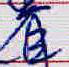

--------------------
第 708 張圖片
模型預測字為: 炳
預測機率為: 0.79
照片名稱為: 43616_內.jpg


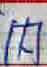

--------------------
第 709 張圖片
模型預測字為: 眾
預測機率為: 0.74
照片名稱為: 27946_家.jpg


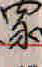

--------------------
第 710 張圖片
模型預測字為: 芬
預測機率為: 0.15
照片名稱為: 42547_包.jpg


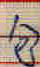

--------------------
第 711 張圖片
模型預測字為: 宗
預測機率為: 0.92
照片名稱為: 56509_秉.jpg


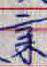

--------------------
第 712 張圖片
模型預測字為: 鄧
預測機率為: 0.95
照片名稱為: 23393_登.jpg


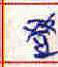

--------------------
第 713 張圖片
模型預測字為: 鄧
預測機率為: 0.58
照片名稱為: 19757_登.jpg


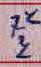

--------------------
第 714 張圖片
模型預測字為: 經
預測機率為: 0.26
照片名稱為: 20263_登.jpg


--------------------
第 715 張圖片
模型預測字為: isnull
預測機率為: 0.12
照片名稱為: 48707_社.jpg


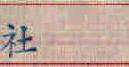

--------------------
第 716 張圖片
模型預測字為: 城
預測機率為: 0.4
照片名稱為: 25932_社.jpg


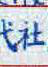

--------------------
第 717 張圖片
模型預測字為: 動
預測機率為: 0.52
照片名稱為: 56500_勳.jpg


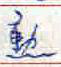

--------------------
第 718 張圖片
模型預測字為: isnull
預測機率為: 0.68
照片名稱為: 61293_勳.jpg


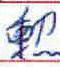

--------------------
第 719 張圖片
模型預測字為: 動
預測機率為: 0.66
照片名稱為: 38152_勳.jpg


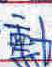

--------------------
第 720 張圖片
模型預測字為: 冷
預測機率為: 0.3
照片名稱為: 15250_念.jpg


--------------------
第 721 張圖片
模型預測字為: 限
預測機率為: 0.36
照片名稱為: 20473_辰.jpg


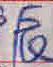

--------------------
第 722 張圖片
模型預測字為: 系
預測機率為: 0.93
照片名稱為: 68372_辰.jpg


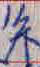

--------------------
第 723 張圖片
模型預測字為: 木
預測機率為: 0.56
照片名稱為: 48961_水.jpg


--------------------
第 724 張圖片
模型預測字為: 永
預測機率為: 0.5
照片名稱為: 6066_水.jpg


--------------------
第 725 張圖片
模型預測字為: isnull
預測機率為: 0.19
照片名稱為: 3984_汽.jpg


--------------------
第 726 張圖片
模型預測字為: 冷
預測機率為: 0.71
照片名稱為: 61591_汽.jpg


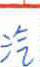

--------------------
第 727 張圖片
模型預測字為: 冷
預測機率為: 1.0
照片名稱為: 20981_汽.jpg


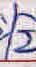

--------------------
第 728 張圖片
模型預測字為: 冷
預測機率為: 0.51
照片名稱為: 41093_汽.jpg


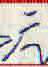

--------------------
第 729 張圖片
模型預測字為: 園
預測機率為: 0.83
照片名稱為: 60898_兒.jpg


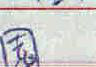

--------------------
第 730 張圖片
模型預測字為: 珍
預測機率為: 0.3
照片名稱為: 29290_仁.jpg


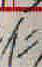

--------------------
第 731 張圖片
模型預測字為: 志
預測機率為: 0.46
照片名稱為: 19319_光.jpg


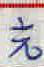

--------------------
第 732 張圖片
模型預測字為: 柯
預測機率為: 0.19
照片名稱為: 10437_光.jpg


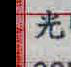

--------------------
第 733 張圖片
模型預測字為: 允
預測機率為: 0.3
照片名稱為: 30512_光.jpg


--------------------
第 734 張圖片
模型預測字為: 佑
預測機率為: 0.17
照片名稱為: 4351_行.jpg


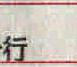

--------------------
第 735 張圖片
模型預測字為: 翰
預測機率為: 0.88
照片名稱為: 28811_瀚.jpg


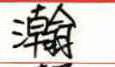

--------------------
第 736 張圖片
模型預測字為: 綸
預測機率為: 0.31
照片名稱為: 56731_瀚.jpg


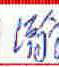

--------------------
第 737 張圖片
模型預測字為: 鈺
預測機率為: 0.47
照片名稱為: 22853_鏡.jpg


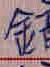

--------------------
第 738 張圖片
模型預測字為: 蓮
預測機率為: 0.77
照片名稱為: 52907_萍.jpg


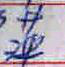

--------------------
第 739 張圖片
模型預測字為: isnull
預測機率為: 0.35
照片名稱為: 42599_萍.jpg


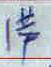

--------------------
第 740 張圖片
模型預測字為: 董
預測機率為: 1.0
照片名稱為: 56502_景.jpg


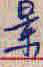

--------------------
第 741 張圖片
模型預測字為: 京
預測機率為: 0.54
照片名稱為: 5786_景.jpg


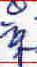

--------------------
第 742 張圖片
模型預測字為: 娥
預測機率為: 0.92
照片名稱為: 40450_燦.jpg


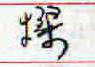

--------------------
第 743 張圖片
模型預測字為: 煜
預測機率為: 0.98
照片名稱為: 28206_煌.jpg


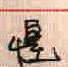

--------------------
第 744 張圖片
模型預測字為: 煜
預測機率為: 0.87
照片名稱為: 3543_煌.jpg


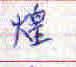

--------------------
第 745 張圖片
模型預測字為: 煜
預測機率為: 0.81
照片名稱為: 9354_煌.jpg


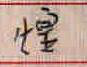

--------------------
第 746 張圖片
模型預測字為: 孫
預測機率為: 0.52
照片名稱為: 57509_沛.jpg


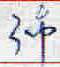

--------------------
第 747 張圖片
模型預測字為: 海
預測機率為: 0.76
照片名稱為: 59883_沛.jpg


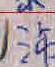

--------------------
第 748 張圖片
模型預測字為: 進
預測機率為: 0.32
照片名稱為: 56119_信.jpg


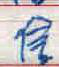

--------------------
第 749 張圖片
模型預測字為: isnull
預測機率為: 0.46
照片名稱為: 37371_信.jpg


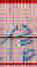

--------------------
第 750 張圖片
模型預測字為: 侯
預測機率為: 0.47
照片名稱為: 30183_信.jpg


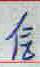

--------------------
第 751 張圖片
模型預測字為: 公
預測機率為: 0.07
照片名稱為: 49787_信.jpg


--------------------
第 752 張圖片
模型預測字為: 位
預測機率為: 0.49
照片名稱為: 27973_信.jpg


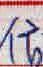

--------------------
第 753 張圖片
模型預測字為: 份
預測機率為: 0.66
照片名稱為: 30886_信.jpg


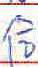

--------------------
第 754 張圖片
模型預測字為: isnull
預測機率為: 0.97
照片名稱為: 32722_廈.jpg


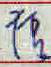

--------------------
第 755 張圖片
模型預測字為: 具
預測機率為: 0.39
照片名稱為: 24887_廈.jpg


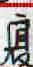

--------------------
第 756 張圖片
模型預測字為: 韋
預測機率為: 0.21
照片名稱為: 50020_茂.jpg


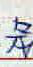

--------------------
第 757 張圖片
模型預測字為: 黎
預測機率為: 0.21
照片名稱為: 8329_茂.jpg


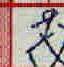

--------------------
第 758 張圖片
模型預測字為: 銓
預測機率為: 0.94
照片名稱為: 42455_鑫.jpg


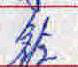

--------------------
第 759 張圖片
模型預測字為: 銓
預測機率為: 0.96
照片名稱為: 51836_鑫.jpg


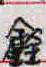

--------------------
第 760 張圖片
模型預測字為: 靖
預測機率為: 0.72
照片名稱為: 22957_貴.jpg


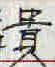

--------------------
第 761 張圖片
模型預測字為: 景
預測機率為: 0.46
照片名稱為: 1975_貴.jpg


--------------------
第 762 張圖片
模型預測字為: 曾
預測機率為: 0.69
照片名稱為: 50727_貴.jpg


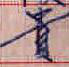

--------------------
第 763 張圖片
模型預測字為: 戴
預測機率為: 0.36
照片名稱為: 273_貴.jpg


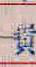

--------------------
第 764 張圖片
模型預測字為: 黃
預測機率為: 0.94
照片名稱為: 60708_貴.jpg


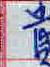

--------------------
第 765 張圖片
模型預測字為: 作
預測機率為: 0.55
照片名稱為: 922_所.jpg


--------------------
第 766 張圖片
模型預測字為: 輝
預測機率為: 0.55
照片名稱為: 37448_耀.jpg


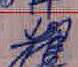

--------------------
第 767 張圖片
模型預測字為: 成
預測機率為: 0.68
照片名稱為: 9461_威.jpg


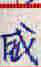

--------------------
第 768 張圖片
模型預測字為: 漁
預測機率為: 0.65
照片名稱為: 57478_威.jpg


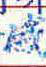

--------------------
第 769 張圖片
模型預測字為: 修
預測機率為: 0.27
照片名稱為: 48546_毅.jpg


--------------------
第 770 張圖片
模型預測字為: 齊
預測機率為: 0.98
照片名稱為: 51689_療.jpg


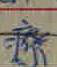

--------------------
第 771 張圖片
模型預測字為: 薇
預測機率為: 0.68
照片名稱為: 15648_燕.jpg


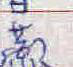

--------------------
第 772 張圖片
模型預測字為: 邱
預測機率為: 0.92
照片名稱為: 49715_印.jpg


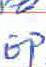

--------------------
第 773 張圖片
模型預測字為: 證
預測機率為: 0.93
照片名稱為: 37678_設.jpg


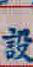

--------------------
第 774 張圖片
模型預測字為: 潘
預測機率為: 0.36
照片名稱為: 59197_海.jpg


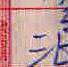

--------------------
第 775 張圖片
模型預測字為: 璃
預測機率為: 0.41
照片名稱為: 17694_彥.jpg


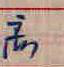

--------------------
第 776 張圖片
模型預測字為: 青
預測機率為: 0.28
照片名稱為: 26174_彥.jpg


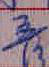

--------------------
第 777 張圖片
模型預測字為: 體
預測機率為: 0.96
照片名稱為: 24453_聰.jpg


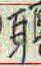

--------------------
第 778 張圖片
模型預測字為: 行
預測機率為: 0.95
照片名稱為: 47467_雄.jpg


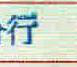

--------------------
第 779 張圖片
模型預測字為: isnull
預測機率為: 0.77
照片名稱為: 2439_雄.jpg


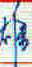

--------------------
第 780 張圖片
模型預測字為: 邦
預測機率為: 0.73
照片名稱為: 10493_雄.jpg


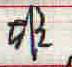

--------------------
第 781 張圖片
模型預測字為: 限
預測機率為: 0.16
照片名稱為: 65885_刷.jpg


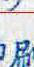

--------------------
第 782 張圖片
模型預測字為: 蘭
預測機率為: 0.93
照片名稱為: 28841_菊.jpg


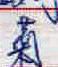

--------------------
第 783 張圖片
模型預測字為: 翰
預測機率為: 0.97
照片名稱為: 60449_菊.jpg


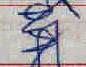

--------------------
第 784 張圖片
模型預測字為: 蘭
預測機率為: 0.67
照片名稱為: 804_菊.jpg


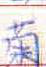

--------------------
第 785 張圖片
模型預測字為: 翔
預測機率為: 0.56
照片名稱為: 5881_菊.jpg


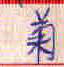

--------------------
第 786 張圖片
模型預測字為: 好
預測機率為: 0.51
照片名稱為: 14544_峻.jpg


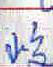

--------------------
第 787 張圖片
模型預測字為: 水
預測機率為: 0.47
照片名稱為: 48805_怡.jpg


--------------------
第 788 張圖片
模型預測字為: isnull
預測機率為: 0.25
照片名稱為: 64658_宏.jpg


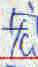

--------------------
第 789 張圖片
模型預測字為: 家
預測機率為: 0.28
照片名稱為: 3015_宏.jpg


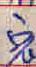

--------------------
第 790 張圖片
模型預測字為: 岳
預測機率為: 0.5
照片名稱為: 62014_宏.jpg


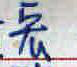

--------------------
第 791 張圖片
模型預測字為: 添
預測機率為: 0.74
照片名稱為: 55915_宏.jpg


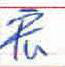

--------------------
第 792 張圖片
模型預測字為: 精
預測機率為: 0.52
照片名稱為: 62395_雅.jpg


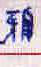

--------------------
第 793 張圖片
模型預測字為: isnull
預測機率為: 0.49
照片名稱為: 62614_雅.jpg


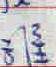

--------------------
第 794 張圖片
模型預測字為: 輪
預測機率為: 0.61
照片名稱為: 46445_險.jpg


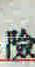

--------------------
第 795 張圖片
模型預測字為: 鋁
預測機率為: 0.86
照片名稱為: 2443_錦.jpg


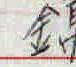

--------------------
第 796 張圖片
模型預測字為: 金
預測機率為: 0.55
照片名稱為: 27545_錦.jpg


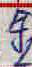

--------------------
第 797 張圖片
模型預測字為: 洲
預測機率為: 0.04
照片名稱為: 38997_錦.jpg


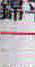

--------------------
第 798 張圖片
模型預測字為: 銘
預測機率為: 0.67
照片名稱為: 37386_錦.jpg


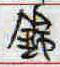

--------------------
第 799 張圖片
模型預測字為: 協
預測機率為: 0.41
照片名稱為: 50292_英.jpg


--------------------
第 800 張圖片
模型預測字為: 賀
預測機率為: 0.51
照片名稱為: 55264_貨.jpg


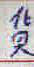

--------------------
第 801 張圖片
模型預測字為: 資
預測機率為: 0.31
照片名稱為: 62828_貨.jpg


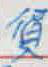

--------------------
第 802 張圖片
模型預測字為: 化
預測機率為: 0.45
照片名稱為: 10521_貨.jpg


--------------------
第 803 張圖片
模型預測字為: 大
預測機率為: 0.31
照片名稱為: 42098_人.jpg


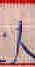

--------------------
第 804 張圖片
模型預測字為: isnull
預測機率為: 0.19
照片名稱為: 14371_人.jpg


--------------------
第 805 張圖片
模型預測字為: 大
預測機率為: 0.41
照片名稱為: 32090_人.jpg


--------------------
第 806 張圖片
模型預測字為: 秀
預測機率為: 0.31
照片名稱為: 800_茶.jpg


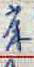

--------------------
第 807 張圖片
模型預測字為: isnull
預測機率為: 0.58
照片名稱為: 31173_茶.jpg


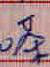

--------------------
第 808 張圖片
模型預測字為: 書
預測機率為: 0.19
照片名稱為: 9496_豐.jpg


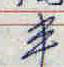

--------------------
第 809 張圖片
模型預測字為: 音
預測機率為: 0.25
照片名稱為: 50874_白.jpg


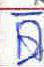

--------------------
第 810 張圖片
模型預測字為: 百
預測機率為: 0.5
照片名稱為: 26173_白.jpg


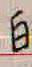

--------------------
第 811 張圖片
模型預測字為: 百
預測機率為: 0.41
照片名稱為: 36099_白.jpg


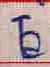

--------------------
第 812 張圖片
模型預測字為: 自
預測機率為: 0.29
照片名稱為: 38060_白.jpg


--------------------
第 813 張圖片
模型預測字為: 旺
預測機率為: 0.34
照片名稱為: 64831_昕.jpg


--------------------
第 814 張圖片
模型預測字為: 禮
預測機率為: 0.87
照片名稱為: 24912_祺.jpg


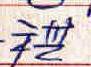

--------------------
第 815 張圖片
模型預測字為: 昌
預測機率為: 0.34
照片名稱為: 27412_局.jpg


--------------------
第 816 張圖片
模型預測字為: 宋
預測機率為: 0.78
照片名稱為: 17209_采.jpg


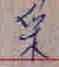

--------------------
第 817 張圖片
模型預測字為: 米
預測機率為: 0.49
照片名稱為: 38790_采.jpg


--------------------
第 818 張圖片
模型預測字為: 彩
預測機率為: 0.5
照片名稱為: 16122_采.jpg


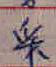

--------------------
第 819 張圖片
模型預測字為: 守
預測機率為: 0.58
照片名稱為: 29894_采.jpg


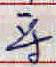

--------------------
第 820 張圖片
模型預測字為: 宋
預測機率為: 0.93
照片名稱為: 43236_采.jpg


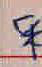

--------------------
第 821 張圖片
模型預測字為: 愛
預測機率為: 0.52
照片名稱為: 1819_采.jpg


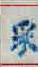

--------------------
第 822 張圖片
模型預測字為: 平
預測機率為: 0.95
照片名稱為: 55753_采.jpg


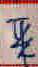

--------------------
第 823 張圖片
模型預測字為: 伊
預測機率為: 0.09
照片名稱為: 34469_采.jpg


--------------------
第 824 張圖片
模型預測字為: 花
預測機率為: 0.27
照片名稱為: 52465_權.jpg


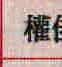

--------------------
第 825 張圖片
模型預測字為: 電
預測機率為: 0.92
照片名稱為: 8598_潘.jpg


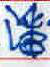

--------------------
第 826 張圖片
模型預測字為: 鄧
預測機率為: 0.51
照片名稱為: 20916_郭.jpg


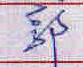

--------------------
第 827 張圖片
模型預測字為: 言
預測機率為: 0.37
照片名稱為: 53313_郭.jpg


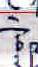

--------------------
第 828 張圖片
模型預測字為: 義
預測機率為: 0.38
照片名稱為: 36628_蕭.jpg


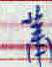

--------------------
第 829 張圖片
模型預測字為: 蘭
預測機率為: 0.32
照片名稱為: 24603_蕭.jpg


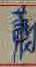

--------------------
第 830 張圖片
模型預測字為: 謝
預測機率為: 0.41
照片名稱為: 9961_許.jpg


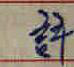

--------------------
第 831 張圖片
模型預測字為: 群
預測機率為: 0.34
照片名稱為: 28254_許.jpg


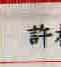

--------------------
第 832 張圖片
模型預測字為: 孟
預測機率為: 0.35
照片名稱為: 33484_紀.jpg


--------------------
第 833 張圖片
模型預測字為: 姿
預測機率為: 0.3
照片名稱為: 21564_紀.jpg


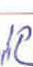

--------------------
第 834 張圖片
模型預測字為: 基
預測機率為: 0.49
照片名稱為: 10559_其.jpg


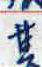

--------------------
第 835 張圖片
模型預測字為: 羽
預測機率為: 0.22
照片名稱為: 23721_團.jpg


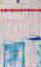

--------------------
第 836 張圖片
模型預測字為: 顯
預測機率為: 0.96
照片名稱為: 39811_縣.jpg


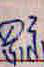

--------------------
第 837 張圖片
模型預測字為: 丁
預測機率為: 0.69
照片名稱為: 51944_于.jpg


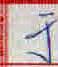

--------------------
第 838 張圖片
模型預測字為: 超
預測機率為: 0.48
照片名稱為: 46218_報.jpg


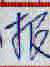

--------------------
第 839 張圖片
模型預測字為: 潤
預測機率為: 0.6
照片名稱為: 66156_閎.jpg


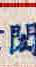

--------------------
第 840 張圖片
模型預測字為: 林
預測機率為: 0.42
照片名稱為: 66529_材.jpg


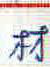

--------------------
第 841 張圖片
模型預測字為: 琳
預測機率為: 0.71
照片名稱為: 50522_材.jpg


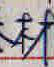

--------------------
第 842 張圖片
模型預測字為: 任
預測機率為: 0.45
照片名稱為: 67581_企.jpg


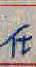

--------------------
第 843 張圖片
模型預測字為: 小
預測機率為: 0.22
照片名稱為: 39109_兆.jpg


--------------------
第 844 張圖片
模型預測字為: 北
預測機率為: 0.61
照片名稱為: 59893_兆.jpg


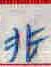

--------------------
第 845 張圖片
模型預測字為: 卿
預測機率為: 0.68
照片名稱為: 30241_部.jpg


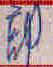

--------------------
第 846 張圖片
模型預測字為: 銘
預測機率為: 0.54
照片名稱為: 35561_全.jpg


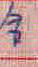

--------------------
第 847 張圖片
模型預測字為: 重
預測機率為: 0.94
照片名稱為: 22017_車.jpg


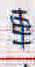

--------------------
第 848 張圖片
模型預測字為: 傳
預測機率為: 0.47
照片名稱為: 6720_車.jpg


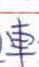

--------------------
第 849 張圖片
模型預測字為: 用
預測機率為: 0.67
照片名稱為: 38029_車.jpg


--------------------
第 850 張圖片
模型預測字為: 藥
預測機率為: 0.49
照片名稱為: 10602_車.jpg


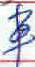

--------------------
第 851 張圖片
模型預測字為: 軒
預測機率為: 0.67
照片名稱為: 22894_車.jpg


--------------------
第 852 張圖片
模型預測字為: 連
預測機率為: 0.42
照片名稱為: 45219_車.jpg


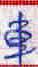

--------------------
第 853 張圖片
模型預測字為: 東
預測機率為: 0.57
照片名稱為: 50859_車.jpg


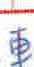

--------------------
第 854 張圖片
模型預測字為: 重
預測機率為: 0.71
照片名稱為: 9224_車.jpg


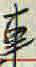

--------------------
第 855 張圖片
模型預測字為: 園
預測機率為: 0.57
照片名稱為: 22240_圓.jpg


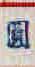

--------------------
第 856 張圖片
模型預測字為: 居
預測機率為: 0.84
照片名稱為: 27333_房.jpg


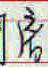

--------------------
第 857 張圖片
模型預測字為: 瑄
預測機率為: 0.85
照片名稱為: 55862_昌.jpg


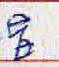

--------------------
第 858 張圖片
模型預測字為: 易
預測機率為: 0.66
照片名稱為: 67868_昌.jpg


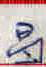

--------------------
第 859 張圖片
模型預測字為: 吳
預測機率為: 0.91
照片名稱為: 6548_昌.jpg


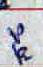

--------------------
第 860 張圖片
模型預測字為: 君
預測機率為: 0.59
照片名稱為: 7811_昌.jpg


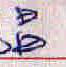

--------------------
第 861 張圖片
模型預測字為: 君
預測機率為: 0.71
照片名稱為: 5832_書.jpg


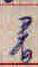

--------------------
第 862 張圖片
模型預測字為: 青
預測機率為: 0.52
照片名稱為: 49834_書.jpg


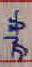

--------------------
第 863 張圖片
模型預測字為: 事
預測機率為: 0.29
照片名稱為: 40061_書.jpg


--------------------
第 864 張圖片
模型預測字為: 記
預測機率為: 0.89
照片名稱為: 23873_誠.jpg


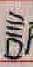

--------------------
第 865 張圖片
模型預測字為: 琇
預測機率為: 0.58
照片名稱為: 17661_珍.jpg


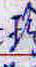

--------------------
第 866 張圖片
模型預測字為: 修
預測機率為: 0.58
照片名稱為: 24843_珍.jpg


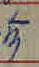

--------------------
第 867 張圖片
模型預測字為: 瑜
預測機率為: 0.98
照片名稱為: 10625_珍.jpg


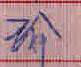

--------------------
第 868 張圖片
模型預測字為: 有
預測機率為: 0.56
照片名稱為: 45273_料.jpg


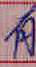

--------------------
第 869 張圖片
模型預測字為: 群
預測機率為: 0.99
照片名稱為: 52183_料.jpg


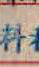

--------------------
第 870 張圖片
模型預測字為: 村
預測機率為: 0.45
照片名稱為: 65933_料.jpg


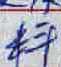

--------------------
第 871 張圖片
模型預測字為: 體
預測機率為: 0.6
照片名稱為: 32294_西.jpg


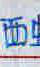

--------------------
第 872 張圖片
模型預測字為: 酒
預測機率為: 0.56
照片名稱為: 49368_西.jpg


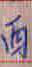

--------------------
第 873 張圖片
模型預測字為: 體
預測機率為: 0.9
照片名稱為: 10636_郎.jpg


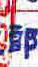

--------------------
第 874 張圖片
模型預測字為: 許
預測機率為: 0.81
照片名稱為: 37245_郎.jpg


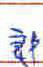

--------------------
第 875 張圖片
模型預測字為: 傳
預測機率為: 0.37
照片名稱為: 42077_專.jpg


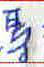

--------------------
第 876 張圖片
模型預測字為: 惠
預測機率為: 0.55
照片名稱為: 57671_專.jpg


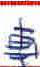

--------------------
第 877 張圖片
模型預測字為: isnull
預測機率為: 0.36
照片名稱為: 22703_專.jpg


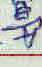

--------------------
第 878 張圖片
模型預測字為: 東
預測機率為: 0.64
照片名稱為: 60384_專.jpg


--------------------
第 879 張圖片
模型預測字為: 博
預測機率為: 0.64
照片名稱為: 46998_專.jpg


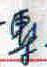

--------------------
第 880 張圖片
模型預測字為: 惠
預測機率為: 0.5
照片名稱為: 48354_專.jpg


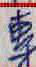

--------------------
第 881 張圖片
模型預測字為: 世
預測機率為: 0.46
照片名稱為: 19950_如.jpg


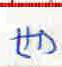

--------------------
第 882 張圖片
模型預測字為: 好
預測機率為: 0.51
照片名稱為: 35056_如.jpg


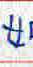

--------------------
第 883 張圖片
模型預測字為: 綺
預測機率為: 0.98
照片名稱為: 68564_統.jpg


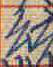

--------------------
第 884 張圖片
模型預測字為: 衛
預測機率為: 0.19
照片名稱為: 47358_統.jpg


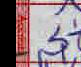

--------------------
第 885 張圖片
模型預測字為: 毓
預測機率為: 0.26
照片名稱為: 56679_統.jpg


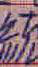

--------------------
第 886 張圖片
模型預測字為: 雄
預測機率為: 0.86
照片名稱為: 61664_柏.jpg


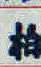

--------------------
第 887 張圖片
模型預測字為: 作
預測機率為: 0.58
照片名稱為: 29101_佳.jpg


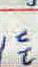

--------------------
第 888 張圖片
模型預測字為: 堡
預測機率為: 0.29
照片名稱為: 38657_佳.jpg


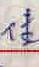

--------------------
第 889 張圖片
模型預測字為: 馨
預測機率為: 0.93
照片名稱為: 15126_傑.jpg


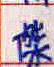

--------------------
第 890 張圖片
模型預測字為: 樂
預測機率為: 0.34
照片名稱為: 65285_傑.jpg


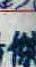

--------------------
第 891 張圖片
模型預測字為: 作
預測機率為: 0.8
照片名稱為: 57760_御.jpg


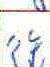

--------------------
第 892 張圖片
模型預測字為: 涵
預測機率為: 0.68
照片名稱為: 39141_泓.jpg


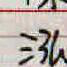

--------------------
第 893 張圖片
模型預測字為: 治
預測機率為: 0.49
照片名稱為: 62850_泓.jpg


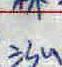

--------------------
第 894 張圖片
模型預測字為: 涵
預測機率為: 0.67
照片名稱為: 454_泓.jpg


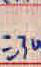

--------------------
第 895 張圖片
模型預測字為: 涵
預測機率為: 0.9
照片名稱為: 34678_泓.jpg


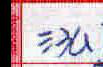

--------------------
第 896 張圖片
模型預測字為: 弘
預測機率為: 0.88
照片名稱為: 50200_泓.jpg


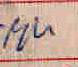

--------------------
第 897 張圖片
模型預測字為: 游
預測機率為: 1.0
照片名稱為: 26887_泓.jpg


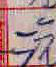

--------------------
第 898 張圖片
模型預測字為: 蓮
預測機率為: 0.74
照片名稱為: 20302_連.jpg


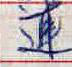

--------------------
第 899 張圖片
模型預測字為: 運
預測機率為: 0.96
照片名稱為: 56244_連.jpg


--------------------
第 900 張圖片
模型預測字為: 漢
預測機率為: 0.48
照片名稱為: 31994_連.jpg


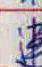

--------------------
第 901 張圖片
模型預測字為: 運
預測機率為: 0.94
照片名稱為: 51035_連.jpg


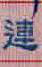

--------------------
第 902 張圖片
模型預測字為: 平
預測機率為: 0.43
照片名稱為: 40139_連.jpg


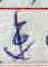

--------------------
第 903 張圖片
模型預測字為: 綺
預測機率為: 0.78
照片名稱為: 8297_緯.jpg


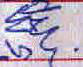

--------------------
第 904 張圖片
模型預測字為: 鋒
預測機率為: 0.27
照片名稱為: 21910_緯.jpg


--------------------
第 905 張圖片
模型預測字為: 業
預測機率為: 0.33
照片名稱為: 17566_達.jpg


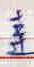

--------------------
第 906 張圖片
模型預測字為: 運
預測機率為: 0.47
照片名稱為: 30835_達.jpg


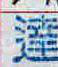

--------------------
第 907 張圖片
模型預測字為: 馬
預測機率為: 0.25
照片名稱為: 7000_原.jpg


--------------------
第 908 張圖片
模型預測字為: 珊
預測機率為: 0.64
照片名稱為: 5175_琳.jpg


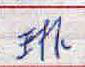

--------------------
第 909 張圖片
模型預測字為: 料
預測機率為: 0.7
照片名稱為: 10716_科.jpg


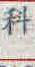

--------------------
第 910 張圖片
模型預測字為: 球
預測機率為: 0.33
照片名稱為: 63219_科.jpg


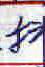

--------------------
第 911 張圖片
模型預測字為: 紀
預測機率為: 0.54
照片名稱為: 9326_科.jpg


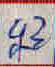

--------------------
第 912 張圖片
模型預測字為: 料
預測機率為: 0.8
照片名稱為: 68333_科.jpg


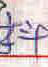

--------------------
第 913 張圖片
模型預測字為: 秋
預測機率為: 0.55
照片名稱為: 52679_科.jpg


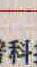

--------------------
第 914 張圖片
模型預測字為: 開
預測機率為: 0.39
照片名稱為: 27728_問.jpg


--------------------
第 915 張圖片
模型預測字為: 簡
預測機率為: 0.85
照片名稱為: 4525_問.jpg


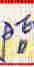

--------------------
第 916 張圖片
模型預測字為: 閔
預測機率為: 0.36
照片名稱為: 40149_問.jpg


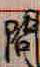

--------------------
第 917 張圖片
模型預測字為: 簡
預測機率為: 0.69
照片名稱為: 53682_問.jpg


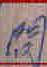

--------------------
第 918 張圖片
模型預測字為: 園
預測機率為: 0.54
照片名稱為: 24166_問.jpg


--------------------
第 919 張圖片
模型預測字為: 馨
預測機率為: 0.78
照片名稱為: 42524_聲.jpg


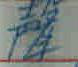

--------------------
第 920 張圖片
模型預測字為: 馨
預測機率為: 0.99
照片名稱為: 23772_聲.jpg


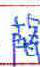

--------------------
第 921 張圖片
模型預測字為: 馨
預測機率為: 0.95
照片名稱為: 60426_聲.jpg


--------------------
第 922 張圖片
模型預測字為: 洪
預測機率為: 0.52
照片名稱為: 49748_江.jpg


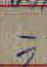

--------------------
第 923 張圖片
模型預測字為: 洪
預測機率為: 0.73
照片名稱為: 62125_江.jpg


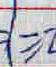

--------------------
第 924 張圖片
模型預測字為: 仁
預測機率為: 0.43
照片名稱為: 7517_江.jpg


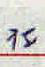

--------------------
第 925 張圖片
模型預測字為: 託
預測機率為: 0.65
照片名稱為: 23620_江.jpg


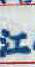

--------------------
第 926 張圖片
模型預測字為: 蘇
預測機率為: 0.36
照片名稱為: 17299_堂.jpg


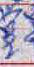

--------------------
第 927 張圖片
模型預測字為: isnull
預測機率為: 0.76
照片名稱為: 17964_堂.jpg


--------------------
第 928 張圖片
模型預測字為: 傅
預測機率為: 0.99
照片名稱為: 54921_健.jpg


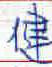

--------------------
第 929 張圖片
模型預測字為: 傅
預測機率為: 0.53
照片名稱為: 8543_健.jpg


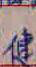

--------------------
第 930 張圖片
模型預測字為: 堅
預測機率為: 0.47
照片名稱為: 1871_庭.jpg


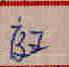

--------------------
第 931 張圖片
模型預測字為: 廷
預測機率為: 0.56
照片名稱為: 28802_庭.jpg


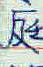

--------------------
第 932 張圖片
模型預測字為: 玉
預測機率為: 0.97
照片名稱為: 17676_王.jpg


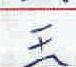

--------------------
第 933 張圖片
模型預測字為: 坊
預測機率為: 0.27
照片名稱為: 3054_王.jpg


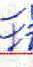

--------------------
第 934 張圖片
模型預測字為: 玉
預測機率為: 0.65
照片名稱為: 54754_王.jpg


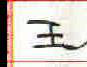

--------------------
第 935 張圖片
模型預測字為: 玉
預測機率為: 0.64
照片名稱為: 56232_王.jpg


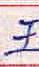

--------------------
第 936 張圖片
模型預測字為: 玉
預測機率為: 0.69
照片名稱為: 51684_王.jpg


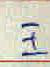

--------------------
第 937 張圖片
模型預測字為: 農
預測機率為: 0.8
照片名稱為: 23426_詹.jpg


--------------------
第 938 張圖片
模型預測字為: 瀚
預測機率為: 0.32
照片名稱為: 50124_流.jpg


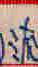

--------------------
第 939 張圖片
模型預測字為: 怡
預測機率為: 0.52
照片名稱為: 56606_台.jpg


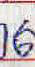

--------------------
第 940 張圖片
模型預測字為: 余
預測機率為: 0.43
照片名稱為: 7347_台.jpg


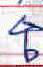

--------------------
第 941 張圖片
模型預測字為: 蓮
預測機率為: 0.63
照片名稱為: 8323_建.jpg


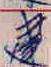

--------------------
第 942 張圖片
模型預測字為: 紋
預測機率為: 0.79
照片名稱為: 34428_紙.jpg


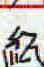

--------------------
第 943 張圖片
模型預測字為: 維
預測機率為: 0.77
照片名稱為: 47204_紙.jpg


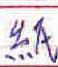

--------------------
第 944 張圖片
模型預測字為: 顧
預測機率為: 0.47
照片名稱為: 67928_紙.jpg


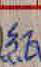

--------------------
第 945 張圖片
模型預測字為: 平
預測機率為: 0.53
照片名稱為: 22881_立.jpg


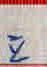

--------------------
第 946 張圖片
模型預測字為: 計
預測機率為: 0.27
照片名稱為: 6155_立.jpg


--------------------
第 947 張圖片
模型預測字為: 天
預測機率為: 0.2
照片名稱為: 2425_立.jpg


--------------------
第 948 張圖片
模型預測字為: 位
預測機率為: 0.84
照片名稱為: 66459_立.jpg


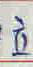

--------------------
第 949 張圖片
模型預測字為: 文
預測機率為: 0.23
照片名稱為: 56932_立.jpg


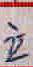

--------------------
第 950 張圖片
模型預測字為: 守
預測機率為: 0.96
照片名稱為: 51997_立.jpg


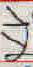

--------------------
第 951 張圖片
模型預測字為: 運
預測機率為: 0.72
照片名稱為: 30686_理.jpg


--------------------
第 952 張圖片
模型預測字為: 鄭
預測機率為: 0.39
照片名稱為: 58498_慈.jpg


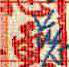

--------------------
第 953 張圖片
模型預測字為: 賓
預測機率為: 0.56
照片名稱為: 68419_慈.jpg


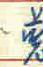

--------------------
第 954 張圖片
模型預測字為: 昭
預測機率為: 0.69
照片名稱為: 8565_皓.jpg


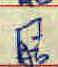

--------------------
第 955 張圖片
模型預測字為: 詠
預測機率為: 0.48
照片名稱為: 32997_記.jpg


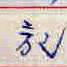

--------------------
第 956 張圖片
模型預測字為: 詠
預測機率為: 0.9
照片名稱為: 4619_記.jpg


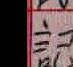

--------------------
第 957 張圖片
模型預測字為: 曾
預測機率為: 0.14
照片名稱為: 19323_記.jpg


--------------------
第 958 張圖片
模型預測字為: 言
預測機率為: 0.71
照片名稱為: 9952_記.jpg


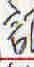

--------------------
第 959 張圖片
模型預測字為: 瑛
預測機率為: 0.7
照片名稱為: 1079_芷.jpg


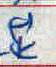

--------------------
第 960 張圖片
模型預測字為: 花
預測機率為: 0.74
照片名稱為: 3722_芷.jpg


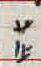

--------------------
第 961 張圖片
模型預測字為: 思
預測機率為: 0.46
照片名稱為: 32393_田.jpg


--------------------
第 962 張圖片
模型預測字為: 用
預測機率為: 0.59
照片名稱為: 23828_田.jpg


--------------------
第 963 張圖片
模型預測字為: 代
預測機率為: 0.91
照片名稱為: 44527_田.jpg


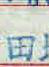

--------------------
第 964 張圖片
模型預測字為: 用
預測機率為: 0.84
照片名稱為: 58543_田.jpg


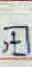

--------------------
第 965 張圖片
模型預測字為: 思
預測機率為: 0.73
照片名稱為: 29934_田.jpg


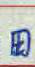

--------------------
第 966 張圖片
模型預測字為: 思
預測機率為: 0.71
照片名稱為: 41900_田.jpg


--------------------
第 967 張圖片
模型預測字為: 思
預測機率為: 0.72
照片名稱為: 39970_田.jpg


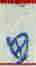

--------------------
第 968 張圖片
模型預測字為: 平
預測機率為: 0.25
照片名稱為: 19422_艾.jpg


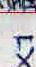

--------------------
第 969 張圖片
模型預測字為: 好
預測機率為: 0.82
照片名稱為: 25695_艾.jpg


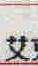

--------------------
第 970 張圖片
模型預測字為: 鈺
預測機率為: 0.66
照片名稱為: 32_升.jpg


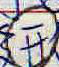

--------------------
第 971 張圖片
模型預測字為: 紋
預測機率為: 0.46
照片名稱為: 9746_升.jpg


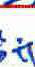

--------------------
第 972 張圖片
模型預測字為: 保
預測機率為: 0.11
照片名稱為: 46175_堡.jpg


--------------------
第 973 張圖片
模型預測字為: 保
預測機率為: 0.51
照片名稱為: 66093_堡.jpg


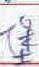

--------------------
第 974 張圖片
模型預測字為: 徐
預測機率為: 0.44
照片名稱為: 19900_堡.jpg


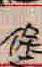

--------------------
第 975 張圖片
模型預測字為: 范
預測機率為: 0.98
照片名稱為: 67095_花.jpg


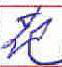

--------------------
第 976 張圖片
模型預測字為: 苑
預測機率為: 0.59
照片名稱為: 42659_花.jpg


--------------------
第 977 張圖片
模型預測字為: 雲
預測機率為: 0.7
照片名稱為: 30534_瑩.jpg


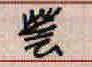

--------------------
第 978 張圖片
模型預測字為: 營
預測機率為: 0.63
照片名稱為: 63893_瑩.jpg


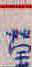

--------------------
第 979 張圖片
模型預測字為: 同
預測機率為: 0.33
照片名稱為: 27705_齊.jpg


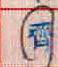

--------------------
第 980 張圖片
模型預測字為: 投
預測機率為: 0.29
照片名稱為: 51524_齊.jpg


--------------------
第 981 張圖片
模型預測字為: isnull
預測機率為: 0.27
照片名稱為: 5535_丁.jpg


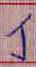

--------------------
第 982 張圖片
模型預測字為: 牙
預測機率為: 0.23
照片名稱為: 58402_丁.jpg


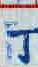

--------------------
第 983 張圖片
模型預測字為: 工
預測機率為: 0.48
照片名稱為: 23405_丁.jpg


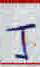

--------------------
第 984 張圖片
模型預測字為: 瑛
預測機率為: 0.55
照片名稱為: 65311_藍.jpg


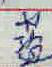

--------------------
第 985 張圖片
模型預測字為: 苗
預測機率為: 0.76
照片名稱為: 51429_藍.jpg


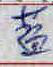

--------------------
第 986 張圖片
模型預測字為: 五
預測機率為: 0.97
照片名稱為: 18855_上.jpg


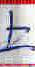

--------------------
第 987 張圖片
模型預測字為: 力
預測機率為: 0.67
照片名稱為: 68231_上.jpg


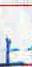

--------------------
第 988 張圖片
模型預測字為: 土
預測機率為: 0.9
照片名稱為: 64033_上.jpg


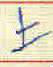

--------------------
第 989 張圖片
模型預測字為: 宏
預測機率為: 0.89
照片名稱為: 32551_宜.jpg


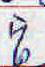

--------------------
第 990 張圖片
模型預測字為: 來
預測機率為: 0.9
照片名稱為: 48407_朱.jpg


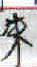

--------------------
第 991 張圖片
模型預測字為: 宋
預測機率為: 0.46
照片名稱為: 7999_朱.jpg


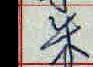

--------------------
第 992 張圖片
模型預測字為: 筱
預測機率為: 0.31
照片名稱為: 34861_築.jpg


--------------------
第 993 張圖片
模型預測字為: 生
預測機率為: 0.27
照片名稱為: 37159_築.jpg


--------------------
第 994 張圖片
模型預測字為: 動
預測機率為: 0.18
照片名稱為: 52324_憲.jpg


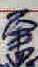

--------------------
第 995 張圖片
模型預測字為: 萬
預測機率為: 0.33
照片名稱為: 39011_憲.jpg


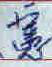

--------------------
第 996 張圖片
模型預測字為: 社
預測機率為: 0.63
照片名稱為: 31228_杜.jpg


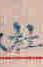

--------------------
第 997 張圖片
模型預測字為: 莊
預測機率為: 0.26
照片名稱為: 23928_杜.jpg


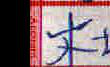

--------------------
第 998 張圖片
模型預測字為: 柯
預測機率為: 0.41
照片名稱為: 22979_杜.jpg


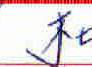

--------------------
第 999 張圖片
模型預測字為: 租
預測機率為: 0.39
照片名稱為: 13537_杜.jpg


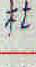

--------------------
第 1000 張圖片
模型預測字為: 社
預測機率為: 0.17
照片名稱為: 67711_杜.jpg


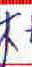

--------------------
第 1001 張圖片
模型預測字為: 蔡
預測機率為: 0.54
照片名稱為: 5327_徐.jpg


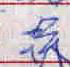

--------------------
第 1002 張圖片
模型預測字為: 保
預測機率為: 0.46
照片名稱為: 7697_徐.jpg


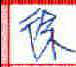

--------------------
第 1003 張圖片
模型預測字為: 體
預測機率為: 0.42
照片名稱為: 50683_牙.jpg


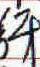

--------------------
第 1004 張圖片
模型預測字為: 雅
預測機率為: 0.91
照片名稱為: 63004_牙.jpg


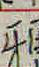

--------------------
第 1005 張圖片
模型預測字為: 董
預測機率為: 0.73
照片名稱為: 63711_重.jpg


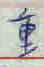

--------------------
第 1006 張圖片
模型預測字為: isnull
預測機率為: 0.21
照片名稱為: 32708_重.jpg


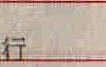

--------------------
第 1007 張圖片
模型預測字為: 晶
預測機率為: 0.93
照片名稱為: 9665_昆.jpg


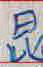

--------------------
第 1008 張圖片
模型預測字為: 誼
預測機率為: 0.34
照片名稱為: 8793_昆.jpg


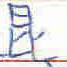

--------------------
第 1009 張圖片
模型預測字為: 計
預測機率為: 0.13
照片名稱為: 49268_虹.jpg


--------------------
第 1010 張圖片
模型預測字為: isnull
預測機率為: 0.41
照片名稱為: 27168_銷.jpg


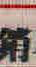

--------------------
第 1011 張圖片
模型預測字為: 消
預測機率為: 0.98
照片名稱為: 61983_銷.jpg


--------------------
第 1012 張圖片
模型預測字為: 鎮
預測機率為: 0.7
照片名稱為: 17794_銷.jpg


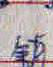

--------------------
第 1013 張圖片
模型預測字為: 大
預測機率為: 0.52
照片名稱為: 29405_太.jpg


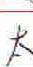

--------------------
第 1014 張圖片
模型預測字為: 民
預測機率為: 0.23
照片名稱為: 32606_展.jpg


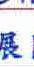

--------------------
第 1015 張圖片
模型預測字為: 田
預測機率為: 0.87
照片名稱為: 45861_用.jpg


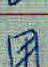

--------------------
第 1016 張圖片
模型預測字為: 田
預測機率為: 0.54
照片名稱為: 9172_用.jpg


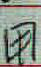

--------------------
第 1017 張圖片
模型預測字為: 億
預測機率為: 0.87
照片名稱為: 21574_意.jpg


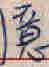

--------------------
第 1018 張圖片
模型預測字為: 音
預測機率為: 0.23
照片名稱為: 20220_意.jpg


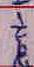

--------------------
第 1019 張圖片
模型預測字為: 憶
預測機率為: 0.58
照片名稱為: 68709_意.jpg


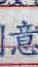

--------------------
第 1020 張圖片
模型預測字為: 億
預測機率為: 0.44
照片名稱為: 47854_意.jpg


--------------------
第 1021 張圖片
模型預測字為: 通
預測機率為: 0.24
照片名稱為: 8209_宸.jpg


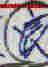

--------------------
第 1022 張圖片
模型預測字為: 晨
預測機率為: 0.65
照片名稱為: 48188_宸.jpg


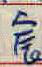

--------------------
第 1023 張圖片
模型預測字為: 飲
預測機率為: 0.96
照片名稱為: 64096_館.jpg


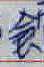

--------------------
第 1024 張圖片
模型預測字為: 利
預測機率為: 0.96
照片名稱為: 10928_莉.jpg


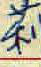

--------------------
第 1025 張圖片
模型預測字為: 鈺
預測機率為: 0.37
照片名稱為: 48956_創.jpg


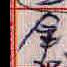

--------------------
第 1026 張圖片
模型預測字為: 合
預測機率為: 0.27
照片名稱為: 10932_創.jpg


--------------------
第 1027 張圖片
模型預測字為: isnull
預測機率為: 0.88
照片名稱為: 61088_創.jpg


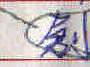

--------------------
第 1028 張圖片
模型預測字為: 財
預測機率為: 0.39
照片名稱為: 50655_投.jpg


--------------------
第 1029 張圖片
模型預測字為: 地
預測機率為: 0.64
照片名稱為: 55887_投.jpg


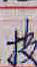

--------------------
第 1030 張圖片
模型預測字為: 程
預測機率為: 0.81
照片名稱為: 894_投.jpg


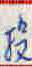

--------------------
第 1031 張圖片
模型預測字為: isnull
預測機率為: 0.34
照片名稱為: 47567_投.jpg


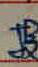

--------------------
第 1032 張圖片
模型預測字為: 政
預測機率為: 0.29
照片名稱為: 34537_玫.jpg


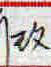

--------------------
第 1033 張圖片
模型預測字為: 秋
預測機率為: 0.51
照片名稱為: 56748_玫.jpg


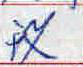

--------------------
第 1034 張圖片
模型預測字為: 灣
預測機率為: 0.29
照片名稱為: 37809_謝.jpg


--------------------
第 1035 張圖片
模型預測字為: 材
預測機率為: 0.54
照片名稱為: 32589_謝.jpg


--------------------
第 1036 張圖片
模型預測字為: 育
預測機率為: 0.56
照片名稱為: 30601_道.jpg


--------------------
第 1037 張圖片
模型預測字為: 舜
預測機率為: 0.59
照片名稱為: 18767_愛.jpg


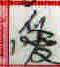

--------------------
第 1038 張圖片
模型預測字為: 黃
預測機率為: 0.79
照片名稱為: 59767_愛.jpg


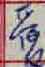

--------------------
第 1039 張圖片
模型預測字為: 馨
預測機率為: 0.49
照片名稱為: 38729_愛.jpg


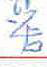

--------------------
第 1040 張圖片
模型預測字為: 內
預測機率為: 0.97
照片名稱為: 45404_力.jpg


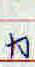

--------------------
第 1041 張圖片
模型預測字為: 花
預測機率為: 0.18
照片名稱為: 38961_力.jpg


--------------------
第 1042 張圖片
模型預測字為: 電
預測機率為: 0.49
照片名稱為: 52527_寬.jpg


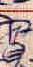

--------------------
第 1043 張圖片
模型預測字為: 賓
預測機率為: 0.78
照片名稱為: 7500_寬.jpg


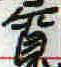

--------------------
第 1044 張圖片
模型預測字為: 寶
預測機率為: 0.51
照片名稱為: 62505_寬.jpg


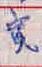

--------------------
第 1045 張圖片
模型預測字為: isnull
預測機率為: 0.3
照片名稱為: 42393_寬.jpg


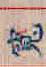

--------------------
第 1046 張圖片
模型預測字為: 宣
預測機率為: 0.81
照片名稱為: 56461_寬.jpg


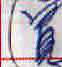

--------------------
第 1047 張圖片
模型預測字為: isnull
預測機率為: 0.58
照片名稱為: 19988_莊.jpg


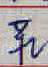

--------------------
第 1048 張圖片
模型預測字為: 斯
預測機率為: 0.26
照片名稱為: 57652_物.jpg


--------------------
第 1049 張圖片
模型預測字為: isnull
預測機率為: 0.59
照片名稱為: 23227_松.jpg


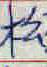

--------------------
第 1050 張圖片
模型預測字為: 錦
預測機率為: 0.2
照片名稱為: 41368_飲.jpg


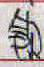

--------------------
第 1051 張圖片
模型預測字為: 方
預測機率為: 0.79
照片名稱為: 43421_久.jpg


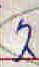

--------------------
第 1052 張圖片
模型預測字為: 農
預測機率為: 0.72
照片名稱為: 44609_晨.jpg


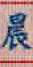

--------------------
第 1053 張圖片
模型預測字為: 場
預測機率為: 0.37
照片名稱為: 18267_晨.jpg


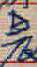

--------------------
第 1054 張圖片
模型預測字為: 基
預測機率為: 0.71
照片名稱為: 28743_晨.jpg


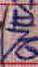

--------------------
第 1055 張圖片
模型預測字為: 風
預測機率為: 0.91
照片名稱為: 29005_精.jpg


--------------------
第 1056 張圖片
模型預測字為: isnull
預測機率為: 0.25
照片名稱為: 20778_亞.jpg


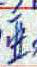

--------------------
第 1057 張圖片
模型預測字為: 西
預測機率為: 0.89
照片名稱為: 51114_亞.jpg


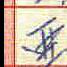

--------------------
第 1058 張圖片
模型預測字為: 虹
預測機率為: 0.31
照片名稱為: 49097_亞.jpg


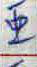

--------------------
第 1059 張圖片
模型預測字為: 京
預測機率為: 0.3
照片名稱為: 54276_高.jpg


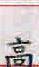

--------------------
第 1060 張圖片
模型預測字為: 尚
預測機率為: 0.93
照片名稱為: 4174_高.jpg


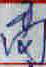

--------------------
第 1061 張圖片
模型預測字為: 亮
預測機率為: 0.96
照片名稱為: 16353_高.jpg


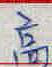

--------------------
第 1062 張圖片
模型預測字為: 京
預測機率為: 0.7
照片名稱為: 10975_高.jpg


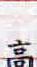

--------------------
第 1063 張圖片
模型預測字為: 京
預測機率為: 0.27
照片名稱為: 50906_高.jpg


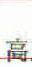

--------------------
第 1064 張圖片
模型預測字為: 馮
預測機率為: 0.79
照片名稱為: 35855_高.jpg


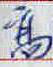

--------------------
第 1065 張圖片
模型預測字為: 堂
預測機率為: 0.19
照片名稱為: 882_富.jpg


--------------------
第 1066 張圖片
模型預測字為: 計
預測機率為: 0.56
照片名稱為: 49656_富.jpg


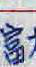

--------------------
第 1067 張圖片
模型預測字為: 隆
預測機率為: 1.0
照片名稱為: 53054_際.jpg


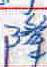

--------------------
第 1068 張圖片
模型預測字為: 易
預測機率為: 0.99
照片名稱為: 45106_際.jpg


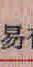

--------------------
第 1069 張圖片
模型預測字為: 寬
預測機率為: 0.53
照片名稱為: 3970_寧.jpg


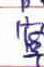

--------------------
第 1070 張圖片
模型預測字為: 寓
預測機率為: 0.98
照片名稱為: 60355_寧.jpg


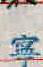

--------------------
第 1071 張圖片
模型預測字為: 寬
預測機率為: 0.53
照片名稱為: 26327_寧.jpg


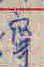

--------------------
第 1072 張圖片
模型預測字為: 食
預測機率為: 0.26
照片名稱為: 6262_管.jpg


--------------------
第 1073 張圖片
模型預測字為: 營
預測機率為: 0.5
照片名稱為: 56835_管.jpg


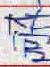

--------------------
第 1074 張圖片
模型預測字為: 群
預測機率為: 0.05
照片名稱為: 46182_管.jpg


--------------------
第 1075 張圖片
模型預測字為: 場
預測機率為: 0.79
照片名稱為: 57785_管.jpg


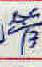

--------------------
第 1076 張圖片
模型預測字為: 木
預測機率為: 0.76
照片名稱為: 20083_小.jpg


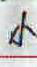

--------------------
第 1077 張圖片
模型預測字為: 可
預測機率為: 0.62
照片名稱為: 41699_小.jpg


--------------------
第 1078 張圖片
模型預測字為: 魏
預測機率為: 0.43
照片名稱為: 68285_鋐.jpg


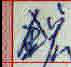

--------------------
第 1079 張圖片
模型預測字為: 先
預測機率為: 0.2
照片名稱為: 30090_鋐.jpg


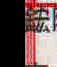

--------------------
第 1080 張圖片
模型預測字為: 錦
預測機率為: 0.46
照片名稱為: 5917_鋐.jpg


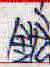

--------------------
第 1081 張圖片
模型預測字為: 投
預測機率為: 0.45
照片名稱為: 41551_顧.jpg


--------------------
第 1082 張圖片
模型預測字為: 實
預測機率為: 0.15
照片名稱為: 43833_顧.jpg


--------------------
第 1083 張圖片
模型預測字為: 月
預測機率為: 0.25
照片名稱為: 45704_日.jpg


--------------------
第 1084 張圖片
模型預測字為: 月
預測機率為: 0.67
照片名稱為: 47949_日.jpg


--------------------
第 1085 張圖片
模型預測字為: 月
預測機率為: 0.84
照片名稱為: 4594_日.jpg


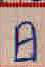

--------------------
第 1086 張圖片
模型預測字為: 音
預測機率為: 0.38
照片名稱為: 52735_日.jpg


--------------------
第 1087 張圖片
模型預測字為: 昇
預測機率為: 0.23
照片名稱為: 7692_日.jpg


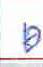

--------------------
第 1088 張圖片
模型預測字為: 易
預測機率為: 0.31
照片名稱為: 15317_日.jpg


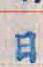

--------------------
第 1089 張圖片
模型預測字為: 月
預測機率為: 0.45
照片名稱為: 1856_日.jpg


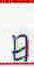

--------------------
第 1090 張圖片
模型預測字為: 田
預測機率為: 0.8
照片名稱為: 38385_日.jpg


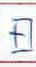

--------------------
第 1091 張圖片
模型預測字為: 塑
預測機率為: 0.34
照片名稱為: 66980_昶.jpg


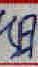

--------------------
第 1092 張圖片
模型預測字為: 詹
預測機率為: 0.14
照片名稱為: 55737_呈.jpg


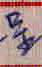

--------------------
第 1093 張圖片
模型預測字為: 奕
預測機率為: 0.25
照片名稱為: 21078_呈.jpg


--------------------
第 1094 張圖片
模型預測字為: 基
預測機率為: 0.29
照片名稱為: 6360_津.jpg


--------------------
第 1095 張圖片
模型預測字為: 學
預測機率為: 0.77
照片名稱為: 31556_屬.jpg


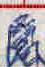

--------------------
第 1096 張圖片
模型預測字為: 倫
預測機率為: 0.94
照片名稱為: 30742_屬.jpg


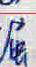

--------------------
第 1097 張圖片
模型預測字為: 籌
預測機率為: 0.19
照片名稱為: 11053_系.jpg


--------------------
第 1098 張圖片
模型預測字為: 絲
預測機率為: 0.89
照片名稱為: 39798_系.jpg


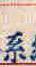

--------------------
第 1099 張圖片
模型預測字為: 體
預測機率為: 0.96
照片名稱為: 61748_農.jpg


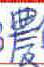

--------------------
第 1100 張圖片
模型預測字為: 震
預測機率為: 0.5
照片名稱為: 48347_農.jpg


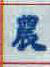

--------------------
第 1101 張圖片
模型預測字為: 空
預測機率為: 0.33
照片名稱為: 1724_會.jpg


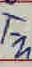

--------------------
第 1102 張圖片
模型預測字為: 飲
預測機率為: 0.33
照片名稱為: 64025_會.jpg


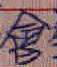

--------------------
第 1103 張圖片
模型預測字為: 倫
預測機率為: 0.15
照片名稱為: 11070_醫.jpg


--------------------
第 1104 張圖片
模型預測字為: isnull
預測機率為: 0.27
照片名稱為: 32646_醫.jpg


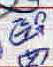

--------------------
第 1105 張圖片
模型預測字為: 酒
預測機率為: 0.24
照片名稱為: 54747_醫.jpg


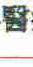

--------------------
第 1106 張圖片
模型預測字為: 應
預測機率為: 0.54
照片名稱為: 11071_德.jpg


--------------------
第 1107 張圖片
模型預測字為: 傅
預測機率為: 0.44
照片名稱為: 4570_德.jpg


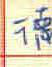

--------------------
第 1108 張圖片
模型預測字為: 萍
預測機率為: 0.99
照片名稱為: 29291_蓮.jpg


--------------------
第 1109 張圖片
模型預測字為: 茂
預測機率為: 0.3
照片名稱為: 6492_蓮.jpg


--------------------
第 1110 張圖片
模型預測字為: isnull
預測機率為: 0.43
照片名稱為: 26221_通.jpg


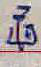

--------------------
第 1111 張圖片
模型預測字為: 道
預測機率為: 0.65
照片名稱為: 35074_通.jpg


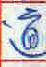

--------------------
第 1112 張圖片
模型預測字為: 酒
預測機率為: 0.86
照片名稱為: 45160_通.jpg


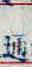

--------------------
第 1113 張圖片
模型預測字為: 報
預測機率為: 0.24
照片名稱為: 65805_子.jpg


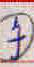

--------------------
第 1114 張圖片
模型預測字為: isnull
預測機率為: 0.22
照片名稱為: 37720_哲.jpg


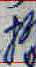

--------------------
第 1115 張圖片
模型預測字為: 能
預測機率為: 0.49
照片名稱為: 9994_助.jpg


--------------------
第 1116 張圖片
模型預測字為: 群
預測機率為: 0.18
照片名稱為: 43878_助.jpg


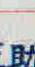

--------------------
第 1117 張圖片
模型預測字為: 藍
預測機率為: 0.43
照片名稱為: 22188_數.jpg


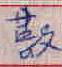

--------------------
第 1118 張圖片
模型預測字為: 教
預測機率為: 0.51
照片名稱為: 30792_數.jpg


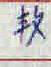

--------------------
第 1119 張圖片
模型預測字為: 趙
預測機率為: 0.48
照片名稱為: 42432_志.jpg


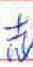

--------------------
第 1120 張圖片
模型預測字為: isnull
預測機率為: 0.89
照片名稱為: 62108_志.jpg


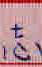

--------------------
第 1121 張圖片
模型預測字為: 賴
預測機率為: 0.99
照片名稱為: 25469_帝.jpg


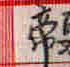

--------------------
第 1122 張圖片
模型預測字為: 宜
預測機率為: 0.45
照片名稱為: 57537_宣.jpg


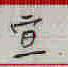

--------------------
第 1123 張圖片
模型預測字為: 萱
預測機率為: 0.98
照片名稱為: 29800_宣.jpg


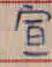

--------------------
第 1124 張圖片
模型預測字為: 章
預測機率為: 0.66
照片名稱為: 23026_宣.jpg


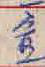

--------------------
第 1125 張圖片
模型預測字為: 富
預測機率為: 0.83
照片名稱為: 43088_宣.jpg


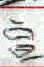

--------------------
第 1126 張圖片
模型預測字為: 員
預測機率為: 0.45
照片名稱為: 31966_貝.jpg


--------------------
第 1127 張圖片
模型預測字為: 企
預測機率為: 0.86
照片名稱為: 4045_發.jpg


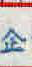

--------------------
第 1128 張圖片
模型預測字為: 鄧
預測機率為: 0.83
照片名稱為: 878_發.jpg


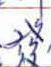

--------------------
第 1129 張圖片
模型預測字為: 嘉
預測機率為: 0.66
照片名稱為: 45428_喜.jpg


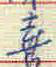

--------------------
第 1130 張圖片
模型預測字為: 嘉
預測機率為: 0.51
照片名稱為: 24801_喜.jpg


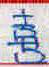

--------------------
第 1131 張圖片
模型預測字為: 嘉
預測機率為: 0.75
照片名稱為: 24391_喜.jpg


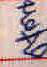

--------------------
第 1132 張圖片
模型預測字為: 嬌
預測機率為: 0.61
照片名稱為: 47407_婷.jpg


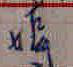

--------------------
第 1133 張圖片
模型預測字為: 融
預測機率為: 0.38
照片名稱為: 68258_霞.jpg


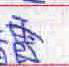

--------------------
第 1134 張圖片
模型預測字為: 寬
預測機率為: 0.72
照片名稱為: 11167_霞.jpg


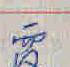

--------------------
第 1135 張圖片
模型預測字為: 榕
預測機率為: 0.97
照片名稱為: 25397_機.jpg


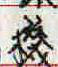

--------------------
第 1136 張圖片
模型預測字為: 地
預測機率為: 0.99
照片名稱為: 34695_玻.jpg


--------------------
第 1137 張圖片
模型預測字為: 沛
預測機率為: 0.26
照片名稱為: 56163_承.jpg


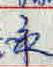

--------------------
第 1138 張圖片
模型預測字為: 丞
預測機率為: 0.82
照片名稱為: 65210_承.jpg


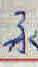

--------------------
第 1139 張圖片
模型預測字為: 永
預測機率為: 0.91
照片名稱為: 11208_承.jpg


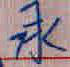

--------------------
第 1140 張圖片
模型預測字為: 雅
預測機率為: 0.49
照片名稱為: 45032_承.jpg


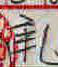

--------------------
第 1141 張圖片
模型預測字為: 鄧
預測機率為: 0.12
照片名稱為: 612_承.jpg


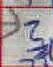

--------------------
第 1142 張圖片
模型預測字為: isnull
預測機率為: 0.8
照片名稱為: 31798_璃.jpg


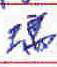

--------------------
第 1143 張圖片
模型預測字為: 產
預測機率為: 0.93
照片名稱為: 68754_動.jpg


--------------------
第 1144 張圖片
模型預測字為: 沈
預測機率為: 0.79
照片名稱為: 55233_動.jpg


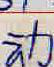

--------------------
第 1145 張圖片
模型預測字為: 瑛
預測機率為: 1.0
照片名稱為: 19770_瑞.jpg


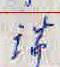

--------------------
第 1146 張圖片
模型預測字為: 環
預測機率為: 0.6
照片名稱為: 9775_瑞.jpg


--------------------
第 1147 張圖片
模型預測字為: 苗
預測機率為: 0.33
照片名稱為: 20251_成.jpg


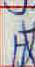

--------------------
第 1148 張圖片
模型預測字為: 娥
預測機率為: 0.37
照片名稱為: 16605_成.jpg


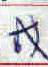

--------------------
第 1149 張圖片
模型預測字為: 城
預測機率為: 0.56
照片名稱為: 63467_成.jpg


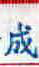

--------------------
第 1150 張圖片
模型預測字為: 琳
預測機率為: 0.24
照片名稱為: 42505_翰.jpg


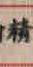

--------------------
第 1151 張圖片
模型預測字為: 瀚
預測機率為: 0.81
照片名稱為: 11249_翰.jpg


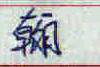

--------------------
第 1152 張圖片
模型預測字為: 瑜
預測機率為: 0.71
照片名稱為: 28624_翰.jpg


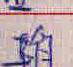

--------------------
第 1153 張圖片
模型預測字為: 瀚
預測機率為: 1.0
照片名稱為: 60133_翰.jpg


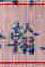

--------------------
第 1154 張圖片
模型預測字為: 瀚
預測機率為: 0.95
照片名稱為: 38487_翰.jpg


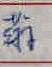

--------------------
第 1155 張圖片
模型預測字為: 瀚
預測機率為: 1.0
照片名稱為: 58163_翰.jpg


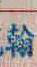

--------------------
第 1156 張圖片
模型預測字為: 份
預測機率為: 0.18
照片名稱為: 40440_分.jpg


--------------------
第 1157 張圖片
模型預測字為: 易
預測機率為: 0.25
照片名稱為: 67434_分.jpg


--------------------
第 1158 張圖片
模型預測字為: 公
預測機率為: 0.68
照片名稱為: 24304_分.jpg


--------------------
第 1159 張圖片
模型預測字為: 漁
預測機率為: 0.92
照片名稱為: 46382_順.jpg


--------------------
第 1160 張圖片
模型預測字為: isnull
預測機率為: 0.77
照片名稱為: 57943_順.jpg


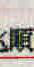

--------------------
第 1161 張圖片
模型預測字為: 浩
預測機率為: 0.94
照片名稱為: 50978_活.jpg


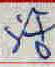

--------------------
第 1162 張圖片
模型預測字為: 動
預測機率為: 0.94
照片名稱為: 68119_活.jpg


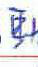

--------------------
第 1163 張圖片
模型預測字為: isnull
預測機率為: 0.45
照片名稱為: 52383_活.jpg


--------------------
第 1164 張圖片
模型預測字為: 雲
預測機率為: 0.36
照片名稱為: 56951_惠.jpg


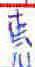

--------------------
第 1165 張圖片
模型預測字為: isnull
預測機率為: 0.27
照片名稱為: 49129_惠.jpg


--------------------
第 1166 張圖片
模型預測字為: 雪
預測機率為: 0.32
照片名稱為: 5522_惠.jpg


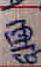

--------------------
第 1167 張圖片
模型預測字為: 馬
預測機率為: 0.51
照片名稱為: 8344_惠.jpg


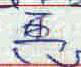

--------------------
第 1168 張圖片
模型預測字為: 唐
預測機率為: 0.21
照片名稱為: 30125_惠.jpg


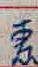

--------------------
第 1169 張圖片
模型預測字為: 馬
預測機率為: 0.84
照片名稱為: 20885_惠.jpg


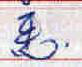

--------------------
第 1170 張圖片
模型預測字為: 腦
預測機率為: 0.86
照片名稱為: 43177_份.jpg


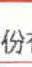

--------------------
第 1171 張圖片
模型預測字為: 腦
預測機率為: 0.65
照片名稱為: 64940_份.jpg


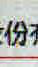

--------------------
第 1172 張圖片
模型預測字為: 克
預測機率為: 0.26
照片名稱為: 66358_逸.jpg


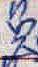

--------------------
第 1173 張圖片
模型預測字為: 海
預測機率為: 0.87
照片名稱為: 11270_逸.jpg


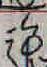

--------------------
第 1174 張圖片
模型預測字為: 寬
預測機率為: 0.37
照片名稱為: 29615_宇.jpg


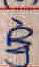

--------------------
第 1175 張圖片
模型預測字為: 定
預測機率為: 0.59
照片名稱為: 65752_宇.jpg


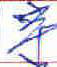

--------------------
第 1176 張圖片
模型預測字為: 企
預測機率為: 0.49
照片名稱為: 19666_介.jpg


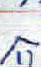

--------------------
第 1177 張圖片
模型預測字為: 企
預測機率為: 0.51
照片名稱為: 26057_介.jpg


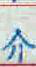

--------------------
第 1178 張圖片
模型預測字為: 公
預測機率為: 0.87
照片名稱為: 21130_介.jpg


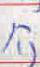

--------------------
第 1179 張圖片
模型預測字為: 珍
預測機率為: 0.26
照片名稱為: 41140_介.jpg


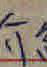

--------------------
第 1180 張圖片
模型預測字為: 法
預測機率為: 0.32
照片名稱為: 7614_幸.jpg


--------------------
第 1181 張圖片
模型預測字為: 達
預測機率為: 0.78
照片名稱為: 13407_幸.jpg


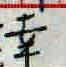

--------------------
第 1182 張圖片
模型預測字為: 報
預測機率為: 0.93
照片名稱為: 46869_幸.jpg


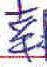

--------------------
第 1183 張圖片
模型預測字為: 璟
預測機率為: 0.9
照片名稱為: 19766_瓊.jpg


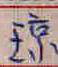

--------------------
第 1184 張圖片
模型預測字為: isnull
預測機率為: 0.36
照片名稱為: 18454_瓊.jpg


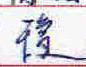

--------------------
第 1185 張圖片
模型預測字為: isnull
預測機率為: 0.6
照片名稱為: 48716_瓊.jpg


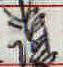

--------------------
第 1186 張圖片
模型預測字為: isnull
預測機率為: 0.92
照片名稱為: 27336_瓊.jpg


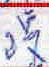

--------------------
第 1187 張圖片
模型預測字為: 境
預測機率為: 0.6
照片名稱為: 40308_憶.jpg


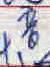

--------------------
第 1188 張圖片
模型預測字為: 詠
預測機率為: 0.8
照片名稱為: 7467_詩.jpg


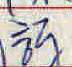

--------------------
第 1189 張圖片
模型預測字為: 民
預測機率為: 0.38
照片名稱為: 28969_產.jpg


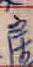

--------------------
第 1190 張圖片
模型預測字為: 壽
預測機率為: 0.48
照片名稱為: 42996_產.jpg


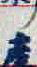

--------------------
第 1191 張圖片
模型預測字為: 牙
預測機率為: 0.65
照片名稱為: 60433_可.jpg


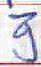

--------------------
第 1192 張圖片
模型預測字為: 何
預測機率為: 0.72
照片名稱為: 26875_可.jpg


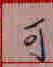

--------------------
第 1193 張圖片
模型預測字為: 品
預測機率為: 0.83
照片名稱為: 47753_晶.jpg


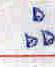

--------------------
第 1194 張圖片
模型預測字為: 秋
預測機率為: 0.29
照片名稱為: 31746_禾.jpg


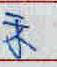

--------------------
第 1195 張圖片
模型預測字為: 公
預測機率為: 0.26
照片名稱為: 50516_禾.jpg


--------------------
第 1196 張圖片
模型預測字為: 彩
預測機率為: 0.76
照片名稱為: 43156_禾.jpg


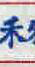

--------------------
第 1197 張圖片
模型預測字為: 余
預測機率為: 0.8
照片名稱為: 28042_禾.jpg


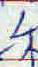

--------------------
第 1198 張圖片
模型預測字為: 天
預測機率為: 0.97
照片名稱為: 61284_禾.jpg


--------------------
第 1199 張圖片
模型預測字為: 木
預測機率為: 0.42
照片名稱為: 41435_禾.jpg


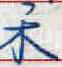

--------------------
第 1200 張圖片
模型預測字為: isnull
預測機率為: 0.24
照片名稱為: 51063_禾.jpg


--------------------
第 1201 張圖片
模型預測字為: 宋
預測機率為: 0.32
照片名稱為: 54641_禾.jpg


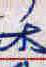

--------------------
第 1202 張圖片
模型預測字為: 壽
預測機率為: 0.86
照片名稱為: 16520_籌.jpg


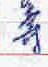

--------------------
第 1203 張圖片
模型預測字為: 壽
預測機率為: 0.15
照片名稱為: 9218_籌.jpg


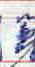

--------------------
第 1204 張圖片
模型預測字為: 診
預測機率為: 0.87
照片名稱為: 23102_冷.jpg


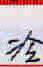

--------------------
第 1205 張圖片
模型預測字為: 趙
預測機率為: 0.95
照片名稱為: 41706_超.jpg


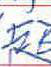

--------------------
第 1206 張圖片
模型預測字為: 械
預測機率為: 0.2
照片名稱為: 52051_桃.jpg


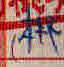

--------------------
第 1207 張圖片
模型預測字為: isnull
預測機率為: 0.09
照片名稱為: 49336_桃.jpg


--------------------
第 1208 張圖片
模型預測字為: 全
預測機率為: 0.48
照片名稱為: 39499_余.jpg


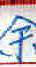

--------------------
第 1209 張圖片
模型預測字為: 美
預測機率為: 0.38
照片名稱為: 54818_善.jpg


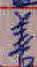

--------------------
第 1210 張圖片
模型預測字為: 境
預測機率為: 0.57
照片名稱為: 47075_吳.jpg


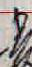

--------------------
第 1211 張圖片
模型預測字為: 昌
預測機率為: 0.6
照片名稱為: 29718_吳.jpg


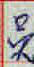

--------------------
第 1212 張圖片
模型預測字為: isnull
預測機率為: 0.28
照片名稱為: 39962_嬌.jpg


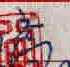

--------------------
第 1213 張圖片
模型預測字為: isnull
預測機率為: 0.43
照片名稱為: 16890_東.jpg


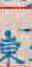

--------------------
第 1214 張圖片
模型預測字為: 璟
預測機率為: 0.74
照片名稱為: 15903_環.jpg


--------------------
第 1215 張圖片
模型預測字為: 義
預測機率為: 0.27
照片名稱為: 888_環.jpg


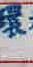

--------------------
第 1216 張圖片
模型預測字為: 碧
預測機率為: 0.34
照片名稱為: 8901_靖.jpg


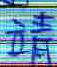

--------------------
第 1217 張圖片
模型預測字為: 弘
預測機率為: 0.23
照片名稱為: 36810_言.jpg


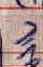

--------------------
第 1218 張圖片
模型預測字為: 竑
預測機率為: 0.98
照片名稱為: 25259_紘.jpg


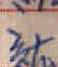

--------------------
第 1219 張圖片
模型預測字為: 竑
預測機率為: 0.99
照片名稱為: 61220_紘.jpg


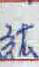

--------------------
第 1220 張圖片
模型預測字為: 紙
預測機率為: 0.37
照片名稱為: 43086_紘.jpg


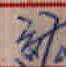

--------------------
第 1221 張圖片
模型預測字為: 章
預測機率為: 0.31
照片名稱為: 63552_晉.jpg


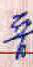

--------------------
第 1222 張圖片
模型預測字為: 敬
預測機率為: 0.63
照片名稱為: 63167_教.jpg


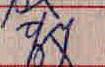

--------------------
第 1223 張圖片
模型預測字為: 敬
預測機率為: 0.82
照片名稱為: 50924_教.jpg


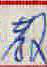

--------------------
第 1224 張圖片
模型預測字為: 傅
預測機率為: 0.43
照片名稱為: 19237_博.jpg


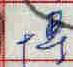

--------------------
第 1225 張圖片
模型預測字為: 傳
預測機率為: 0.53
照片名稱為: 7962_博.jpg


--------------------
第 1226 張圖片
模型預測字為: 海
預測機率為: 0.95
照片名稱為: 60988_博.jpg


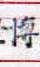

--------------------
第 1227 張圖片
模型預測字為: 眾
預測機率為: 0.42
照片名稱為: 9842_茹.jpg


--------------------
第 1228 張圖片
模型預測字為: 門
預測機率為: 0.78
照片名稱為: 15739_茹.jpg


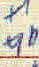

--------------------
第 1229 張圖片
模型預測字為: 寬
預測機率為: 0.86
照片名稱為: 3780_賀.jpg


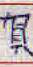

--------------------
第 1230 張圖片
模型預測字為: 貞
預測機率為: 0.4
照片名稱為: 39341_賀.jpg


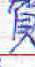

--------------------
第 1231 張圖片
模型預測字為: 晉
預測機率為: 0.88
照片名稱為: 65270_賀.jpg


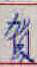

--------------------
第 1232 張圖片
模型預測字為: 愷
預測機率為: 0.25
照片名稱為: 37438_鼎.jpg


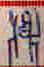

--------------------
第 1233 張圖片
模型預測字為: 洲
預測機率為: 0.43
照片名稱為: 16745_沙.jpg


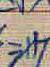

--------------------
第 1234 張圖片
模型預測字為: 法
預測機率為: 0.61
照片名稱為: 55967_沙.jpg


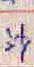

--------------------
第 1235 張圖片
模型預測字為: 游
預測機率為: 0.69
照片名稱為: 26013_沙.jpg


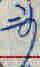

--------------------
第 1236 張圖片
模型預測字為: 蘇
預測機率為: 0.67
照片名稱為: 24421_蓉.jpg


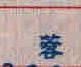

--------------------
第 1237 張圖片
模型預測字為: 容
預測機率為: 0.66
照片名稱為: 27925_蓉.jpg


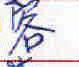

--------------------
第 1238 張圖片
模型預測字為: 傅
預測機率為: 0.61
照片名稱為: 9886_傳.jpg


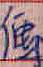

--------------------
第 1239 張圖片
模型預測字為: 傅
預測機率為: 0.83
照片名稱為: 23302_傳.jpg


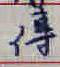

--------------------
第 1240 張圖片
模型預測字為: 傅
預測機率為: 0.63
照片名稱為: 52729_傳.jpg


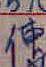

--------------------
第 1241 張圖片
模型預測字為: 佳
預測機率為: 0.59
照片名稱為: 51668_傳.jpg


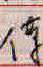

--------------------
第 1242 張圖片
模型預測字為: 怡
預測機率為: 0.79
照片名稱為: 36366_腦.jpg


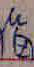

--------------------
第 1243 張圖片
模型預測字為: 娥
預測機率為: 0.7
照片名稱為: 64549_珠.jpg


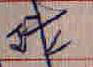

--------------------
第 1244 張圖片
模型預測字為: 桂
預測機率為: 0.57
照片名稱為: 63084_拉.jpg


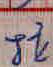

--------------------
第 1245 張圖片
模型預測字為: 藥
預測機率為: 0.45
照片名稱為: 18981_蘇.jpg


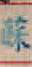

--------------------
第 1246 張圖片
模型預測字為: 樹
預測機率為: 0.48
照片名稱為: 39879_蘇.jpg


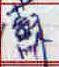

--------------------
第 1247 張圖片
模型預測字為: 敏
預測機率為: 0.62
照片名稱為: 15248_航.jpg


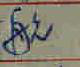

--------------------
第 1248 張圖片
模型預測字為: 忠
預測機率為: 0.58
照片名稱為: 21754_中.jpg


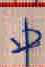

--------------------
第 1249 張圖片
模型預測字為: 作
預測機率為: 0.93
照片名稱為: 65368_位.jpg


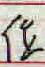

--------------------
第 1250 張圖片
模型預測字為: 侯
預測機率為: 0.7
照片名稱為: 6153_位.jpg


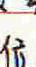

--------------------
第 1251 張圖片
模型預測字為: 份
預測機率為: 0.69
照片名稱為: 43939_位.jpg


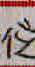

--------------------
第 1252 張圖片
模型預測字為: 佳
預測機率為: 0.78
照片名稱為: 34619_位.jpg


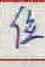

--------------------
第 1253 張圖片
模型預測字為: 峰
預測機率為: 0.65
照片名稱為: 66485_修.jpg


--------------------
第 1254 張圖片
模型預測字為: 介
預測機率為: 0.37
照片名稱為: 56807_修.jpg


--------------------
第 1255 張圖片
模型預測字為: 木
預測機率為: 0.31
照片名稱為: 26409_米.jpg


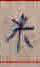

--------------------
第 1256 張圖片
模型預測字為: 采
預測機率為: 0.53
照片名稱為: 22773_米.jpg


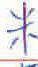

--------------------
第 1257 張圖片
模型預測字為: 中
預測機率為: 0.3
照片名稱為: 66639_米.jpg


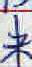

--------------------
第 1258 張圖片
模型預測字為: 平
預測機率為: 0.46
照片名稱為: 51102_米.jpg


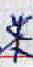

--------------------
第 1259 張圖片
模型預測字為: 光
預測機率為: 0.43
照片名稱為: 21624_米.jpg


--------------------
第 1260 張圖片
模型預測字為: 瑞
預測機率為: 0.37
照片名稱為: 9103_清.jpg


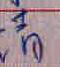

--------------------
第 1261 張圖片
模型預測字為: 碩
預測機率為: 0.77
照片名稱為: 61302_鎮.jpg


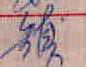

--------------------
第 1262 張圖片
模型預測字為: 華
預測機率為: 0.82
照片名稱為: 35536_新.jpg


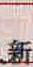

--------------------
第 1263 張圖片
模型預測字為: 昕
預測機率為: 1.0
照片名稱為: 51515_新.jpg


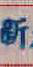

--------------------
第 1264 張圖片
模型預測字為: 呈
預測機率為: 0.31
照片名稱為: 33796_年.jpg


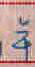

--------------------
第 1265 張圖片
模型預測字為: 梅
預測機率為: 0.37
照片名稱為: 52293_妤.jpg


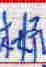

--------------------
第 1266 張圖片
模型預測字為: 舒
預測機率為: 0.84
照片名稱為: 49769_妤.jpg


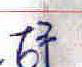

--------------------
第 1267 張圖片
模型預測字為: 食
預測機率為: 0.65
照片名稱為: 34447_良.jpg


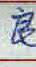

--------------------
第 1268 張圖片
模型預測字為: 君
預測機率為: 0.46
照片名稱為: 21460_良.jpg


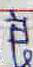

--------------------
第 1269 張圖片
模型預測字為: 祐
預測機率為: 0.28
照片名稱為: 17778_衣.jpg


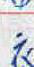

--------------------
第 1270 張圖片
模型預測字為: 店
預測機率為: 0.36
照片名稱為: 9321_衣.jpg


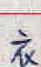

--------------------
第 1271 張圖片
模型預測字為: 翠
預測機率為: 0.37
照片名稱為: 9533_華.jpg


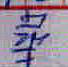

--------------------
第 1272 張圖片
模型預測字為: 皇
預測機率為: 0.72
照片名稱為: 1883_長.jpg


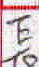

--------------------
第 1273 張圖片
模型預測字為: 岳
預測機率為: 0.83
照片名稱為: 19304_長.jpg


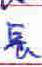

--------------------
第 1274 張圖片
模型預測字為: isnull
預測機率為: 0.56
照片名稱為: 29631_姚.jpg


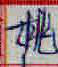

--------------------
第 1275 張圖片
模型預測字為: 誼
預測機率為: 0.89
照片名稱為: 30692_語.jpg


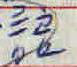

--------------------
第 1276 張圖片
模型預測字為: 芬
預測機率為: 0.29
照片名稱為: 36409_若.jpg


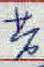

--------------------
第 1277 張圖片
模型預測字為: 教
預測機率為: 0.47
照片名稱為: 53854_若.jpg


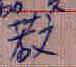

--------------------
第 1278 張圖片
模型預測字為: 苗
預測機率為: 0.59
照片名稱為: 11959_世.jpg


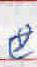

--------------------
第 1279 張圖片
模型預測字為: 婕
預測機率為: 0.71
照片名稱為: 4722_捷.jpg


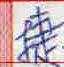

--------------------
第 1280 張圖片
模型預測字為: 婕
預測機率為: 0.75
照片名稱為: 63504_捷.jpg


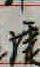

--------------------
第 1281 張圖片
模型預測字為: 觀
預測機率為: 0.73
照片名稱為: 27095_期.jpg


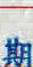

--------------------
第 1282 張圖片
模型預測字為: 財
預測機率為: 0.32
照片名稱為: 57701_期.jpg


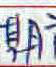

--------------------
第 1283 張圖片
模型預測字為: 豐
預測機率為: 0.92
照片名稱為: 36065_製.jpg


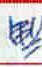

--------------------
第 1284 張圖片
模型預測字為: 珮
預測機率為: 0.37
照片名稱為: 60164_風.jpg


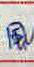

--------------------
第 1285 張圖片
模型預測字為: 鳳
預測機率為: 0.82
照片名稱為: 22572_風.jpg


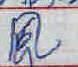

--------------------
第 1286 張圖片
模型預測字為: 源
預測機率為: 0.2
照片名稱為: 9332_風.jpg


--------------------
第 1287 張圖片
模型預測字為: 鳳
預測機率為: 0.93
照片名稱為: 12024_風.jpg


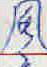

--------------------
第 1288 張圖片
模型預測字為: 欣
預測機率為: 0.86
照片名稱為: 55399_風.jpg


--------------------
第 1289 張圖片
模型預測字為: 同
預測機率為: 0.62
照片名稱為: 62016_風.jpg


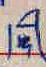

--------------------
第 1290 張圖片
模型預測字為: 朱
預測機率為: 0.29
照片名稱為: 41008_永.jpg


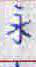

--------------------
第 1291 張圖片
模型預測字為: 水
預測機率為: 0.63
照片名稱為: 42448_永.jpg


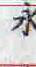

--------------------
第 1292 張圖片
模型預測字為: 方
預測機率為: 0.75
照片名稱為: 18715_芳.jpg


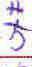

--------------------
第 1293 張圖片
模型預測字為: 堯
預測機率為: 0.82
照片名稱為: 61287_芳.jpg


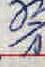

--------------------
第 1294 張圖片
模型預測字為: 偉
預測機率為: 0.76
照片名稱為: 23244_韋.jpg


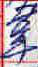

--------------------
第 1295 張圖片
模型預測字為: 幸
預測機率為: 0.46
照片名稱為: 53993_韋.jpg


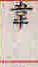

--------------------
第 1296 張圖片
模型預測字為: 賴
預測機率為: 0.58
照片名稱為: 46148_昭.jpg


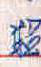

--------------------
第 1297 張圖片
模型預測字為: 織
預測機率為: 0.91
照片名稱為: 8607_維.jpg


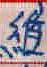

--------------------
第 1298 張圖片
模型預測字為: 汽
預測機率為: 0.34
照片名稱為: 20256_維.jpg


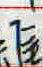

--------------------
第 1299 張圖片
模型預測字為: 食
預測機率為: 0.76
照片名稱為: 68684_倉.jpg


--------------------
第 1300 張圖片
模型預測字為: 合
預測機率為: 0.58
照片名稱為: 37223_倉.jpg


--------------------
第 1301 張圖片
模型預測字為: 堂
預測機率為: 0.54
照片名稱為: 4435_學.jpg


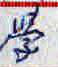

--------------------
第 1302 張圖片
模型預測字為: 輝
預測機率為: 0.26
照片名稱為: 24446_學.jpg


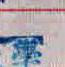

--------------------
第 1303 張圖片
模型預測字為: 定
預測機率為: 0.5
照片名稱為: 58584_守.jpg


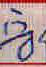

--------------------
第 1304 張圖片
模型預測字為: 藥
預測機率為: 0.69
照片名稱為: 22700_樂.jpg


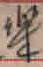

--------------------
第 1305 張圖片
模型預測字為: 藥
預測機率為: 0.59
照片名稱為: 65690_樂.jpg


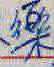

--------------------
第 1306 張圖片
模型預測字為: 築
預測機率為: 0.95
照片名稱為: 62096_樂.jpg


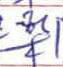

--------------------
第 1307 張圖片
模型預測字為: 藥
預測機率為: 0.69
照片名稱為: 7624_樂.jpg


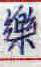

--------------------
第 1308 張圖片
模型預測字為: 如
預測機率為: 0.61
照片名稱為: 2214_加.jpg


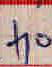

--------------------
第 1309 張圖片
模型預測字為: 琳
預測機率為: 0.55
照片名稱為: 1228_彬.jpg


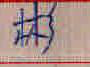

--------------------
第 1310 張圖片
模型預測字為: isnull
預測機率為: 0.93
照片名稱為: 7120_希.jpg


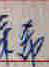

--------------------
第 1311 張圖片
模型預測字為: 聯
預測機率為: 0.39
照片名稱為: 50277_照.jpg


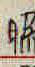

--------------------
第 1312 張圖片
模型預測字為: 訊
預測機率為: 0.54
照片名稱為: 44091_計.jpg


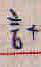

--------------------
第 1313 張圖片
模型預測字為: 電
預測機率為: 1.0
照片名稱為: 60418_菱.jpg


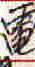

--------------------
第 1314 張圖片
模型預測字為: 威
預測機率為: 0.42
照片名稱為: 26607_厚.jpg


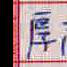

--------------------
第 1315 張圖片
模型預測字為: 有
預測機率為: 0.94
照片名稱為: 21974_厚.jpg


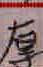

--------------------
第 1316 張圖片
模型預測字為: 員
預測機率為: 0.44
照片名稱為: 8832_厚.jpg


--------------------
第 1317 張圖片
模型預測字為: 正
預測機率為: 0.29
照片名稱為: 56764_巧.jpg


--------------------
第 1318 張圖片
模型預測字為: 亞
預測機率為: 0.44
照片名稱為: 37516_巧.jpg


--------------------
第 1319 張圖片
模型預測字為: isnull
預測機率為: 0.35
照片名稱為: 29444_衛.jpg


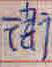

--------------------
第 1320 張圖片
模型預測字為: 電
預測機率為: 0.33
照片名稱為: 47014_市.jpg


--------------------
第 1321 張圖片
模型預測字為: 沛
預測機率為: 0.66
照片名稱為: 29329_市.jpg


--------------------
第 1322 張圖片
模型預測字為: 希
預測機率為: 0.62
照片名稱為: 44936_市.jpg


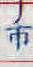

--------------------
第 1323 張圖片
模型預測字為: 希
預測機率為: 0.35
照片名稱為: 49898_市.jpg


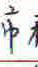

--------------------
第 1324 張圖片
模型預測字為: 彩
預測機率為: 0.48
照片名稱為: 35230_私.jpg


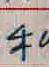

--------------------
第 1325 張圖片
模型預測字為: 和
預測機率為: 0.97
照片名稱為: 31060_私.jpg


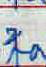

--------------------
第 1326 張圖片
模型預測字為: 于
預測機率為: 0.35
照片名稱為: 5875_私.jpg


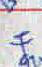

--------------------
第 1327 張圖片
模型預測字為: 利
預測機率為: 0.54
照片名稱為: 58206_私.jpg


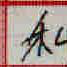

--------------------
第 1328 張圖片
模型預測字為: isnull
預測機率為: 0.39
照片名稱為: 7278_處.jpg


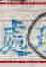

--------------------
第 1329 張圖片
模型預測字為: 盧
預測機率為: 0.63
照片名稱為: 57948_處.jpg


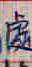

--------------------
第 1330 張圖片
模型預測字為: 蘇
預測機率為: 0.6
照片名稱為: 50045_嘉.jpg


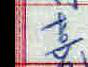

--------------------
第 1331 張圖片
模型預測字為: 任
預測機率為: 0.92
照片名稱為: 16284_仕.jpg


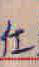

--------------------
第 1332 張圖片
模型預測字為: 訊
預測機率為: 0.45
照片名稱為: 12594_弘.jpg


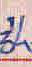

--------------------
第 1333 張圖片
模型預測字為: 淨
預測機率為: 0.48
照片名稱為: 46058_舜.jpg


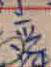

--------------------
第 1334 張圖片
模型預測字為: 羅
預測機率為: 0.83
照片名稱為: 58466_眾.jpg


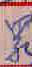

--------------------
第 1335 張圖片
模型預測字為: isnull
預測機率為: 0.21
照片名稱為: 21926_眾.jpg


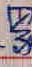

--------------------
第 1336 張圖片
模型預測字為: 賃
預測機率為: 0.35
照片名稱為: 2493_復.jpg


--------------------
第 1337 張圖片
模型預測字為: 得
預測機率為: 0.53
照片名稱為: 28137_復.jpg


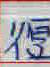

--------------------
第 1338 張圖片
模型預測字為: 得
預測機率為: 0.55
照片名稱為: 7530_復.jpg


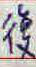

--------------------
第 1339 張圖片
模型預測字為: 紀
預測機率為: 0.4
照片名稱為: 61206_紹.jpg


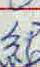

--------------------
第 1340 張圖片
模型預測字為: 超
預測機率為: 0.25
照片名稱為: 32805_紹.jpg


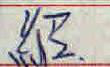

--------------------
第 1341 張圖片
模型預測字為: 浩
預測機率為: 0.99
照片名稱為: 26316_湯.jpg


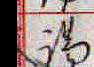

--------------------
第 1342 張圖片
模型預測字為: 得
預測機率為: 0.47
照片名稱為: 55452_湯.jpg


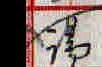

--------------------
第 1343 張圖片
模型預測字為: 蓉
預測機率為: 0.88
照片名稱為: 5870_勤.jpg


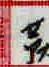

--------------------
第 1344 張圖片
模型預測字為: 助
預測機率為: 0.69
照片名稱為: 37756_勤.jpg


--------------------
第 1345 張圖片
模型預測字為: 林
預測機率為: 0.22
照片名稱為: 6113_木.jpg


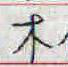

--------------------
第 1346 張圖片
模型預測字為: 利
預測機率為: 0.35
照片名稱為: 12928_木.jpg


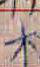

--------------------
第 1347 張圖片
模型預測字為: 董
預測機率為: 0.54
照片名稱為: 13033_策.jpg


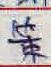

--------------------
第 1348 張圖片
模型預測字為: 年
預測機率為: 0.52
照片名稱為: 24923_策.jpg


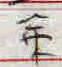

--------------------
第 1349 張圖片
模型預測字為: 築
預測機率為: 0.35
照片名稱為: 15614_策.jpg


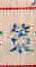

--------------------
第 1350 張圖片
模型預測字為: 徐
預測機率為: 0.57
照片名稱為: 19070_觀.jpg


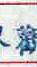

--------------------
第 1351 張圖片
模型預測字為: 築
預測機率為: 0.26
照片名稱為: 65043_聚.jpg


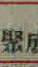

--------------------
第 1352 張圖片
模型預測字為: isnull
預測機率為: 0.54
照片名稱為: 14491_聚.jpg


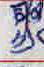

--------------------
第 1353 張圖片
模型預測字為: 眾
預測機率為: 0.93
照片名稱為: 4624_聚.jpg


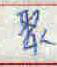

--------------------
第 1354 張圖片
模型預測字為: 眾
預測機率為: 0.61
照片名稱為: 15254_聚.jpg


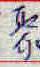

--------------------
第 1355 張圖片
模型預測字為: isnull
預測機率為: 0.61
照片名稱為: 63936_融.jpg


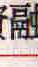

--------------------
第 1356 張圖片
模型預測字為: 圓
預測機率為: 0.6
照片名稱為: 31432_圖.jpg


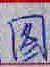

--------------------
第 1357 張圖片
模型預測字為: 紙
預測機率為: 0.24
照片名稱為: 4824_鋼.jpg


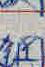

--------------------
第 1358 張圖片
模型預測字為: 董
預測機率為: 0.67
照片名稱為: 8732_萬.jpg


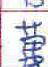

--------------------
第 1359 張圖片
模型預測字為: isnull
預測機率為: 0.96
照片名稱為: 65617_萬.jpg


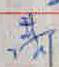

--------------------
第 1360 張圖片
模型預測字為: 蘇
預測機率為: 0.91
照片名稱為: 13469_萬.jpg


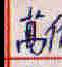

--------------------
第 1361 張圖片
模型預測字為: 蘇
預測機率為: 0.41
照片名稱為: 55897_萬.jpg


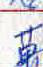

--------------------
第 1362 張圖片
模型預測字為: 寓
預測機率為: 0.97
照片名稱為: 6352_萬.jpg


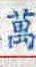

--------------------
第 1363 張圖片
模型預測字為: 李
預測機率為: 0.75
照片名稱為: 9448_本.jpg


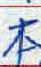

--------------------
第 1364 張圖片
模型預測字為: 李
預測機率為: 0.86
照片名稱為: 39233_本.jpg


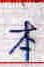

--------------------
第 1365 張圖片
模型預測字為: 李
預測機率為: 0.89
照片名稱為: 55895_本.jpg


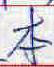

--------------------
第 1366 張圖片
模型預測字為: 李
預測機率為: 0.99
照片名稱為: 2017_本.jpg


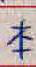

--------------------
第 1367 張圖片
模型預測字為: 道
預測機率為: 0.82
照片名稱為: 50506_首.jpg


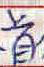

--------------------
第 1368 張圖片
模型預測字為: 道
預測機率為: 0.35
照片名稱為: 26625_首.jpg


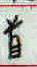

--------------------
第 1369 張圖片
模型預測字為: 得
預測機率為: 0.37
照片名稱為: 47520_旻.jpg


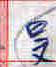

--------------------
第 1370 張圖片
模型預測字為: 偉
預測機率為: 0.89
照片名稱為: 2725_煒.jpg


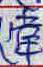

--------------------
第 1371 張圖片
模型預測字為: 榕
預測機率為: 0.86
照片名稱為: 41077_煒.jpg


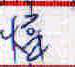

--------------------
第 1372 張圖片
模型預測字為: 銘
預測機率為: 0.93
照片名稱為: 56397_鋁.jpg


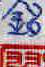

--------------------
第 1373 張圖片
模型預測字為: 忠
預測機率為: 0.32
照片名稱為: 21208_央.jpg


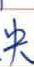

--------------------
第 1374 張圖片
模型預測字為: 樂
預測機率為: 0.44
照片名稱為: 324_仙.jpg


--------------------
第 1375 張圖片
模型預測字為: 化
預測機率為: 0.25
照片名稱為: 7188_仙.jpg


--------------------
第 1376 張圖片
模型預測字為: 流
預測機率為: 0.97
照片名稱為: 54508_添.jpg


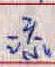

--------------------
第 1377 張圖片
模型預測字為: 孟
預測機率為: 0.75
照片名稱為: 23798_色.jpg


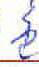

--------------------
第 1378 張圖片
模型預測字為: 海
預測機率為: 0.53
照片名稱為: 64822_色.jpg


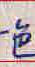

--------------------
第 1379 張圖片
模型預測字為: 重
預測機率為: 0.87
照片名稱為: 67166_董.jpg


--------------------
第 1380 張圖片
模型預測字為: 蕙
預測機率為: 0.64
照片名稱為: 61279_董.jpg


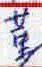

--------------------


In [ ]:
# 觀察預測錯誤之照片
count = 0
for ix, elem in enumerate(predProbResult): 
    if predictText[ix] != re.findall("\d+_(\w+).\w+", validImageNameList[ix])[0]:
        print('第', count, '張圖片')
        count = count + 1
        print('模型預測字為:', predictText[ix])
        print('預測機率為:', round(predProbResult[ix], 2))
        print('照片名稱為:', validImageNameList[ix])
        display(Image.open(imagePath + validImageNameList[ix]))
        print('--------------------')

# 五、機器可解釋模型(SHAP)

In [ ]:
# 利用SHAP套件觀察模型如何預測
# 準備前置資料
train_analysis_loader = DataLoader(dataset_train, batch_size=2048, shuffle=True, num_workers=2)
train_features, train_labels = next(iter(train_loader))
train_features = train_features.to(device)
train_labels = train_labels.to(device)

In [ ]:
# 執行SHAP模型
explainer = shap.GradientExplainer(model=model_ft, data=train_features)

In [ ]:
# NormalizeInverse
class NormalizeInverse(torchvision.transforms.Normalize):
    """
    Undoes the normalization and returns the reconstructed images in the input domain.
    """

    def __init__(self, mean, std):
        mean = torch.as_tensor(mean)
        std = torch.as_tensor(std)
        std_inv = 1 / (std + 1e-7)
        mean_inv = -mean * std_inv
        super().__init__(mean=mean_inv, std=std_inv)

    def __call__(self, tensor):
        return super().__call__(tensor.clone())

In [ ]:
# SHAP分析結果-多張照片
analysis_loader = DataLoader(dataset_val, batch_size=20, shuffle=True, num_workers=2)
analysis_features, analysis_labels = next(iter(analysis_loader))
analysis_features = analysis_features.to(device)
analysis_labels = analysis_labels.to(device)
shap_values, indexes = explainer.shap_values(analysis_features, ranked_outputs=3)
indexes = indexes.to('cpu')
explainImgArray = analysis_features.to('cpu')
normalRev = NormalizeInverse(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
explainImgArray = normalRev(explainImgArray)*255
explainImgArray = np.transpose(explainImgArray.numpy(), (0, 2, 3, 1))  # 調整dim 配合SHAP需求:(1, 224, 224, 3) (張數編號, 長, 寬, RGB)
shap_values = [np.transpose(elem, (0, 2, 3, 1)) for elem in shap_values]  # 調整dim 配合SHAP需求:(1, 224, 224, 3) (張數編號, 長, 寬, RGB)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

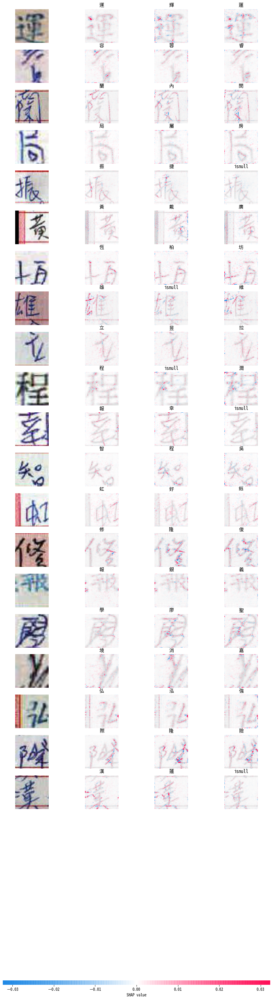

In [ ]:
# 繪製SHAP分析結果
originImgs = np.asarray(explainImgArray, dtype = float)

# 整理該字的分類對應編號
index_names = np.vectorize(lambda x: key_list[val_list.index(x)])(indexes)

# 繪製圖形
shap.image_plot(shap_values, originImgs, index_names)

In [ ]:
# SHAP分析結果-指定照片
explainImgName = imagePath + validImageNameList[3000]
explainImgArray = transforms_test(Image.open(explainImgName)).unsqueeze(0).to(device)
shap_values, indexes = explainer.shap_values(explainImgArray, ranked_outputs=3)
indexes = indexes.to('cpu')
explainImgArray = explainImgArray.to('cpu')
explainImgArray = np.transpose(explainImgArray.numpy(), (0, 2, 3, 1))  # 調整dim 配合SHAP需求:(1, 224, 224, 3) (張數編號, 長, 寬, RGB)
shap_values = [np.transpose(elem, (0, 2, 3, 1)) for elem in shap_values]  # 調整dim 配合SHAP需求:(1, 224, 224, 3) (張數編號, 長, 寬, RGB)

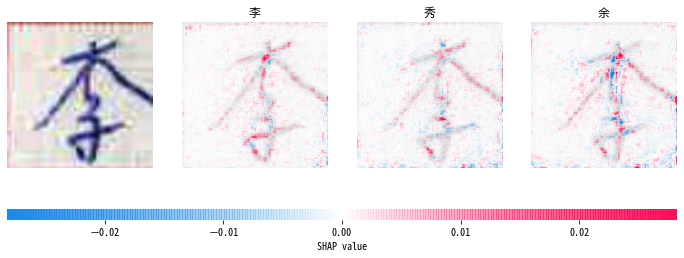

In [ ]:
# 繪製SHAP分析結果
# 整理原始照片
transformImg = transforms.Compose([
  transforms.Resize(input_size),
  transforms.CenterCrop(input_size)
])
originImg = np.expand_dims(np.asarray(transformImg(Image.open(explainImgName)), dtype = float), axis=0)

# 整理該字的分類對應編號
index_names = np.vectorize(lambda x: key_list[val_list.index(x)])(indexes)

# 繪製圖形
shap.image_plot(shap_values, originImg, index_names)